# Libraries

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%config Completer.use_jedi = False
%load_ext memory_profiler
%load_ext line_profiler

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import io
import pickle
import zipfile
import math
import random
import geopandas
import adjustText

from collections import defaultdict
from sklearn.metrics import ndcg_score
from scipy.stats import entropy, pearsonr, kendalltau, norm
from scipy.spatial.distance import cosine
from scipy.linalg import eigvalsh
from scipy.linalg import norm as normf
from arch.unitroot import DFGLS

import sys
sys.path.insert(1, '../')
from helpers.io import read_classes, read_as_directed_hyperedge_list, process_data_nl_contagion, read_as_edge_list
from helpers.config import num_samples, seed, eig_num, swaps_num 
from helpers.config import dataset_names, sampler_names

In [3]:
import matplotlib
matplotlib.rcParams['text.usetex'] = True
# matplotlib.rcParams['font.family'] = 'monospace'
# matplotlib.rcParams['font.serif'] = ['Times']
matplotlib.rcParams['font.weight'] = 'bold'
matplotlib.rcParams['axes.labelweight'] = 'bold'
matplotlib.rcParams['axes.spines.top'] = False
matplotlib.rcParams['axes.spines.right'] = False
matplotlib.rcParams['axes.spines.left'] = True
matplotlib.rcParams['axes.spines.bottom'] = True
matplotlib.rcParams['font.size'] = 18
matplotlib.rcParams['axes.grid.axis'] = 'y'
matplotlib.rcParams['axes.titleweight'] = 'bold'
matplotlib.rcParams['axes.labelsize'] = 18
matplotlib.rcParams['xtick.labelsize'] = 16
matplotlib.rcParams['ytick.labelsize'] = 16 
matplotlib.rcParams['legend.markerscale'] = 1
matplotlib.rcParams['legend.fontsize'] = 16

In [4]:
# color palette
colors = [
    '#5941A9', # purple
    '#F71735', # red
    '#FF9000', # orange
    "#119DA4", # cyan
    "#3D1308", # brown
    "#4B9933", #green
    "#ABA9C3", #rose quartz
]

palette = sns.color_palette(colors)

In [5]:
# line styles
lss = [':', '--', '-.', '-', (1,(4,7))]

# Methods

In [6]:
def rename_null_sampler(x):
    if x == 'UnpretentiousNullModel':
        return 'Null' 
    return x

# Paths

In [7]:
results_path = '/Users/giulia/Desktop/nudhy/results/'
data_path = '../data/'

In [8]:
samplers = ['Base', 'BaseD', 'UnpretentiousNullModel', 'NuDHy_A', 'NuDHy_C']
samplers_ord = ['Base', 'BaseD', 'Null', 'NuDHy_A', 'NuDHy_C']

# Reciprocity

In [9]:
met_path = results_path + 'reciprocity/'
root = 'metabolic_iaf1260b'

In [10]:
recip_obs_df = pd.read_csv(f'{met_path}reciprocity_{root}.tsv', sep='\t') 
recip_df = pd.DataFrame()
for f in ['_UnpretentiousNullModel', '_Base', '_BaseD', '']:
    try:
        if recip_df.empty:
            recip_df = pd.read_csv(f'{met_path}reciprocity_{root}_samples{f}.tsv', sep='\t')
        else:
            recip_df = pd.concat([recip_df, pd.read_csv(f'{met_path}reciprocity_{root}_samples{f}.tsv', sep='\t')])
    except Exception as e:
        print(e)

In [91]:
recip_df['Sampler'] = recip_df['Sampler'].apply(lambda x: rename_null_sampler(x))

In [92]:
av = recip_df.groupby(by=['Sampler', 'Sample Id']).agg({'Reciprocity':'mean'})
av = av.reset_index()
av = av.groupby(by=['Sampler']).agg({'Reciprocity':'mean'})
av = av.reset_index()

In [93]:
rr = recip_obs_df[['Reciprocity']].mean().values[0]

In [94]:
av['Diff'] = (rr - av['Reciprocity']) / rr 

In [95]:
av

,Sampler,Reciprocity,Diff
0,Base,0.010768,0.949814
1,BaseD,0.033279,0.844892
2,NuDHy_A,0.131562,0.386813
3,NuDHy_C,0.120193,0.439801
4,Null,0.003913,0.981764


## Compare Results

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


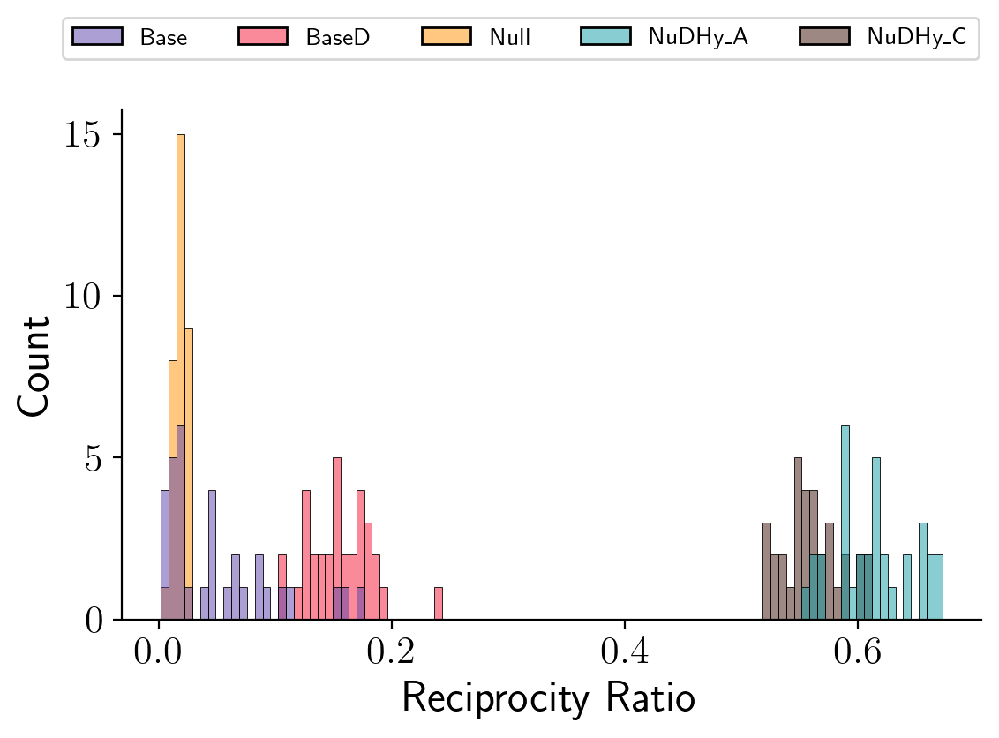

In [99]:
fig, ax = plt.subplots(figsize=(6,4))

avg_rec = recip_df.groupby(by=['Sampler',
                               'Sample Id']).agg({'Reciprocity':'mean'}).reset_index()
recip_obs = recip_obs_df['Reciprocity'].mean()

# ratio between the average reciprocity of the samples
# and the reciprocity of the observed hypergraph
avg_rec['Reciprocity'] = avg_rec['Reciprocity'] / recip_obs

first_col = 0
if 'Base' not in avg_rec['Sampler'].unique():
    first_col = 1
num_samp = len(avg_rec['Sampler'].unique())

sns.histplot(data=avg_rec, hue='Sampler', x='Reciprocity', 
             hue_order=samplers_ord[first_col:],
             bins=100, kde=False, palette=palette[first_col:num_samp], ax=ax)

legend = ax.get_legend()
handles = legend.legend_handles
labels = [text.get_text() for text in legend.get_texts()]
ax.legend().remove()
fig.legend(handles=handles, labels=labels, loc='upper center', 
           bbox_to_anchor=(0.52, 1.08), ncol=5-first_col, fontsize=10)
ax.set_xlabel('Reciprocity Ratio')

plt.tight_layout()
plt.savefig(f'{root}_reciprocity_ratio.pdf', bbox_inches='tight')
plt.show()

# Hyper-Coreness

In [108]:
met_path = results_path + 'coreness/'

In [109]:
root = 'eco01100'

observed hypergraph

In [110]:
coreness_i = pd.read_csv(met_path+f'{root}_coreness_i.tsv', sep='\t')
coreness_o = pd.read_csv(met_path+f'{root}_coreness_o.tsv', sep='\t')
# hypercoreness_i = pd.read_csv(met_path+f'{root}_hypercoreness_i.tsv', sep='\t')
# hypercoreness_o = pd.read_csv(met_path+f'{root}_hypercoreness_o.tsv', sep='\t')

samples

In [111]:
scoreness_i = pd.DataFrame()
scoreness_o = pd.DataFrame()
# shypercoreness_i = pd.DataFrame()
# shypercoreness_o = pd.DataFrame()

In [112]:
for typ in ['i', 'o']:
    for sampler in samplers:
        for sample in range(33):
            # read coreness
            core_path = f'{met_path}{root}__randomSeed_{sample}'
            core_path += f'__algorithm_{sampler}__coreness_{typ}.tsv'
            try:
                tmp = pd.read_csv(core_path, sep='\t')
            except:
                continue
            tmp['Sampler'] = rename_null_sampler(sampler)
            tmp['Sample'] = sample
            if typ == 'i':
                if scoreness_i.empty:
                    scoreness_i = tmp
                else:
                    scoreness_i = pd.concat([scoreness_i, tmp], ignore_index=True)
            else:
                if scoreness_o.empty:
                    scoreness_o = tmp
                else:
                    scoreness_o = pd.concat([scoreness_o, tmp], ignore_index=True)
            # read hypercoreness
#             hcore_path = f'{met_path}{root}__randomSeed_{sample}'
#             hcore_path += f'__algorithm_{sampler}__hypercoreness_{typ}.tsv'
#             tmp = pd.read_csv(hcore_path, sep='\t')
#             tmp['Sampler'] = rename_null_sampler(sampler)
#             tmp['Sample'] = sample
#             if typ == 'i':
#                 if shypercoreness_i.empty:
#                     shypercoreness_i = tmp
#                 else:
#                     shypercoreness_i = pd.concat([shypercoreness_i, tmp], ignore_index=True)
#             else:
#                 if shypercoreness_o.empty:
#                     shypercoreness_o = tmp
#                 else:
#                     shypercoreness_o = pd.concat([shypercoreness_o, tmp], ignore_index=True)

In [113]:
sh_i = scoreness_i.groupby(by=['Sampler', 'Sample', 'VertexId'])[['m-shellIndex']].sum().reset_index()
sh_i.columns = ['Sampler', 'Sample', 'VertexId', 'Hyper-coreness']
sh_o = scoreness_o.groupby(by=['Sampler', 'Sample', 'VertexId'])[['m-shellIndex']].sum().reset_index()
sh_o.columns = ['Sampler', 'Sample', 'VertexId', 'Hyper-coreness']
h_i = coreness_i.groupby(by=['VertexId'])[['m-shellIndex']].sum().reset_index()
h_i.columns = ['VertexId', 'Hyper-coreness']
h_o = coreness_o.groupby(by=['VertexId'])[['m-shellIndex']].sum().reset_index()
h_o.columns = ['VertexId', 'Hyper-coreness']

In [114]:
# hcr_i = hypercoreness_i.copy()
hcr_i = h_i.copy()
hcr_i.rename(columns={'Hyper-coreness': f'{root}'}, inplace=True)
hcr_i.set_index('VertexId', inplace=True)
# hcr_o = hypercoreness_o.copy()
hcr_o = h_o.copy()
hcr_o.rename(columns={'Hyper-coreness': f'{root}'}, inplace=True)
hcr_o.set_index('VertexId', inplace=True)

## Side-by-side distributions

In [116]:
order = [x for x in samplers_ord if x in sh_o['Sampler'].unique()]

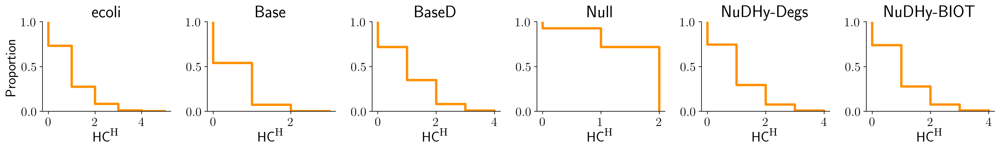

In [138]:
fig, ax = plt.subplots(1, len(order)+1, figsize=(18, 3))

sns.ecdfplot(data=hcr_o, x=root, ax=ax[0], 
             color=colors[2], complementary=True, linewidth=3)
ax[0].set_title(dataset_names[root])
ax[0].set_xlabel(r'$\mathsf{HC}^\textsc{h}$')

for i, s in enumerate(order):
    data = sh_o[sh_o['Sampler']==s].copy()
    
#     sns.boxplot(data=data[data['Sampler']==s], y='PageRank', ax=ax[i], 
#                 color=colors[0], width=.6)
    sns.ecdfplot(data=data, x='Hyper-coreness', ax=ax[i+1], 
                color=colors[2], complementary=True, linewidth=3)
    ax[i+1].set_ylabel('')
    ax[i+1].set_xlabel(r'$\mathsf{HC}^\textsc{h}$')
    ax[i+1].set_title(sampler_names.get(s, s))
plt.tight_layout()
plt.savefig(f'{root}_out-hyper-coreness_distrib.pdf', bbox_inches='tight')
plt.show()

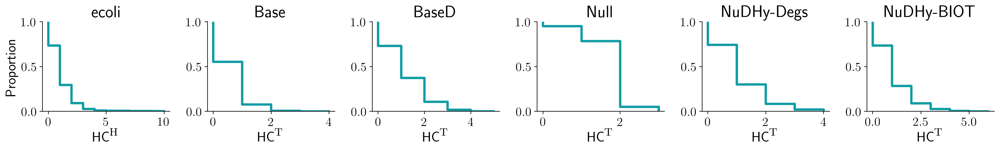

In [139]:
fig, ax = plt.subplots(1, len(order)+1, figsize=(18, 3))


sns.ecdfplot(data=hcr_i, x=root, ax=ax[0], 
             color=colors[3], complementary=True, linewidth=3)
ax[0].set_title(dataset_names[root])
ax[0].set_xlabel(r'$\mathsf{HC}^\textsc{h}$')

for i, s in enumerate(order):
    data = sh_i[sh_i['Sampler']==s].copy()
    
#     sns.boxplot(data=data[data['Sampler']==s], y='PageRank', ax=ax[i], 
#                 color=colors[0], width=.6)
    sns.ecdfplot(data=data, x='Hyper-coreness', ax=ax[i+1], 
                color=colors[3], complementary=True, linewidth=3)
    ax[i+1].set_ylabel('')
    ax[i+1].set_xlabel(r'$\mathsf{HC}^\textsc{t}$')
    ax[i+1].set_title(sampler_names.get(s, s))
plt.tight_layout()
plt.savefig(f'{root}_in-hyper-coreness_distrib.pdf', bbox_inches='tight')
plt.show()

## Vertex-wise Hyper-coreness Scatterplots
head- and tail-hyper-coreness of each vertex: average in the samples vs observed value

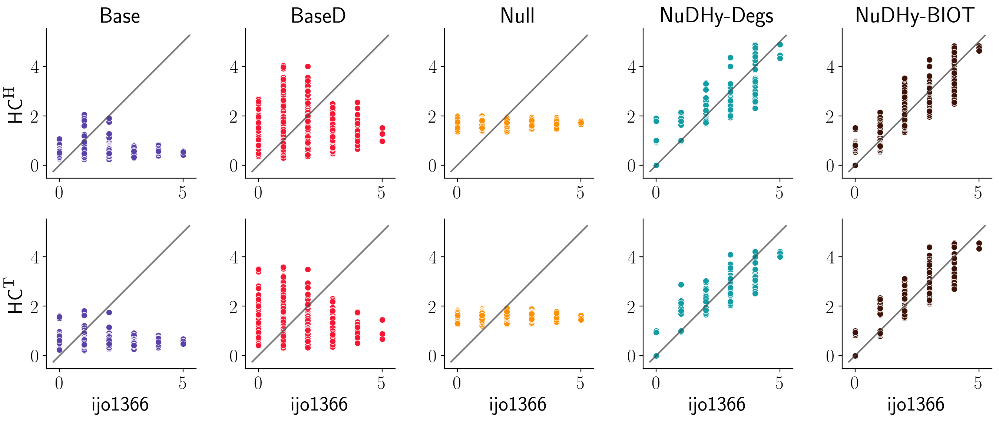

In [27]:
num_sampls = len(sh_o['Sampler'].unique())

fig, ax = plt.subplots(2, num_sampls, figsize=(14,6))

row_counter = 0

for idx, sampler in enumerate(samplers_ord):
    
    # o-hypercoreness
    tmp_res_df = sh_o[sh_o['Sampler']==sampler].copy()
    if tmp_res_df.empty: 
        continue
    tmp_res_df = tmp_res_df.groupby(by='VertexId')[['Hyper-coreness']].mean()
    tmp_res_df = hcr_o.join(tmp_res_df)
    tmp_res_df.rename(columns={'Hyper-coreness': f'{sampler}'}, inplace=True)
    data1 = tmp_res_df

    sns.scatterplot(data=data1, x=root, y=sampler, 
                    color=colors[idx], ax=ax[0][row_counter])
    if row_counter == 0:
        ax[0][row_counter].set_ylabel(r'$\mathsf{HC}^\textsc{h}$')
    else:
        ax[0][row_counter].set_ylabel('')
    ax[0][row_counter].set_xlabel('')
    ax[0][row_counter].set_title(sampler_names.get(sampler, sampler))
    lims = [
        np.min([ax[0][row_counter].get_xlim(), ax[0][row_counter].get_ylim()]),  # min of both axes
        np.max([ax[0][row_counter].get_xlim(), ax[0][row_counter].get_ylim()]),  # max of both axes
    ]
    # now plot both limits against eachother
    ax[0][row_counter].plot(lims, lims, alpha=0.75, zorder=1, color='#474747')
    ax[0][row_counter].set_aspect('equal')

    # i-hypercoreness
    tmp_res_df = sh_i[sh_i['Sampler']==sampler].copy()
    tmp_res_df = tmp_res_df.groupby(by='VertexId')[['Hyper-coreness']].mean()
    tmp_res_df = hcr_i.join(tmp_res_df)
    tmp_res_df.rename(columns={'Hyper-coreness': f'{sampler}'}, inplace=True)
    data2 = tmp_res_df

    sns.scatterplot(data=data2, x=f'{root}', y=f'{sampler}', 
                    color=colors[idx], ax=ax[1][row_counter])
    if row_counter == 0:
        ax[1][row_counter].set_ylabel(r'$\mathsf{HC}^\textsc{t}$')
    else:
        ax[1][row_counter].set_ylabel('')
    ax[1][row_counter].set_xlabel(dataset_names[root])
    lims = [
        np.min([ax[1][row_counter].get_xlim(), ax[1][row_counter].get_ylim()]),  # min of both axes
        np.max([ax[1][row_counter].get_xlim(), ax[1][row_counter].get_ylim()]),  # max of both axes
    ]
    # now plot both limits against eachother
    ax[1][row_counter].plot(lims, lims, alpha=0.75, zorder=1, color='#474747')
    ax[1][row_counter].set_aspect('equal')
    
    row_counter += 1
plt.tight_layout()
plt.savefig(f'{root}_scatter_hypercoreness.pdf', bbox_inches='tight')
plt.show()

### Scatterplot with a sample of points
Code to use to improve the rendering for large datasets

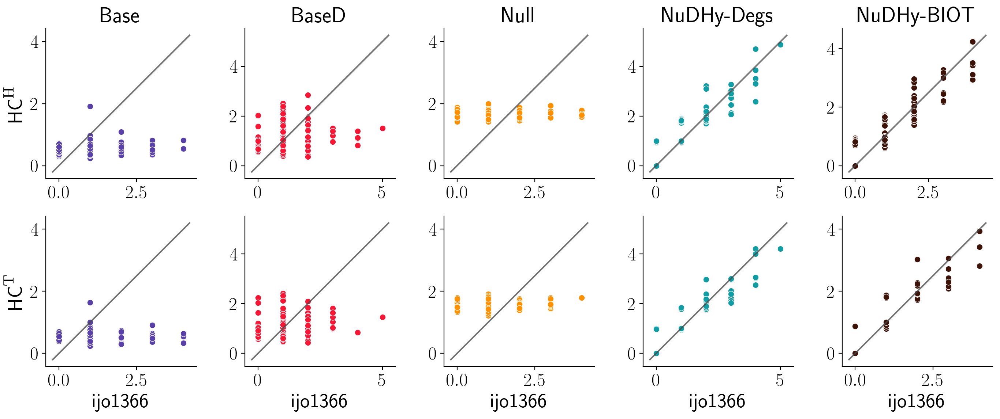

In [28]:
num_sampls = len(sh_o['Sampler'].unique())

fig, ax = plt.subplots(2, num_sampls, figsize=(14,6))

row_counter = 0

for idx, sampler in enumerate(samplers_ord):
    
    # o-hypercoreness
    tmp_res_df = sh_o[sh_o['Sampler']==sampler].copy()
    if tmp_res_df.empty: 
        continue
    tmp_res_df = tmp_res_df.groupby(by='VertexId')[['Hyper-coreness']].mean()
    tmp_res_df = hcr_o.join(tmp_res_df)
    tmp_res_df.rename(columns={'Hyper-coreness': f'{sampler}'}, inplace=True)
    
    sample_size = int(len(tmp_res_df) * 0.1)
    vids = random.sample(range(max(tmp_res_df.index)+1), sample_size)
    data1 = tmp_res_df.loc[vids]

    sns.scatterplot(data=data1, x=root, y=sampler, 
                    color=colors[idx], ax=ax[0][row_counter])
    if row_counter == 0:
        ax[0][row_counter].set_ylabel(r'$\mathsf{HC}^\textsc{h}$')
    else:
        ax[0][row_counter].set_ylabel('')
    ax[0][row_counter].set_xlabel('')
    ax[0][row_counter].set_title(sampler_names.get(sampler, sampler))
    lims = [
        np.min([ax[0][row_counter].get_xlim(), ax[0][row_counter].get_ylim()]),  # min of both axes
        np.max([ax[0][row_counter].get_xlim(), ax[0][row_counter].get_ylim()]),  # max of both axes
    ]
    # now plot both limits against eachother
    ax[0][row_counter].plot(lims, lims, alpha=0.75, zorder=1, color='#474747')
    ax[0][row_counter].set_aspect('equal')

    # i-hypercoreness
    tmp_res_df = sh_i[sh_i['Sampler']==sampler].copy()
    tmp_res_df = tmp_res_df.groupby(by='VertexId')[['Hyper-coreness']].mean()
    tmp_res_df = hcr_i.join(tmp_res_df)
    tmp_res_df.rename(columns={'Hyper-coreness': f'{sampler}'}, inplace=True)
    
    data2 = tmp_res_df.loc[vids]

    sns.scatterplot(data=data2, x=f'{root}', y=f'{sampler}', 
                    color=colors[idx], ax=ax[1][row_counter])
    if row_counter == 0:
        ax[1][row_counter].set_ylabel(r'$\mathsf{HC}^\textsc{t}$')
    else:
        ax[1][row_counter].set_ylabel('')
    ax[1][row_counter].set_xlabel(dataset_names[root])
    lims = [
        np.min([ax[1][row_counter].get_xlim(), ax[1][row_counter].get_ylim()]),  # min of both axes
        np.max([ax[1][row_counter].get_xlim(), ax[1][row_counter].get_ylim()]),  # max of both axes
    ]
    # now plot both limits against eachother
    ax[1][row_counter].plot(lims, lims, alpha=0.75, zorder=1, color='#474747')
    ax[1][row_counter].set_aspect('equal')
    
    row_counter += 1
plt.tight_layout()
plt.savefig(f'{root}_scatter_hypercoreness_10.pdf', bbox_inches='tight')
plt.show()

## Distribution of Studentized Scores
For each observed head- and tail-hyper-coreness value, we plot the distribution of the "studentized" values obtained using the values measured in the samples, to see if we make more "mistakes" for some observed values rather than for others.

In [30]:
def compute_std_scores(df, df2, sampler, r):
    hcs = df[df['Sampler'] == sampler].copy()
    hcs = hcs.groupby(by='VertexId').agg({'Hyper-coreness': ['mean', 'std']})
    hcs.columns = ['Mean', 'STD']
    hcs = df2.join(hcs)
    hcs.fillna(0, inplace=True)
    hcs['STD'].replace([0], 1, inplace=True)
    hcs['Std. Hyper-coreness'] = (hcs[f'{root}'] - hcs['Mean']) / hcs['STD']
    hcs['Algorithm'] = sampler
    return hcs[[r, 'Std. Hyper-coreness', 'Algorithm']]

In [31]:
row_i = pd.DataFrame()
row_o = pd.DataFrame()

for sampler in sh_i['Sampler'].unique():
    hcs_i = compute_std_scores(sh_i, hcr_i, sampler, root)
    if row_i.empty:
        row_i = hcs_i.reset_index()
    else:
        row_i = pd.concat([row_i, hcs_i.reset_index()], ignore_index=True)
    hcs_o = compute_std_scores(sh_o, hcr_o, sampler, root)
    if row_o.empty:
        row_o = hcs_o.reset_index()
    else:
        row_o = pd.concat([row_o, hcs_o.reset_index()], ignore_index=True)

In [32]:
row_o.fillna(0, inplace=True)
row_i.fillna(0, inplace=True)

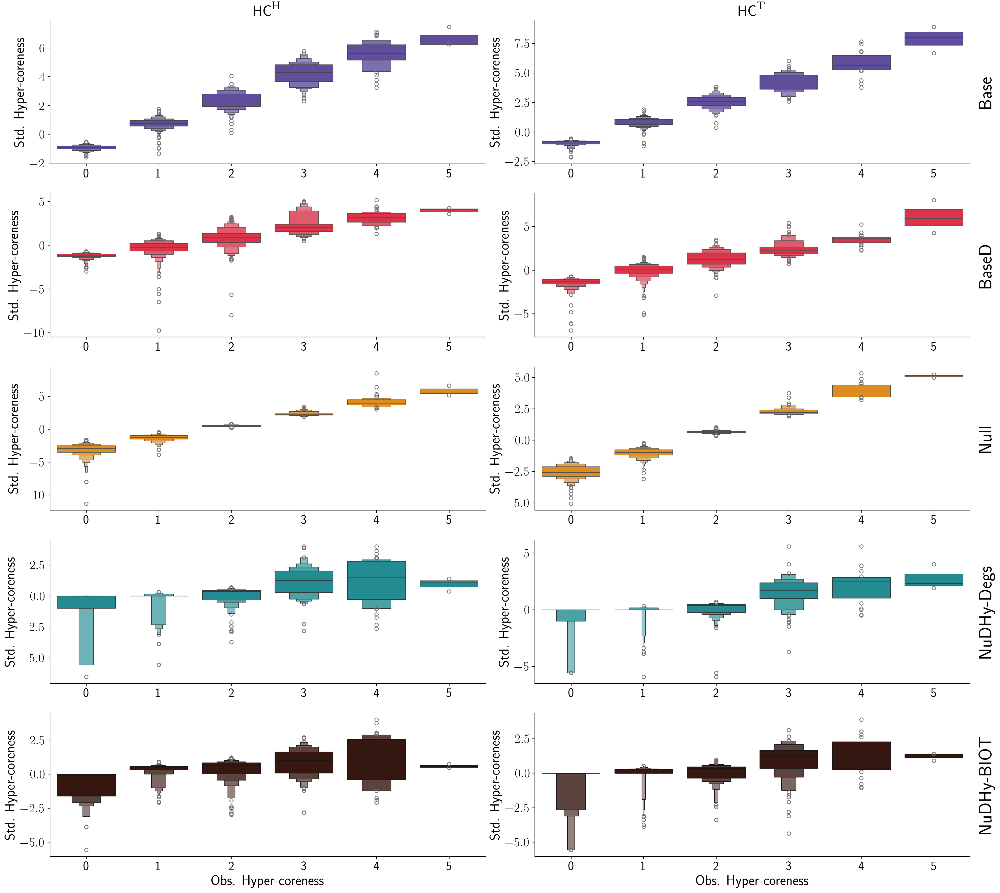

In [33]:
num_sampls = len(row_o['Algorithm'].unique())

fig, ax = plt.subplots(num_sampls, 2, figsize=(20,18))

row_counter = 0

for idx, sampler in enumerate(samplers_ord):
    
    data = row_o[row_o['Algorithm']==sampler].copy()
    
    if data.empty: continue
        
    data.replace([np.inf, -np.inf], 0, inplace=True)

    sns.boxenplot(data=data, x=root, y='Std. Hyper-coreness', color=colors[idx], ax=ax[row_counter][0])
    if idx < num_sampls - 1:
        ax[row_counter][0].set_xlabel('')
    else:
        ax[row_counter][0].set_xlabel('Obs. Hyper-coreness')
    if idx == 0:
        ax[row_counter][0].set_title(r'$\mathsf{HC}^\textsc{h}$')

    data = row_i[row_i['Algorithm']==sampler].copy()
    data.replace([np.inf, -np.inf], 0, inplace=True)

    sns.boxenplot(data=data, x=root, y='Std. Hyper-coreness', color=colors[idx], ax=ax[row_counter][1])
    if idx < num_sampls - 1:
        ax[row_counter][1].set_xlabel('')
    else:
        ax[row_counter][1].set_xlabel('Obs. Hyper-coreness')
    if idx == 0:
        ax[row_counter][1].set_title(r'$\mathsf{HC}^\textsc{t}$')
    ax[row_counter][1].text(1.02, 0.5, sampler_names.get(sampler, sampler), 
                            transform=ax[row_counter][1].transAxes,
                            fontsize=26, rotation=90, va='center')
    row_counter += 1
plt.tight_layout()
plt.savefig(f'{root}_std_hypercoreness.pdf', bbox_inches='tight')
plt.show()

## Similarity between Hyper-coreness Vectors

In [34]:
def sorting_f(x, hc, col):
    if x not in hc.index:
        return 0
    return - hc.loc[x, col]

Node ranking in observed hypergraph

In [35]:
rank_i = np.zeros(max(hcr_i.index))
rank_o = np.zeros(max(hcr_o.index))

ranking_reals = sorted([x for x in np.arange(len(rank_i))], key = lambda x: sorting_f(x, hcr_i, root))
for idx in range(len(ranking_reals)):
    rank_i[ranking_reals[idx]] = idx
ranking_reals = sorted([x for x in np.arange(len(rank_o))], key = lambda x: sorting_f(x, hcr_o, root))
for idx in range(len(ranking_reals)):
    rank_o[ranking_reals[idx]] = idx

Node ranking in samples

In [36]:
rows = []
for sampler in sh_o['Sampler'].unique():
    for sample in sh_o['Sample'].unique():
        tmp_res_df = sh_o[(sh_o['Sampler']==sampler) &
                          (sh_o['Sample']==sample)].copy()
        tmp_res_df = tmp_res_df.set_index(['VertexId'])
        avg_res_df = tmp_res_df.join(hcr_o, how='right')
        avg_res_df.fillna(0, inplace=True)

        rank_nodes = np.zeros(len(rank_o))
        ranking = sorted([x for x in np.arange(len(rank_nodes))], 
                         key = lambda x: sorting_f(x, avg_res_df, 'Hyper-coreness'))
        for idx in range(len(ranking)):
            rank_nodes[ranking[idx]] = idx

        pred_scores = avg_res_df.sort_index()['Hyper-coreness'].values
        pred_s = np.array([pred_scores])    
        true_scores = avg_res_df.sort_index()[root].values
        true_s = np.array([true_scores])

        pear = round(pearsonr(rank_i, rank_nodes)[0], 3)
        kt = round(kendalltau(rank_i, rank_nodes)[0], 3)
        nDCG = round(ndcg_score(true_s, pred_s, ignore_ties=True), 3)
        

        rows.append([sampler, sample, r'$\mathsf{HC}^h$', pear, kt, nDCG])

In [37]:
o_comparison = pd.DataFrame(rows, columns=['Sampler', 'Sample', 'Score', 'Pearson', 'Kendall-Tau', 'nDCG'])

In [38]:
rows = []
for sampler in sh_i['Sampler'].unique():
    for sample in sh_o['Sample'].unique():
        tmp_res_df = sh_i[(sh_i['Sampler']==sampler) &
                          (sh_i['Sample']==sample)].copy()
        tmp_res_df = tmp_res_df.set_index(['VertexId'])
        avg_res_df = tmp_res_df.join(hcr_i, how='right')
        avg_res_df.fillna(0, inplace=True)

        rank_nodes = np.zeros(len(rank_i))
        ranking = sorted([x for x in np.arange(len(rank_nodes))], 
                         key = lambda x: sorting_f(x, avg_res_df, 'Hyper-coreness'))
        for idx in range(len(ranking)):
            rank_nodes[ranking[idx]] = idx

        pred_scores = avg_res_df.sort_index()['Hyper-coreness'].values
        pred_s = np.array([pred_scores])    
        true_scores = avg_res_df.sort_index()[root].values
        true_s = np.array([true_scores])

        pear = round(pearsonr(rank_i, rank_nodes)[0], 3)
        kt = round(kendalltau(rank_i, rank_nodes)[0], 3)
        nDCG = round(ndcg_score(true_s, pred_s, ignore_ties=True), 3)

        rows.append([sampler, sample, r'$\mathsf{HC}^t$', pear, kt, nDCG])

In [39]:
i_comparison = pd.DataFrame(rows, columns=['Sampler', 'Sample', 'Score', 'Pearson', 'Kendall-Tau', 'nDCG'])

## Output Table

In [40]:
output = pd.concat([o_comparison, i_comparison])
# output = output.pivot(index='Score', columns='Sampler', values='nDCG')
output = output.groupby(by=['Sampler', 'Score'])[['nDCG']].agg(['mean', 'std']).transpose()

In [41]:
print(output.to_latex())

\begin{tabular}{llrrrrrrrrrr}
\toprule
 & Sampler & \multicolumn{2}{r}{Base} & \multicolumn{2}{r}{BaseD} & \multicolumn{2}{r}{NuDHy_A} & \multicolumn{2}{r}{NuDHy_C} & \multicolumn{2}{r}{Null} \\
 & Score & $\mathsf{HC}^h$ & $\mathsf{HC}^t$ & $\mathsf{HC}^h$ & $\mathsf{HC}^t$ & $\mathsf{HC}^h$ & $\mathsf{HC}^t$ & $\mathsf{HC}^h$ & $\mathsf{HC}^t$ & $\mathsf{HC}^h$ & $\mathsf{HC}^t$ \\
\midrule
\multirow[t]{2}{*}{nDCG} & mean & 0.837091 & 0.872545 & 0.851333 & 0.868758 & 0.976152 & 0.979788 & 0.975879 & 0.982212 & 0.833485 & 0.872030 \\
 & std & 0.005021 & 0.004402 & 0.002432 & 0.003172 & 0.002138 & 0.002534 & 0.002870 & 0.002247 & 0.005013 & 0.002910 \\
\cline{1-12}
\bottomrule
\end{tabular}



# Structural Entropy

In [246]:
met_path = results_path + 'entropy'

In [247]:
root = 'uspto19762016'

In [248]:
# Sampler, Size, Probability
h_prob_df = pd.read_csv(f'{met_path}/{root}.tsv__numSamples_{num_samples}__seed_{seed}__heads.tsv', sep='\t')
for samp in samplers[:-2]:
    try:
        tmp1 = pd.read_csv(f'{met_path}/{root}.tsv__numSamples_{num_samples}__algorithm_{samp}__heads.tsv', sep='\t')
        h_prob_df = pd.concat([h_prob_df, tmp1])
    except:
        continue
h_prob_df = h_prob_df[h_prob_df['Size']!='Size']
h_prob_df = h_prob_df.astype(dtype={'Size':np.int32, 'Probability':np.float64})
t_prob_df = pd.read_csv(f'{met_path}/{root}.tsv__numSamples_{num_samples}__seed_{seed}__tails.tsv', sep='\t')
for samp in samplers[:-2]:
    try:
        tmp2 = pd.read_csv(f'{met_path}/{root}.tsv__numSamples_{num_samples}__algorithm_{samp}__tails.tsv', sep='\t')
        t_prob_df = pd.concat([t_prob_df, tmp2])
    except:
        continue
t_prob_df = t_prob_df[t_prob_df['Size']!='Size']
t_prob_df = t_prob_df.astype(dtype={'Size':np.int32, 'Probability':np.float64})

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/2402523797.py:2: DtypeWarning: Columns (1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  h_prob_df = pd.read_csv(f'{met_path}/{root}.tsv__numSamples_{num_samples}__seed_{seed}__heads.tsv', sep='\t')


In [249]:
h_prob_df['Sampler'] = h_prob_df['Sampler'].apply(lambda x: rename_null_sampler(x))
t_prob_df['Sampler'] = t_prob_df['Sampler'].apply(lambda x: rename_null_sampler(x))

In [250]:
first_col = 0
if 'Base' not in h_prob_df['Sampler'].unique():
    first_col = 1
num_samp = len(h_prob_df['Sampler'].unique())

## Comparison

In [251]:
ov_sizes = set(h_prob_df['Size'])
ov_sizes.update(t_prob_df['Size'])
ov_sizes = sorted(list(ov_sizes))

### Side-by-side distributions

In [132]:
order = [x for x in samplers_ord if x in h_prob_df['Sampler'].unique()]

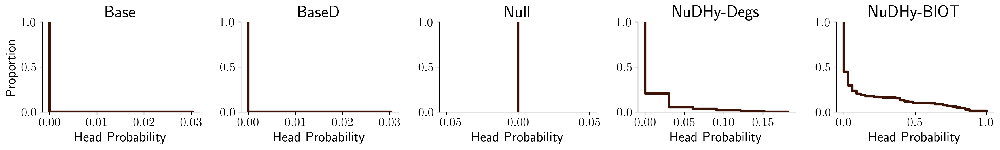

In [136]:
fig, ax = plt.subplots(1, len(order), figsize=(18, 3))

data = h_prob_df[h_prob_df['Size']==3]

for i, s in enumerate(order):

    data2 = data[data['Sampler']==s].copy()
    
    sns.ecdfplot(data=data2, x='Probability', ax=ax[i], 
                color=colors[4], complementary=True, linewidth=3)
    if i > 0:
        ax[i].set_ylabel('')
    ax[i].set_xlabel('Head Probability')
    ax[i].set_title(sampler_names.get(s, s))
plt.tight_layout()
plt.savefig(f'{root}_head_cum_prob_distrib.pdf', bbox_inches='tight')
plt.show()

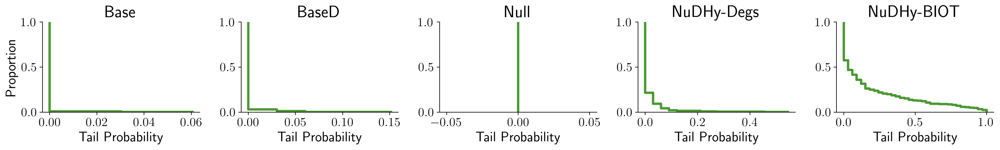

In [137]:
fig, ax = plt.subplots(1, len(order), figsize=(18, 3))

data = t_prob_df[t_prob_df['Size']==3]

for i, s in enumerate(order):

    data2 = data[data['Sampler']==s].copy()
    
    sns.ecdfplot(data=data2, x='Probability', ax=ax[i], 
                color=colors[5], complementary=True, linewidth=3)
    if i > 0:
        ax[i].set_ylabel('')
    ax[i].set_xlabel('Tail Probability')
    ax[i].set_title(sampler_names.get(s, s))
plt.tight_layout()
plt.savefig(f'{root}_tail_cum_prob_distrib.pdf', bbox_inches='tight')
plt.show()

### Probability of Seeing an Observed Head Group in the Samples

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/3194077705.py:5: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  p = sns.ecdfplot(data=first, x='Probability', hue='Sampler', ax=ax[0],
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/3194077705.py:20: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  p = sns.ecdfplot(data=second, x='Probability', hue='Sampler', ax=ax[1],
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


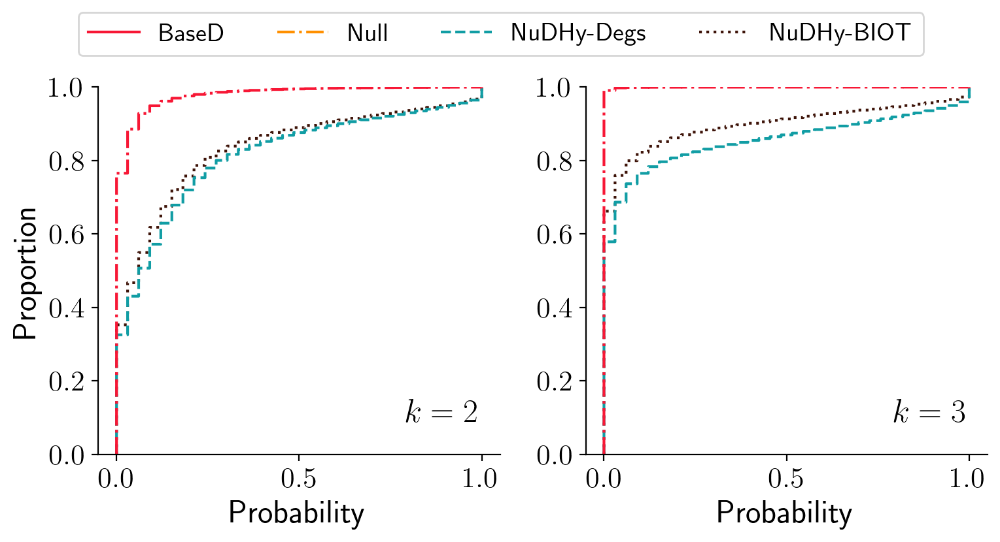

In [258]:
if not h_prob_df.empty:
    fig, ax = plt.subplots(1,2, figsize=(8,4))

    first = h_prob_df[h_prob_df['Size']==2]
    p = sns.ecdfplot(data=first, x='Probability', hue='Sampler', ax=ax[0],
                     hue_order=samplers_ord[first_col:], palette=palette[first_col:])
    handles = p.legend_.legend_handles[::-1]
    for line, ls, handle in zip(p.lines, lss, handles):
        line.set_linestyle(ls)
        handle.set_ls(ls)
    ax[0].text(.95, .15, r'$k=2$', fontsize=18, ha='right', va='top', transform=ax[0].transAxes)
    legend = ax[0].get_legend()
    handles = legend.legend_handles
    labels = [sampler_names.get(text.get_text(), text.get_text()) for text in legend.get_texts()]
    ax[0].legend().remove()
    fig.legend(handles=handles, labels=labels, loc='upper center', fontsize=14,
               bbox_to_anchor=(0.5, 1.08), ncol=5-first_col)

    second = h_prob_df[h_prob_df['Size']==3]
    p = sns.ecdfplot(data=second, x='Probability', hue='Sampler', ax=ax[1],
                     hue_order=samplers_ord[first_col:], palette=palette[first_col:])
    ax[1].set_ylabel('')
    ax[1].legend().remove()
    for line, ls in zip(p.lines, lss):
        line.set_linestyle(ls)
        handle.set_ls(ls)
    ax[1].text(.95, .15, r'$k=3$', fontsize=18, ha='right',
               va='top', transform=ax[1].transAxes)

    plt.tight_layout()
    plt.savefig(f'{root}_head_cum_prob.pdf', bbox_inches='tight')
    plt.show()

### Probability of Seeing an Observed Tail Group in the Samples

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/2945910343.py:9: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  p = sns.ecdfplot(data=first, x='Probability', hue='Sampler', ax=ax[0],
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/2945910343.py:19: UserWarning: 
The palette list has fewer values (2) than needed (4) and will cycle, which may produce an uninterpretable plot.
  p = sns.ecdfplot(data=second, x='Probability', hue='Sampler', ax=ax[1],
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


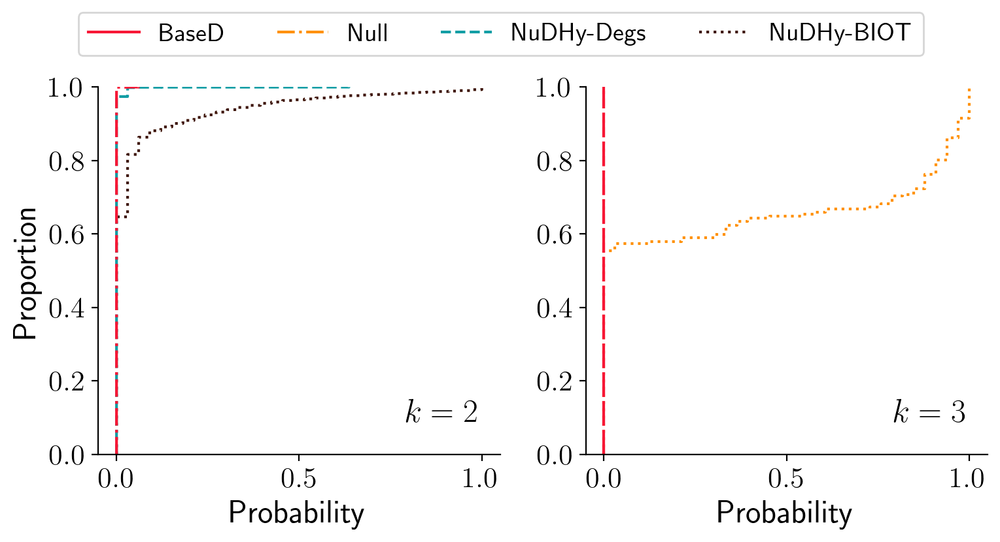

In [259]:
if not h_prob_df.empty:
    first_col = 0
    if 'Base' not in t_prob_df['Sampler'].unique():
        first_col = 1

    fig, ax = plt.subplots(1,2, figsize=(8,4))

    first = t_prob_df[t_prob_df['Size']==2]
    p = sns.ecdfplot(data=first, x='Probability', hue='Sampler', ax=ax[0],
                     hue_order=samplers_ord[first_col:], palette=palette[first_col:])
    handles = p.legend_.legend_handles[::-1]
    for line, ls, handle in zip(p.lines, lss, handles):
        line.set_linestyle(ls)
        handle.set_ls(ls)
    ax[0].text(.95, .15, r'$k=2$', fontsize=18, ha='right',
               va='top', transform=ax[0].transAxes)

    second = t_prob_df[t_prob_df['Size']==3]
    p = sns.ecdfplot(data=second, x='Probability', hue='Sampler', ax=ax[1],
                     hue_order=samplers_ord[first_col:], palette=palette[first_col:num_samp])
    ax[1].set_ylabel('')
    ax[1].legend().remove()
    for line, ls in zip(p.lines, lss):
        line.set_linestyle(ls)
        handle.set_ls(ls)
    ax[1].text(.95, .15, r'$k=3$', fontsize=18, ha='right',
               va='top', transform=ax[1].transAxes)
    
    legend = ax[0].get_legend()
    handles = legend.legend_handles
    labels = [sampler_names.get(text.get_text(), text.get_text()) for text in legend.get_texts()]
    ax[0].legend().remove()
    fig.legend(handles=handles, labels=labels, loc='upper center',
               fontsize=14, bbox_to_anchor=(0.5, 1.08), ncol=5)
    plt.tight_layout()
    plt.savefig(f'{root}_tail_cum_prob.pdf', bbox_inches='tight')
    plt.show()

## Entropy of Probabilities

In [254]:
def get_entropy(ps):
    qs = np.ones(len(ps)) - ps
    return entropy(ps) + entropy(qs)

In [255]:
def get_entropy_bits(ps):
    eps = []
    for p in ps:
        if p > 0 and p < 1:
            eps.append(-p*math.log2(p) - (1 - p)*math.log2(1 - p))
        else:
            eps.append(0)
    return eps

In [256]:
alpha = 0.1
ss = - alpha * math.log2(alpha) - (1 - alpha) * math.log2(1 - alpha)

### Head & Tail Probabilities

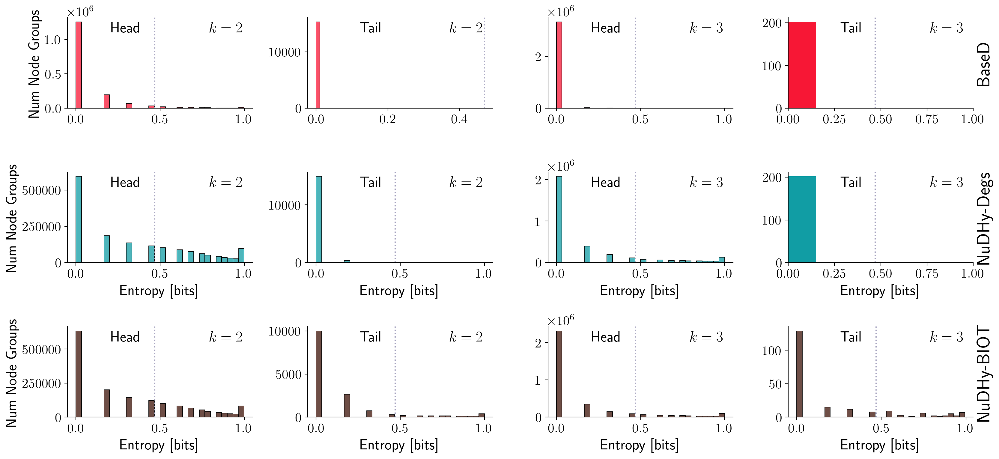

In [257]:
num_sampls = len(h_prob_df['Sampler'].unique())
row_index = 0

fig, ax = plt.subplots(num_sampls, 4, figsize=(17,2*num_sampls+num_sampls-1))

for idx, sampler in enumerate(samplers_ord):
    
    datas = h_prob_df[(h_prob_df['Sampler']==sampler)]
    if datas.empty:
        continue

    for idx2, s in enumerate([2, 3]):

        r = row_index
        c = idx2 * 2

        # HEAD
        data = datas[datas['Size']==s]
        ps_h = data['Probability'].values
        ep_h = get_entropy_bits(ps_h)
        ent_h = 0
        if sum(ep_h) > 0:
            ent_h = round(entropy(ps_h), 3)
            sns.histplot(ep_h, color=colors[idx], ax=ax[r][c], bins=30)
        else:
            ax[r][c].bar([0], [len(ep_h)], width=0.3, color=colors[idx])
            ax[r][c].set_xlim(0, 1)
        if r > 0:
            ax[r][c].set_xlabel('Entropy [bits]', fontsize=18)
        if c == 0:
            ax[r][c].set_ylabel('Num Node Groups', fontsize=18)
        else:
            ax[r][c].set_ylabel('')
        ax[r][c].axvline(ss, color=colors[-1], linestyle='dotted')
        ax[r][c].text(.4, .95, 'Head', fontsize=18,
                      ha='right', va='top', transform=ax[r][c].transAxes)
        ax[r][c].text(.95, .95, r'$k={}$'.format(s), fontsize=18,
                      ha='right', va='top', transform=ax[r][c].transAxes)
#         ax[r][c].text(.95, .95, f'{ent_h}', fontsize=18,
#                       ha='right', va='top', transform=ax[r][c].transAxes, color='#6C0E23')
        # TAIL
        data = t_prob_df[(t_prob_df['Sampler']==sampler) & 
                         (t_prob_df['Size']==s)]
        ps_t = data['Probability'].values
        ep_t = get_entropy_bits(ps_t)
        ent_t = 0
        if sum(ep_t) > 0:
            ent_t = round(entropy(ps_t), 3)
            sns.histplot(ep_t, color=colors[idx], ax=ax[r][c+1], bins=30)
        else:
            ax[r][c+1].bar([0], [len(ep_t)], width=0.3, color=colors[idx])
            ax[r][c+1].set_xlim(0, 1)
        if r > 0:
            ax[r][c+1].set_xlabel('Entropy [bits]', fontsize=18)
        ax[r][c+1].set_ylabel('')
        ax[r][c+1].axvline(ss, color=colors[-1], linestyle='dotted')
        ax[r][c+1].text(.4, .95, 'Tail', fontsize=18, 
                      ha='right', va='top', transform=ax[r][c+1].transAxes)
        ax[r][c+1].text(.95, .95, r'$k={}$'.format(s), fontsize=18,
                      ha='right', va='top', transform=ax[r][c+1].transAxes)
#         ax[r][c+1].text(.95, .95, f'{ent_t}', fontsize=18, 
#                       ha='right', va='top', transform=ax[r][c+1].transAxes, color='#6C0E23')
        if c == 2:
            ax[r][c+1].text(1.02, 0.5, sampler_names.get(sampler, sampler), transform=ax[r][c+1].transAxes, 
                            fontsize=22, rotation=90, va='center')
        
    row_index += 1

plt.tight_layout()
plt.savefig(f'{root}_entropy.pdf', bbox_inches='tight')
plt.show()

### Tail Probabilities

In [ ]:
num_sampls = len(t_prob_df['Sampler'].unique())
row_index = 0

fig, ax = plt.subplots(num_sampls, 2, figsize=(12,2*num_sampls+num_sampls-1))

for idx, sampler in enumerate(samplers_ord):
    
    datas = t_prob_df[(t_prob_df['Sampler']==sampler)]
    if datas.empty:
        continue

    for idx2, s in enumerate([2, 3]):

        r = row_index
        c = idx2

        # TAIL
        data = datas[datas['Size']==s]
        ps_t = data['Probability'].values
        ep_t = get_entropy_bits(ps_t)
        ent_t = 0
        if sum(ep_t) > 0:
            ent_t = round(entropy(ps_t), 3)
            sns.histplot(ep_t, color=colors[idx], ax=ax[r][c], bins=40)
        else:
            ax[r][c].bar([0], [len(ep_t)], width=0.3, color=colors[idx])
            ax[r][c].set_xlim(0, 1)
        if r > 0:
            ax[r][c].set_xlabel('Entropy [bits]', fontsize=18)
        if c > 0:
            ax[r][c].set_ylabel('')
        ax[r][c].axvline(ss, color=colors[-1], linestyle='dotted')
        ax[r][c].text(.4, .95, 'Tail', fontsize=18, 
                      ha='right', va='top', transform=ax[r][c].transAxes)
        ax[r][c].text(.95, .95, r'$k={}$'.format(s), fontsize=18,
                      ha='right', va='top', transform=ax[r][c].transAxes)
        if c == 1:
            ax[r][c].text(1.02, 0.5, sampler_names.get(sampler, sampler), transform=ax[r][c].transAxes, 
                          fontsize=22, rotation=90, va='center')
        
    row_index += 1

plt.tight_layout()
plt.savefig(f'{root}_entropy.pdf', bbox_inches='tight')
plt.show()

# Multi-order Laplacian

In [10]:
met_path = results_path + 'laplacian/'

In [11]:
root = 'uspto19762016'

In [12]:
sym = 'False'

Observed Dataset

In [13]:
# 'Order', 'Eig'
lapl_obs = pd.read_csv(f'{met_path}multi_laplacian_{root}__sym_{sym}.tsv', sep='\t')
lapl_obs['Id'] = np.array([(np.arange(eig_num) + 1)] * int(len(lapl_obs) / 6)).flatten()
# 'Sampler', 'Sample Id', 'Order', 'Eig'
lapl = []
for sam in ['NuDHy', 'Base', 'BaseD', 'UnpretentiousNullModel']:
    try:
        tmp = pd.read_csv(f'{met_path}multi_laplacian_{root}__sym_{sym}_{sam}_samples.tsv', sep='\t')
        lapl.append(tmp)
    except:
        continue
lapl = pd.concat(lapl)
lapl['Sampler'] = lapl['Sampler'].apply(lambda x: rename_null_sampler(x))

In [14]:
# COMPUTE METRICS
lines = []
for ss in lapl['Sampler'].unique():
    for ssid in range(33):
        for order in lapl['Order'].unique():
            inp = lapl[(lapl['Sampler']==ss) &
                       (lapl['Sample Id']==ssid) &
                       (lapl['Order']==order)]
            if inp.empty:
                continue
            eigs = np.array(sorted(inp['Eig'].values))
            eigs_obs = np.array(sorted(lapl_obs[lapl_obs['Order']==order]['Eig'].values))
            if len(eigs_obs) == 0 or len(eigs) == 0:
                print(ss, order)
                continue
            sp_dist = normf(eigs_obs - eigs, ord=2) / len(eigs)
            cos = cosine(eigs_obs, eigs)
            pear = pearsonr(eigs_obs, eigs)[0]
            
            lines.append([ss, ssid, order, sp_dist, cos, pear])
metrics = pd.DataFrame(lines, columns=['Sampler', 'Sampler Id',
                                       'Order',
                                       'Spectral Distance',
                                       'Pearson Correlation',
                                       'Cosine Distance'])

In [15]:
num_sampls = len(metrics['Sampler'].unique())
first_col = 0
if 'Base' not in metrics['Sampler'].unique():
    first_col = 1

## Cosine Distance

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_59572/3677818530.py:8: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance',


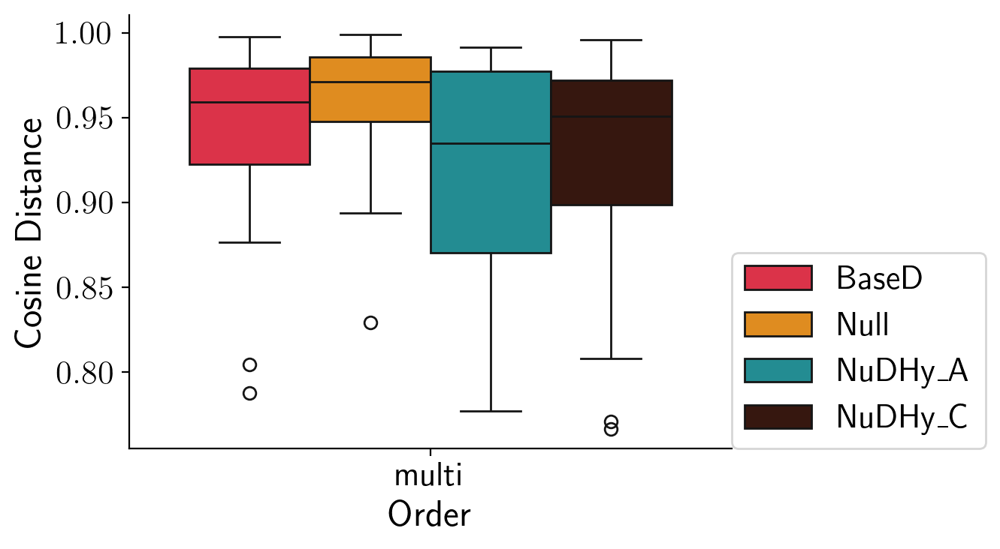

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_59572/3677818530.py:8: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance',


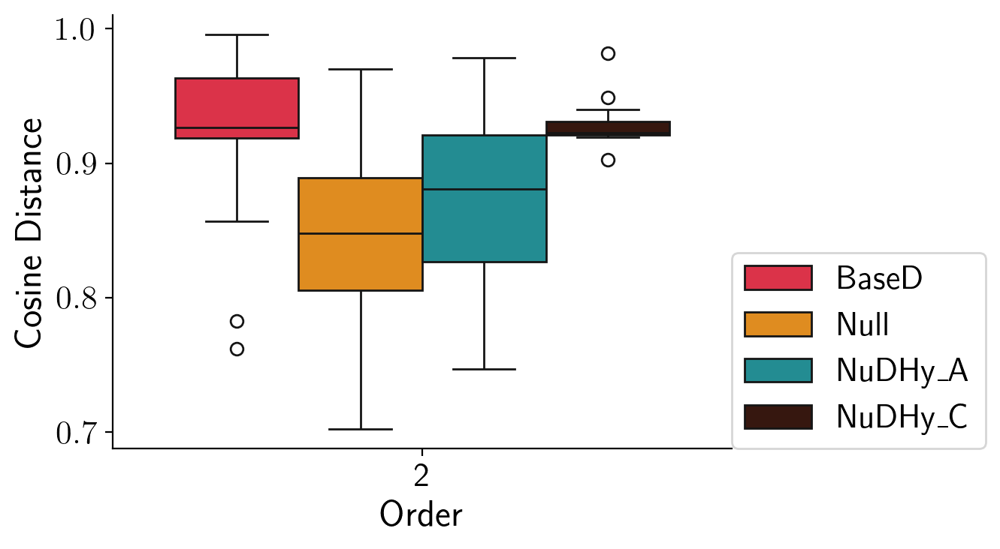

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_59572/3677818530.py:8: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance',


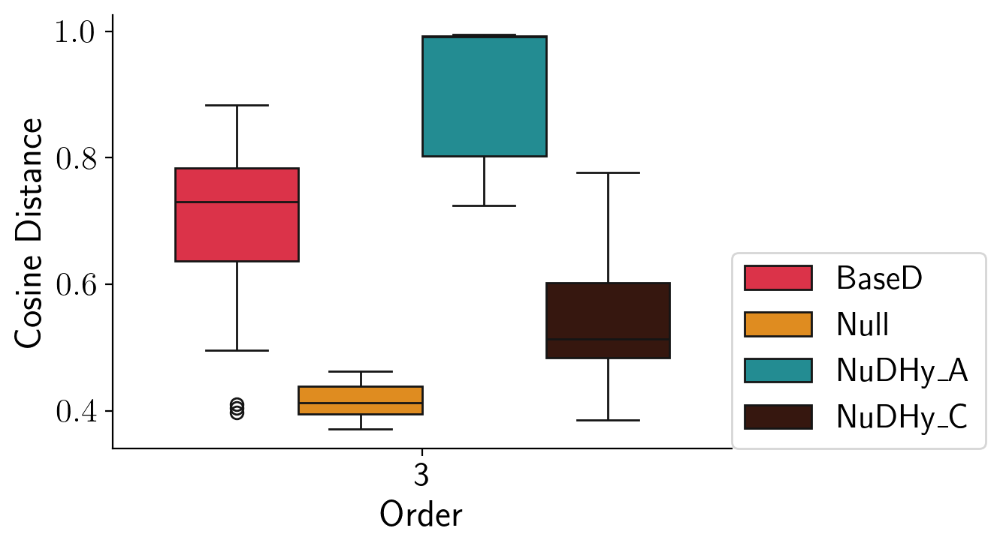

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_59572/3677818530.py:8: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance',


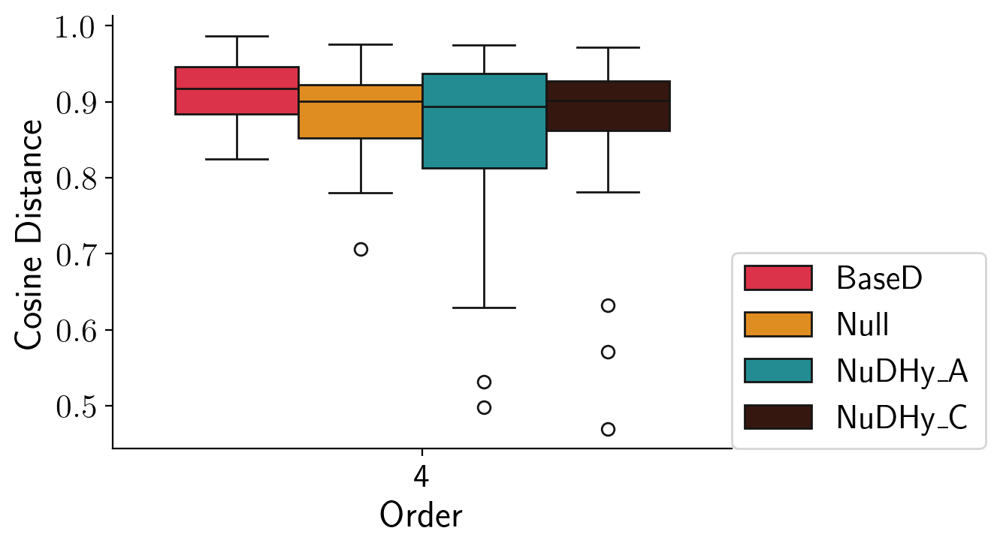

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_59572/3677818530.py:8: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance',


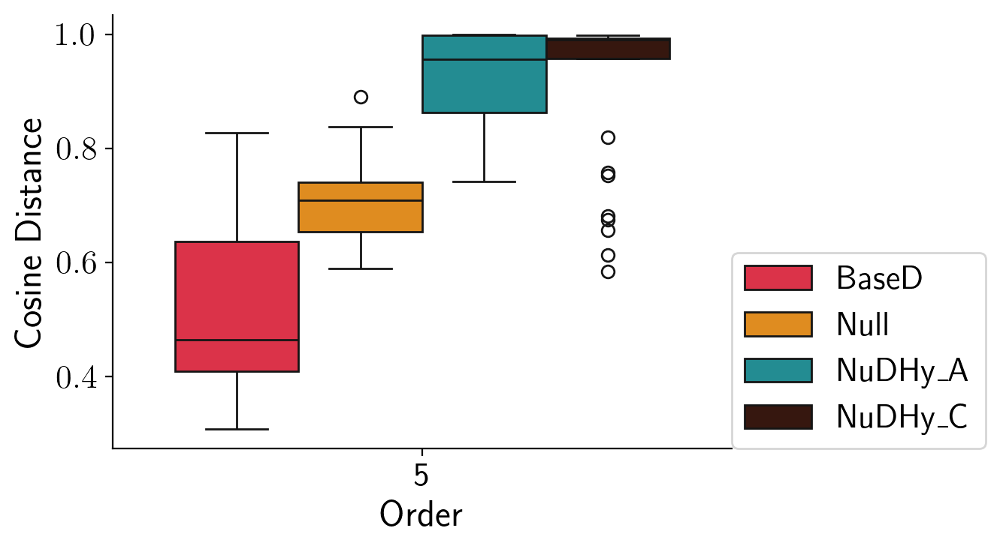

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_59572/3677818530.py:8: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance',


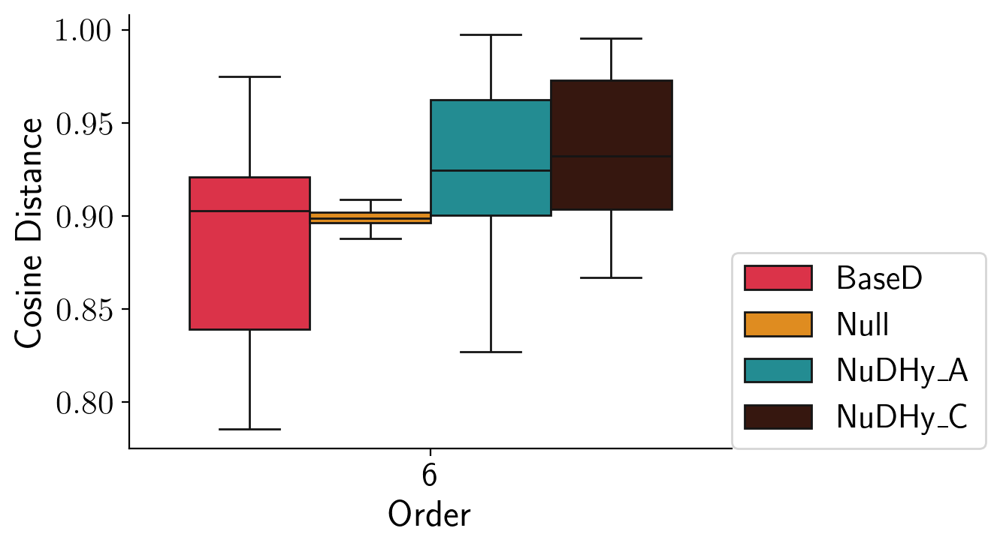

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_59572/3677818530.py:8: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance',


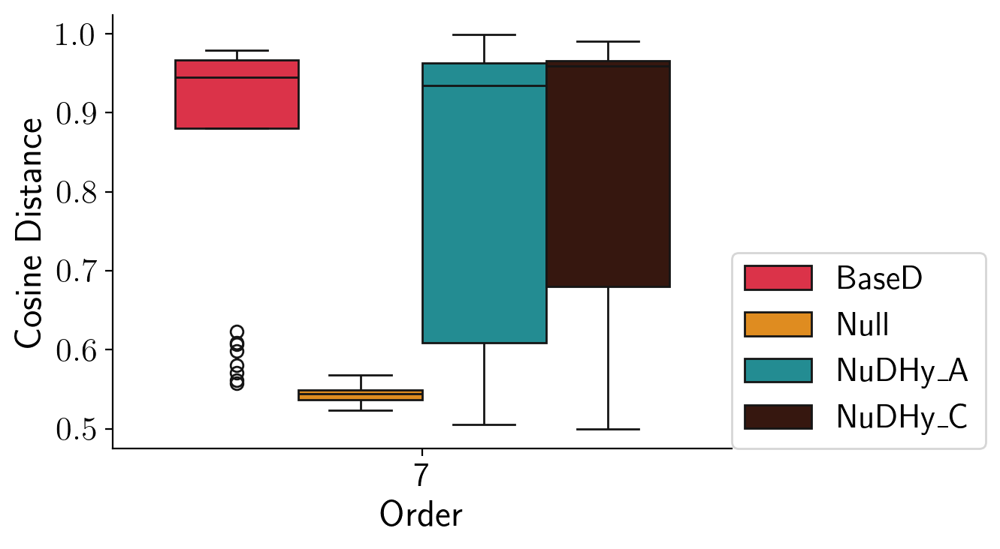

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_59572/3677818530.py:8: UserWarning: The palette list has more values (6) than needed (4), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance',


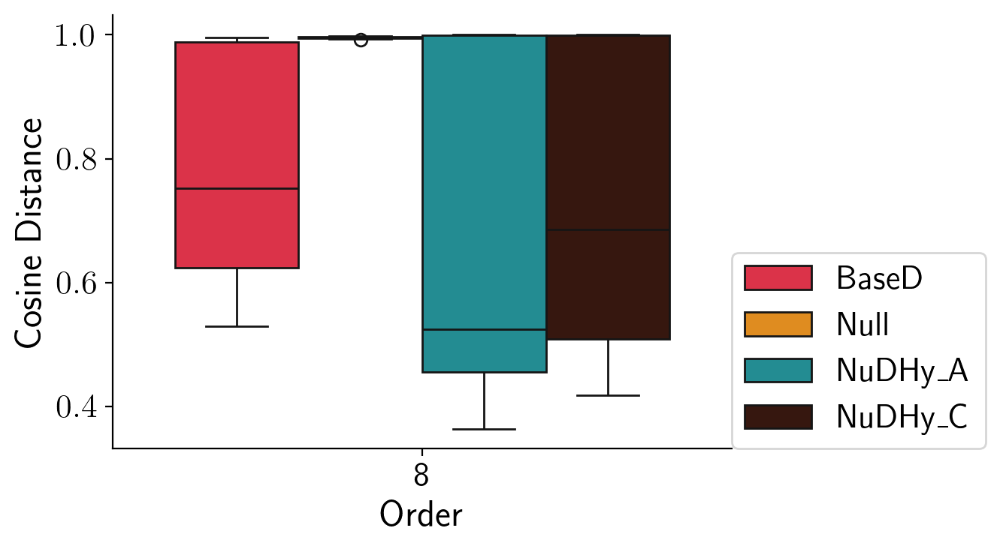

In [16]:
for order in metrics['Order'].unique():
    data = metrics[metrics['Order']==order].dropna()
    data = data[data['Cosine Distance']!='None']
    data = data.astype(dtype={'Cosine Distance': np.float64})
    if data.empty: continue
    
    fig, ax = plt.subplots(figsize=(7,4))
    sns.boxplot(data=data, x='Order', y='Cosine Distance', 
                hue='Sampler', hue_order=samplers_ord[first_col:], palette=palette[first_col:])
    ax.legend(loc=(1,0))
    plt.tight_layout()
#     plt.savefig(f'{root}_cosine_distance_ord_{order}.pdf')
    plt.show()

### Grid-plot

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/55056225.py:14: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance', hue='Sampler',
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/55056225.py:20: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles = ax[r][c].legend().legendHandles
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/55056225.py:14: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Cosine Distance', hue='Sampler',
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/55056225.py:20: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later

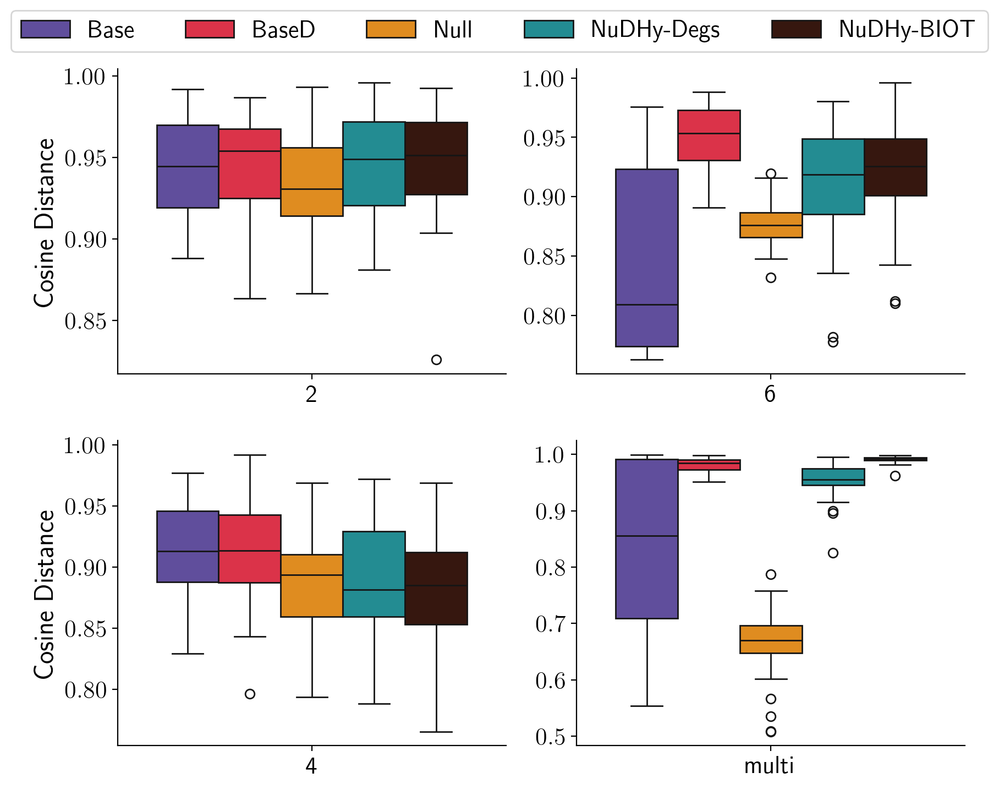

In [438]:
fig, ax = plt.subplots(2, 2, figsize=(9,7))

orders = ['2', '4', '6', 'multi']
# orders = ['6', '8', '12', 'multi']

for idx, order in enumerate(orders):
    
    r = idx % 2 
    c = idx // 2

    data = metrics[metrics['Order']==order]
    data = data[data['Cosine Distance']!='None']
    data = data.astype(dtype={'Cosine Distance': np.float64})
    sns.boxplot(data=data, x='Order', y='Cosine Distance', hue='Sampler',
                hue_order=samplers_ord[first_col:], palette=palette[first_col:], ax=ax[r][c])
    ax[r][c].set_xlabel('')
    if c > 0:
        ax[r][c].set_ylabel('')
    
    handles = ax[r][c].legend().legendHandles
    labels = [sampler_names.get(text.get_text(), text.get_text()) for text in ax[r][c].legend().get_texts()]
    ax[r][c].legend().remove()

fig.legend(handles=handles[:5], labels=labels[:5], fontsize=16, 
           loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=5-first_col)

plt.tight_layout()
plt.savefig(f'{root}_cosine_distance.pdf', bbox_inches='tight')
plt.show()

## Pearson Correlation

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/1068860735.py:9: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation',


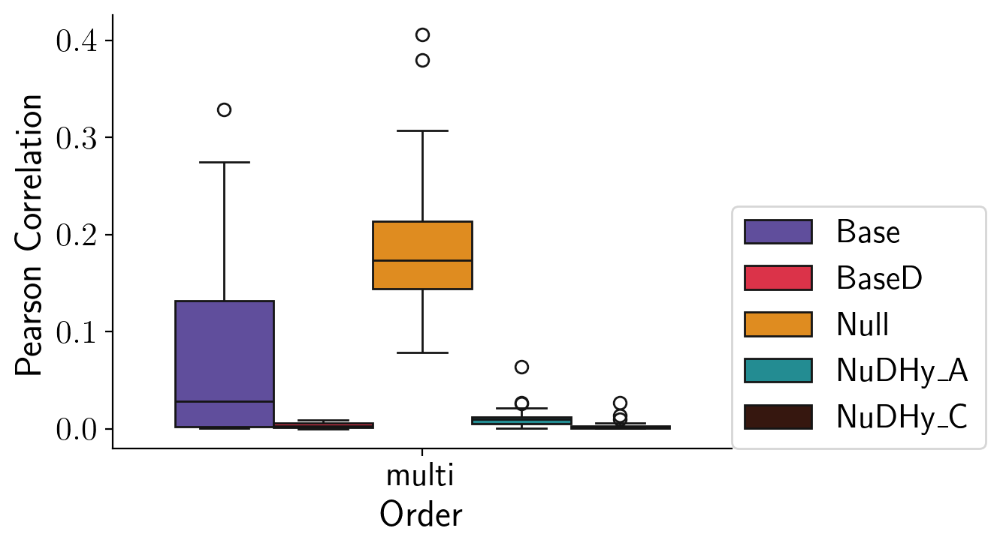

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/1068860735.py:9: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation',


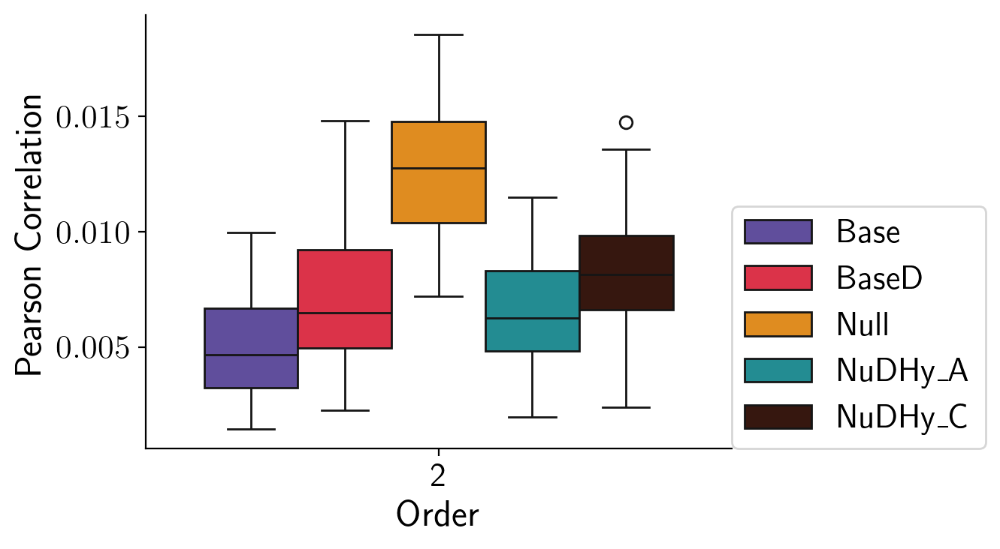

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/1068860735.py:9: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation',


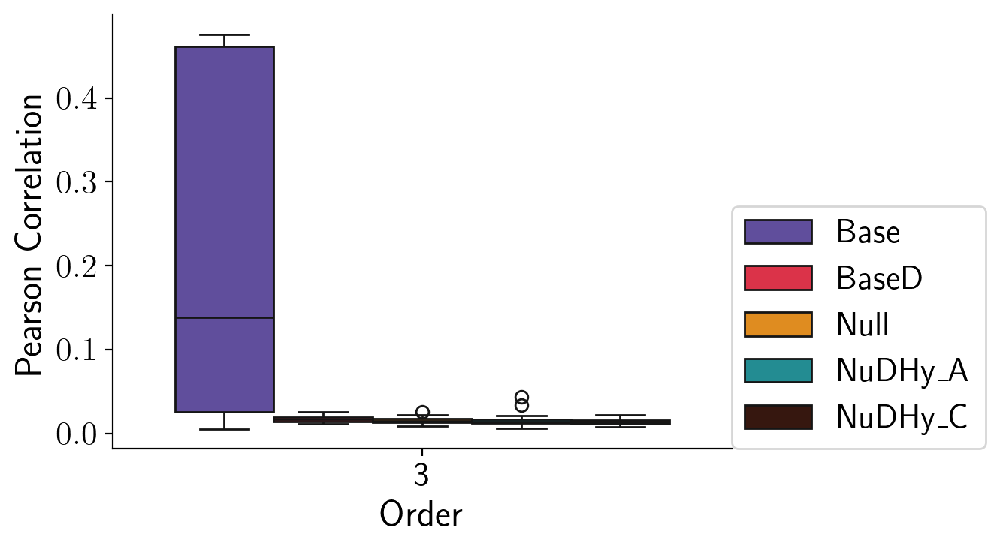

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/1068860735.py:9: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation',


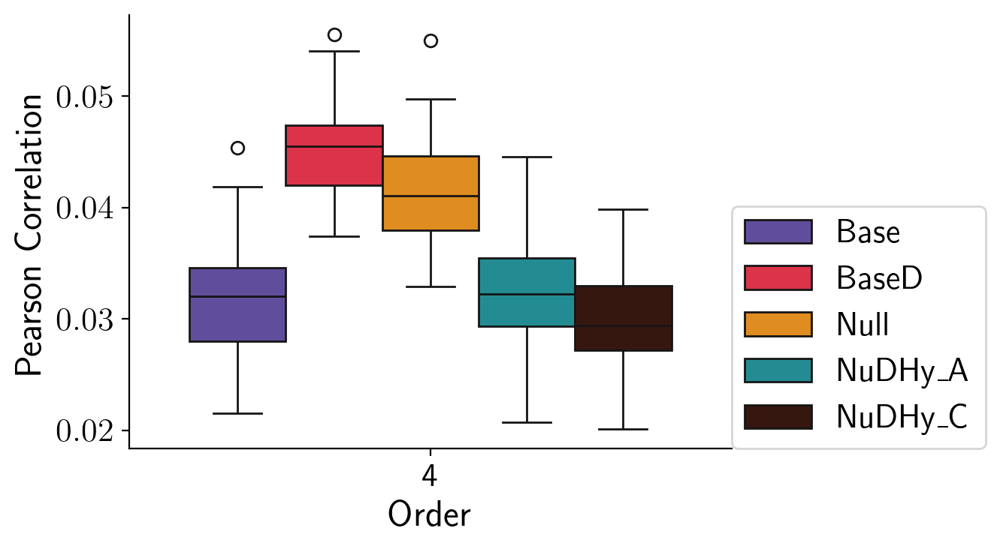

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/1068860735.py:9: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation',


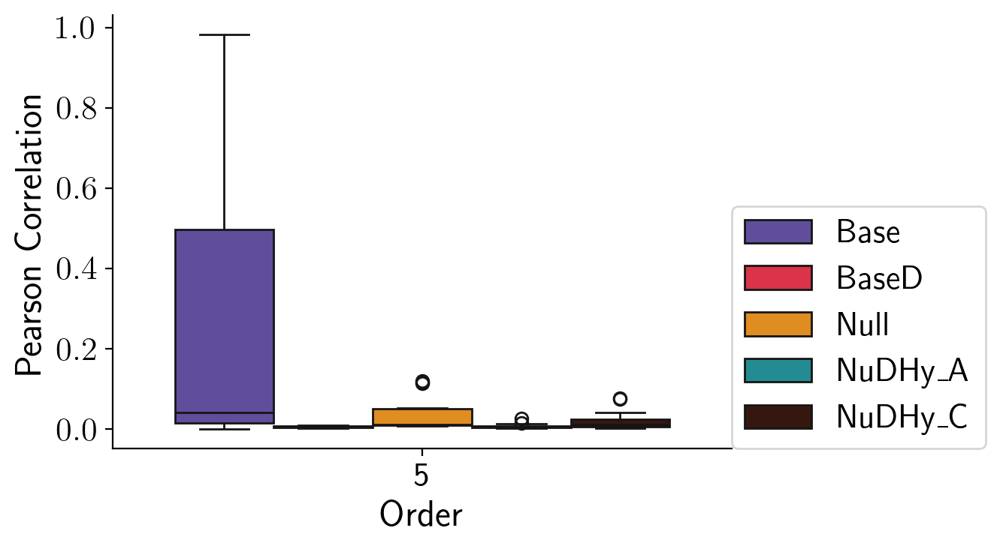

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/1068860735.py:9: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation',


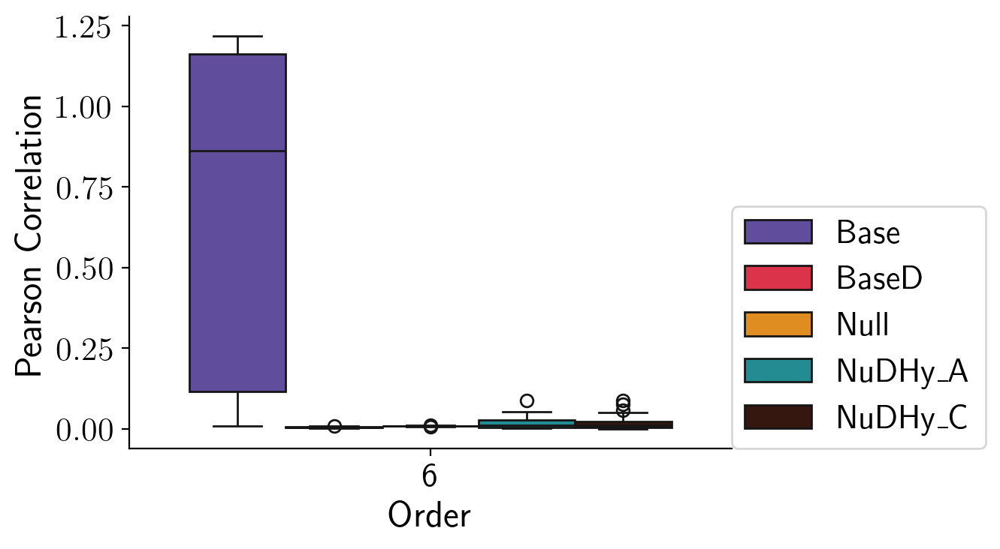

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/1068860735.py:9: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation',


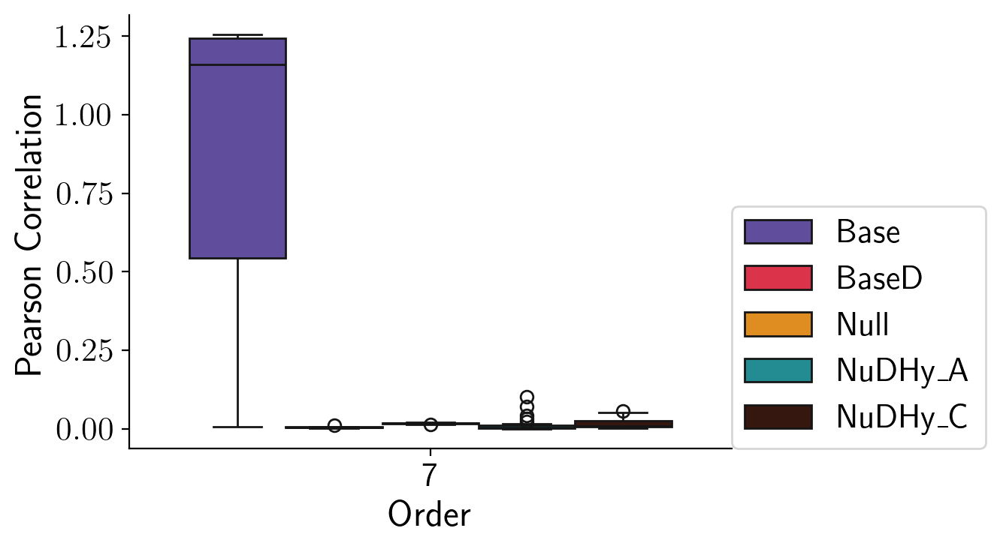

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/1068860735.py:9: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation',


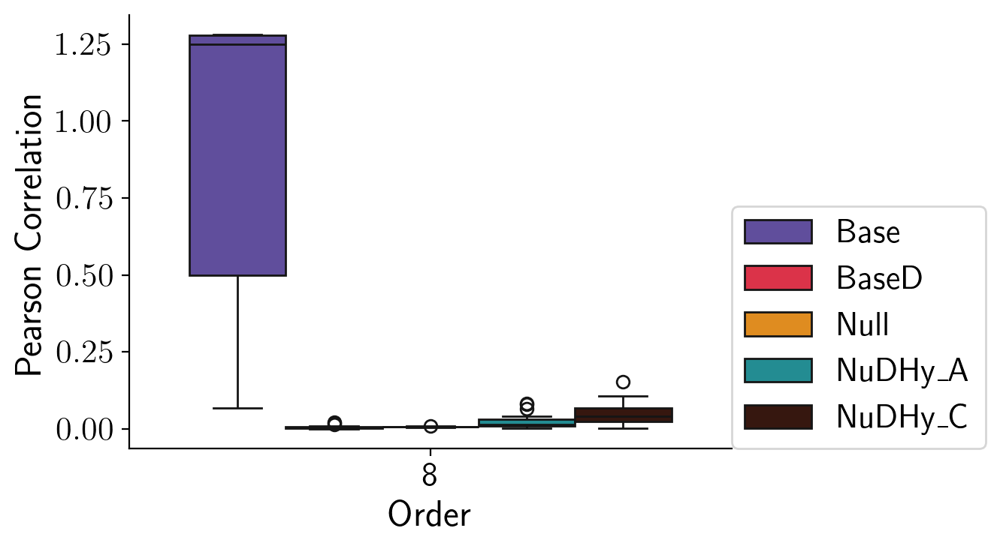

In [439]:
for order in metrics['Order'].unique():
    
    data = metrics[metrics['Order']==order]
    data = data[data['Pearson Correlation']!='None']
    data = data.astype(dtype={'Pearson Correlation': np.float64})
    if data.empty: continue
    
    fig, ax = plt.subplots(figsize=(7,4))
    sns.boxplot(data=data, x='Order', y='Pearson Correlation', 
                hue_order=samplers_ord[first_col:],
                hue='Sampler', palette=palette[first_col:])
    ax.legend(loc=(1,0))
    plt.tight_layout()
#     plt.savefig(f'{root}_pearson_ord_{order}.pdf')
    plt.show()

### Grid-plot

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/2704029119.py:15: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation', hue_order=samplers_ord[first_col:],
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/2704029119.py:21: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles = ax[r][c].legend().legendHandles
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/2704029119.py:15: UserWarning: The palette list has more values (7) than needed (5), which may not be intended.
  sns.boxplot(data=data, x='Order', y='Pearson Correlation', hue_order=samplers_ord[first_col:],
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/2704029119.py:21: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in M

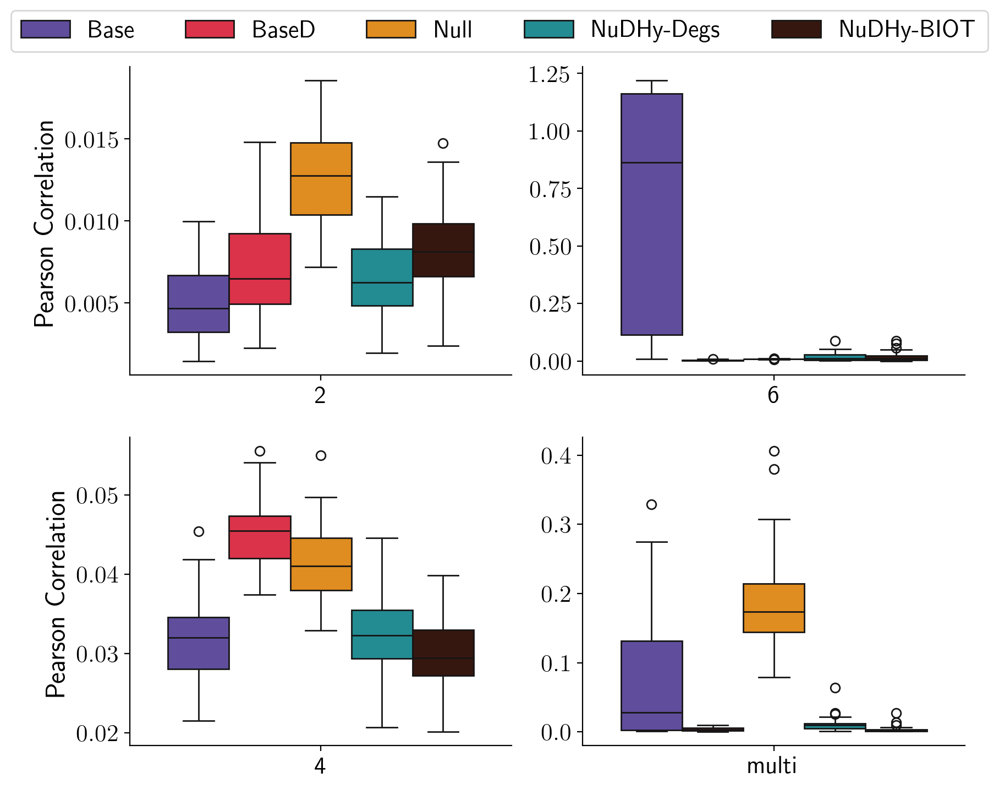

In [440]:
fig, ax = plt.subplots(2, 2, figsize=(9,7))

orders = ['2', '4', '6', 'multi']
# orders = ['2', '3', '4', 'multi']
# orders = ['6', '8', '12', 'multi']

for idx, order in enumerate(orders):
    
    r = idx % 2 
    c = idx // 2

    data = metrics[metrics['Order']==order]
    data = data[data['Pearson Correlation']!='None']
    data = data.astype(dtype={'Pearson Correlation': np.float64})
    sns.boxplot(data=data, x='Order', y='Pearson Correlation', hue_order=samplers_ord[first_col:],
                hue='Sampler', palette=palette[first_col:], ax=ax[r][c])
    ax[r][c].set_xlabel('')
    if c > 0:
        ax[r][c].set_ylabel('')
    
    handles = ax[r][c].legend().legendHandles
    labels = [sampler_names.get(text.get_text(), text.get_text()) for text in ax[r][c].legend().get_texts()]
    ax[r][c].legend().remove()

# tmp_h = [handles[0], handles[1], handles[3]]
# tmp_l = [labels[0], labels[1], labels[3]]
# fig.legend(handles=tmp_h, labels=tmp_l, loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=3)
fig.legend(handles=handles[:5], labels=labels[:5], loc='upper center', 
           fontsize=16, bbox_to_anchor=(0.5, 1.05), ncol=5-first_col)

plt.tight_layout()
plt.savefig(f'{root}_pearson_distance.pdf', bbox_inches='tight')
plt.show()

## Side-by-side distributions

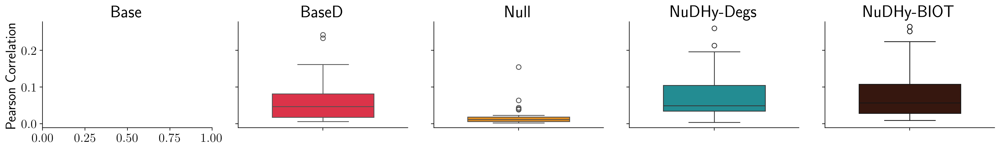

In [17]:
fig, ax = plt.subplots(1, len(samplers_ord), figsize=(18, 3), sharey=True)

data = metrics[metrics['Order']=='multi']
data = data[data['Pearson Correlation']!='None']
data = data.astype(dtype={'Pearson Correlation': np.float64})

for i, s in enumerate(samplers_ord):
    sns.boxplot(data=data[data['Sampler']==s], y='Pearson Correlation', ax=ax[i], 
                color=colors[i], width=.6)
    if i > 0:
        ax[i].set_ylabel('')
    else:
        ax[i].set_ylabel('Pearson Correlation')
    ax[i].set_title(sampler_names.get(s, s))
plt.tight_layout()
plt.savefig(f'{root}_pearson_distrib.pdf', bbox_inches='tight')
plt.show()

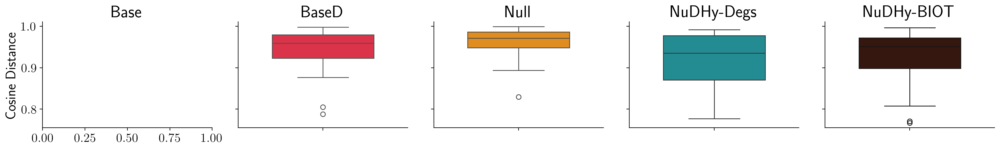

In [18]:
fig, ax = plt.subplots(1, len(samplers_ord), figsize=(18, 3), sharey=True)

data = metrics[metrics['Order']=='multi']
data = data[data['Cosine Distance']!='None']
data = data.astype(dtype={'Cosine Distance': np.float64})

for i, s in enumerate(samplers_ord):
    sns.boxplot(data=data[data['Sampler']==s], y='Cosine Distance', ax=ax[i], 
                color=colors[i], width=.6)
    if i > 0:
        ax[i].set_ylabel('')
    else:
        ax[i].set_ylabel('Cosine Distance')
    ax[i].set_title(sampler_names.get(s, s))
plt.tight_layout()
plt.savefig(f'{root}_cosine_distrib.pdf', bbox_inches='tight')
plt.show()

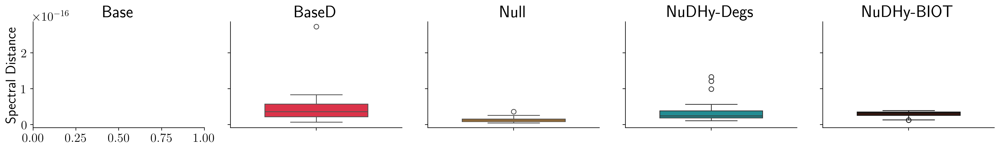

In [19]:
fig, ax = plt.subplots(1, len(samplers_ord), figsize=(18, 3), sharey=True)

data = metrics[metrics['Order']=='multi']
data = data[data['Spectral Distance']!='None']
data = data.astype(dtype={'Spectral Distance': np.float64})

for i, s in enumerate(samplers_ord):
    sns.boxplot(data=data[data['Sampler']==s], y='Spectral Distance', ax=ax[i], 
                color=colors[i], width=.6)
    if i > 0:
        ax[i].set_ylabel('')
    else:
        ax[i].set_ylabel('Spectral Distance')
    ax[i].set_title(sampler_names.get(s, s))
plt.tight_layout()
plt.savefig(f'{root}_spectral_distrib.pdf', bbox_inches='tight')
plt.show()

In [20]:
data.groupby('Sampler')['Spectral Distance'].mean()

Sampler
BaseD      4.640442e-17
NuDHy_A    3.465239e-17
NuDHy_C    2.950791e-17
Null       1.368307e-17
Name: Spectral Distance, dtype: float64

# Node Centrality

In [341]:
met_path = results_path + 'centrality/'

In [427]:
root = 'enron'

## HITS

In [428]:
def remap_to_hyperedge(x):
    if x == 'None':
        return 'Hyperedge'
    else:
        return x

In [429]:
hits_obs = pd.read_csv(f'{met_path}hits_{root}.tsv', sep='\t') 
hits = pd.read_csv(f'{met_path}hits_{root}_samples.tsv', sep='\t') 
for sam in samplers[:-2]:
    try:
        tmp = pd.read_csv(f'{met_path}hits_{root}_samples_{sam}.tsv', sep='\t')
        tmp['Type'] = tmp['Type'].apply(lambda x: remap_to_hyperedge(x))
        tmp['Sampler'] = rename_null_sampler(sam)
        hits = pd.concat([hits, tmp])
    except:
        continue

FileNotFoundError: [Errno 2] No such file or directory: '/Users/giulia/Desktop/nudhy/results/laplacian/hits_enron.tsv'

In [430]:
hits = hits[(hits['Type']=='Vertex')]
hits['Hub Score'] = hits['Hub Score'].apply(lambda x: round(x, 6))
hits['Authority Score'] = hits['Authority Score'].apply(lambda x: round(x, 6))
hits_obs = hits_obs[hits_obs['Type']=='Vertex']
hits_obs['Hub Score'] = hits_obs['Hub Score'].apply(lambda x: round(x, 6))
hits_obs['Authority Score'] = hits_obs['Authority Score'].apply(lambda x: round(x, 6))

NameError: name 'hits' is not defined

In [431]:
first_col = 0
if 'Base' not in hits['Sampler'].unique():
    first_col = 1

NameError: name 'hits' is not defined

### Score Distributions

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_57869/1686083938.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x='Sampler', y=f'{score} Score', palette=palette[first_col:],
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_57869/1686083938.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[idx2].set_xticklabels([sampler_names.get(s.get_text(), s.get_text()) for s in ax[idx2].get_xticklabels()])
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_57869/1686083938.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be

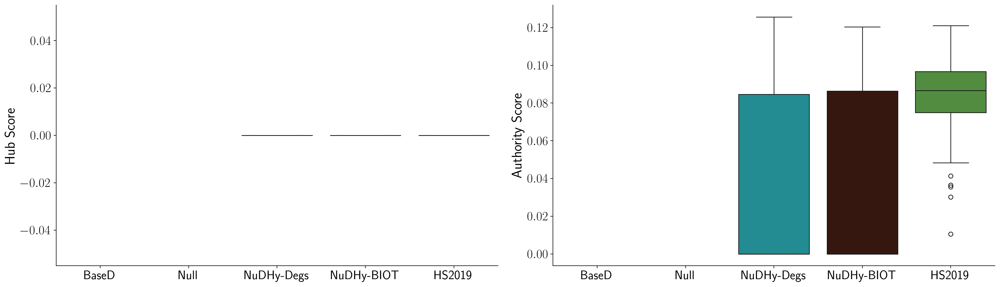

In [68]:
fig, ax = plt.subplots(1, 2, figsize=(20,6))

data = hits_obs[['Hub Score', 'Authority Score', 'Type']].copy()
data['Sampler'] = dataset_names[root]
data = pd.concat([hits[['Sampler', 'Hub Score', 'Authority Score', 'Type']], data])
order = [x for x in samplers_ord]
order.append(dataset_names[root])

for idx2, score in enumerate(['Hub', 'Authority']):

    sns.boxplot(data=data, x='Sampler', y=f'{score} Score', palette=palette[first_col:],
                order=order[first_col:], ax=ax[idx2])
    ax[idx2].set_xlabel('')
    ax[idx2].set_xticklabels([sampler_names.get(s.get_text(), s.get_text()) for s in ax[idx2].get_xticklabels()])
    ax[idx2].legend().remove()

plt.tight_layout()
plt.savefig(f'{root}_hits.pdf')
plt.show()

### Comparison Rankings

In [83]:
rows = []
for score in ['Hub Score', 'Authority Score']:
    for sampler in hits['Sampler'].unique():
        for sample in hits['Sample Id'].unique():
            data = hits[(hits['Sampler']==sampler) &
                        (hits['Sample Id']==sample) &
                        (hits['Type']=='Vertex')]
            if data.empty: continue
            ts_pr = data.sort_values(by=score, ascending=False).copy()
            ts_pr['Rank'] = np.arange(len(ts_pr)) + 1
            s_rank = ts_pr.sort_values(by='Node Id')['Rank'].values

            d_pr = hits_obs[hits_obs['Type']=='Vertex'].sort_values(by=score, ascending=False).copy()
            d_pr['Rank'] = np.arange(len(d_pr)) + 1
            data_rank = d_pr.sort_values(by='Node Id')['Rank'].values

            pear = pearsonr(data_rank, s_rank)[0]
            kt = kendalltau(data_rank, s_rank)[0]

            true_scores = hits_obs[hits_obs['Type']=='Vertex'].sort_values(by='Node Id')[score].values
            true_s = np.array([true_scores])
            pred_scores = data.sort_values(by=['Node Id'])[score].values
            pred_s = np.array([pred_scores])
            nDCG = ndcg_score(true_s, pred_s, ignore_ties=True)

            rows.append([sampler, sample, score, pear, kt, nDCG])

In [84]:
rank_comparison = pd.DataFrame(rows, columns=['Sampler', 'Sample', 'Score', 'Pearson', 'Kendall-Tau', 'nDCG'])
rank_comparison.groupby(by=['Sampler', 'Score']).agg(['mean', 'std'])

Sample            Pearson           Kendall-Tau  \
                          mean      std      mean       std        mean   
Sampler Score                                                             
NuDHy_A Authority Score   16.0  9.66954  0.296761  0.533563    0.250102   
        Hub Score         16.0  9.66954  1.000000  0.000000    1.000000   
NuDHy_C Authority Score   16.0  9.66954  0.374885  0.615336    0.402756   
        Hub Score         16.0  9.66954  1.000000  0.000000    1.000000   

                                       nDCG            
                              std      mean       std  
Sampler Score                                          
NuDHy_A Authority Score  0.416825  0.970945  0.021246  
        Hub Score        0.000000  0.000000  0.000000  
NuDHy_C Authority Score  0.576611  0.974570  0.025038  
        Hub Score        0.000000  0.000000  0.000000

## PageRank

We assume that a vertex in the head can reach each other vertex in the tail.

In [65]:
pr_obs = pd.read_csv(f'{met_path}pagerank_{root}.tsv', sep='\t') 
pr = pd.read_csv(f'{met_path}pagerank_{root}_samples.tsv', sep='\t')
for sam in samplers[:-2]:
    try:
        tmp = pd.read_csv(f'{met_path}pagerank_{root}_samples_{sam}.tsv', sep='\t')
        tmp['Sampler'] = tmp['Sampler'].apply(lambda x: rename_null_sampler(x))
        pr = pd.concat([pr, tmp])
    except:
        continue

### Score Distributions

In [141]:
order = [dataset_names[root]]
order.extend([x for x in samplers_ord if x in pr['Sampler'].unique()])

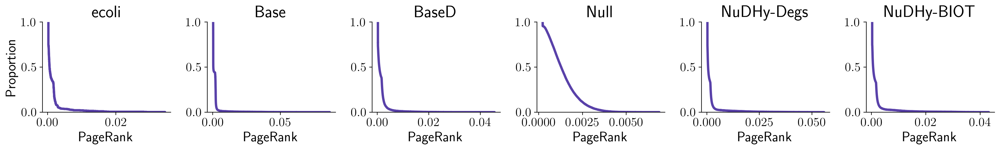

In [142]:
fig, ax = plt.subplots(1, len(order), figsize=(18, 3))

data = pr_obs.copy()
data['Sampler'] = dataset_names[root]
data = pd.concat([pr[['Node Id', 'Sampler', 'PageRank']], data])

for i, s in enumerate(order):
#     sns.boxplot(data=data[data['Sampler']==s], y='PageRank', ax=ax[i], 
#                 color=colors[0], width=.6)
    sns.ecdfplot(data=data[data['Sampler']==s], x='PageRank', ax=ax[i], 
                color=colors[0], complementary=True, linewidth=3)
    if i > 0:
        ax[i].set_ylabel('')

    ax[i].set_title(sampler_names.get(s, s))
plt.tight_layout()
plt.savefig(f'{root}_pagerank_distrib.pdf', bbox_inches='tight')
plt.show()

### Comparison Rankings

In [1142]:
rows = []
for sampler in pr['Sampler'].unique():
    for sample in pr['Sample Id'].unique():
        
        data = pr[(pr['Sampler']==sampler) &
                   (pr['Sample Id']==sample)]
        if data.empty: continue
        ts_pr = data.sort_values(by='PageRank', ascending=False).copy()
        ts_pr['Rank'] = np.arange(len(ts_pr)) + 1
        s_rank = ts_pr.sort_values(by='Node Id')['Rank'].values

        d_pr = pr_obs.sort_values(by='PageRank', ascending=False).copy()
        d_pr['Rank'] = np.arange(len(d_pr)) + 1
        data_rank = d_pr.sort_values(by='Node Id')['Rank'].values 

        pear = pearsonr(data_rank, s_rank)[0]
        kt = kendalltau(data_rank, s_rank)[0]

        pred_scores = data.sort_values(by=['Node Id'])['PageRank'].values
        pred_s = np.array([pred_scores])
        true_scores = pr_obs.sort_values(by='Node Id')['PageRank'].values
        true_s = np.array([true_scores])
        nDCG = ndcg_score(true_s, pred_s, ignore_ties=True)

        rows.append([sampler, sample, pear, kt, nDCG])

In [1143]:
pr_rank_comparison = pd.DataFrame(rows, columns=['Sampler', 'Sample', 'Pearson', 'Kendall-Tau', 'nDCG'])

In [1144]:
pr_rank_comparison.groupby(by=['Sampler']).agg(['mean', 'std'])

Sample           Pearson           Kendall-Tau                nDCG  \
          mean      std     mean       std        mean       std      mean   
Sampler                                                                      
NuDHy_A   16.0  9.66954  0.86537  0.003540    0.695195  0.004510  0.994496   
NuDHy_C   16.0  9.66954  0.99187  0.000402    0.934526  0.002114  0.999358   

                   
              std  
Sampler            
NuDHy_A  0.000578  
NuDHy_C  0.000032

## Output Table

In [1145]:
rank_comparison.groupby(by=['Sampler', 'Score']).agg({'nDCG':['mean', 'std']}).apply(lambda x: round(x, 3)).T

Sampler           NuDHy_A                   NuDHy_C          
Score     Authority Score Hub Score Authority Score Hub Score
nDCG mean           0.971     0.813           0.975     0.824
     std            0.021     0.092           0.025     0.082

In [1146]:
pr_rank_comparison.groupby(by=['Sampler']).agg({'nDCG':['mean', 'std']}).apply(lambda x: round(x, 3)).T

Sampler    NuDHy_A  NuDHy_C
nDCG mean    0.994    0.999
     std     0.001    0.000

# Econometric Indices

In [138]:
met_path = results_path + 'eco/'
year = '2019'
side = 'head'
root = f'hs{year}_thresh'
dname = dataset_names[root]
side_labels = {
    'head': 'Export',
    'tail': 'Import'
}

Node Labels

In [139]:
c_index = pd.read_csv(data_path + f'hs{year}_country_ids.tsv', header=None, sep='\t')
c_index.set_index(1, inplace=True)
c_index.columns = ['Country']
vmap = pd.read_csv(met_path + f'vmap_hs{year}_thresh.tsv', header=None, sep='\t')
vmap.set_index(1, inplace=True)
vmap.columns = ['VID']

## Data

Genepy

In [140]:
genepy_obs = pd.read_csv(f'{met_path}genepy_{root}_{side}.tsv', sep='\t', header=None)
genepy_obs.columns = ['VID', 'Genepy']

In [141]:
genepy_obs['Country'] = genepy_obs['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])

In [142]:
genepy = pd.DataFrame()
for sam in ['Base', 'BaseD', 'gmodel']:
    tmp = pd.read_csv(f'{met_path}genepy_{root}_samples_{sam}_{side}.tsv', sep='\t', header=None)
    if genepy.empty:
        genepy = tmp
    else:
        genepy = pd.concat([genepy, tmp])
genepy.columns = ['VID', 'Genepy', 'Sampler', 'Seed']

for sam in ['_UnpretentiousNullModel', '']:
    tmp = pd.read_csv(f'{met_path}genepy_{root}_samples{sam}_{side}.tsv', sep='\t', header=None)
    tmp.columns = ['VID', 'Genepy', 'Sampler', 'Seed']
    genepy = pd.concat([genepy, tmp])
    
tmp = pd.read_csv(f'{met_path}genepy_{root}_samples_gmodel_{side}.tsv', sep='\t', header=None)
tmp.columns = ['VID', 'Genepy', 'Sampler', 'Seed']
tmp['VID'] = tmp['VID'].apply

In [143]:
genepy['Sampler'] = genepy['Sampler'].apply(lambda x: rename_null_sampler(x))
genepy['Country'] = genepy['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])

ECI

In [144]:
eci_obs = pd.read_csv(f'{met_path}eci_{root}_{side}.tsv', sep='\t', header=None)
eci_obs.columns = ['VID', 'ECI']

In [145]:
eci_obs['Country'] = eci_obs['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])

In [146]:
eci = pd.read_csv(f'{met_path}eci_{root}_samples_{side}.tsv', sep='\t', header=None)
for sam in ['Base', 'BaseD', 'UnpretentiousNullModel', 'gmodel']:
    tmp = pd.read_csv(f'{met_path}eci_{root}_samples_{sam}_{side}.tsv', sep='\t', header=None)
    eci = pd.concat([eci, tmp])
eci.columns = ['VID', 'ECI', 'Sampler', 'Seed']

In [147]:
eci['Sampler'] = eci['Sampler'].apply(lambda x: rename_null_sampler(x))
eci['Country'] = eci['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])

Fitness

In [148]:
fit_obs = pd.read_csv(f'{met_path}fitness_{root}_{side}.tsv', sep='\t', header=None)
fit_obs.columns = ['VID', 'Fitness']
fit_obs['Country'] = fit_obs['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])

In [149]:
fit = pd.DataFrame()
for sam in ['NuDHy']:
    tmp = pd.read_csv(f'{met_path}fitness_{root}_samples_{sam}_{side}.tsv', sep='\t', header=None)
    tmp.columns = ['VID', 'Fitness', 'Sampler', 'Seed']
    if fit.empty:
        fit = tmp
    else:
        fit = pd.concat([fit, tmp])
fit['Country'] = fit['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])

## Score Distributions

### GENEPY

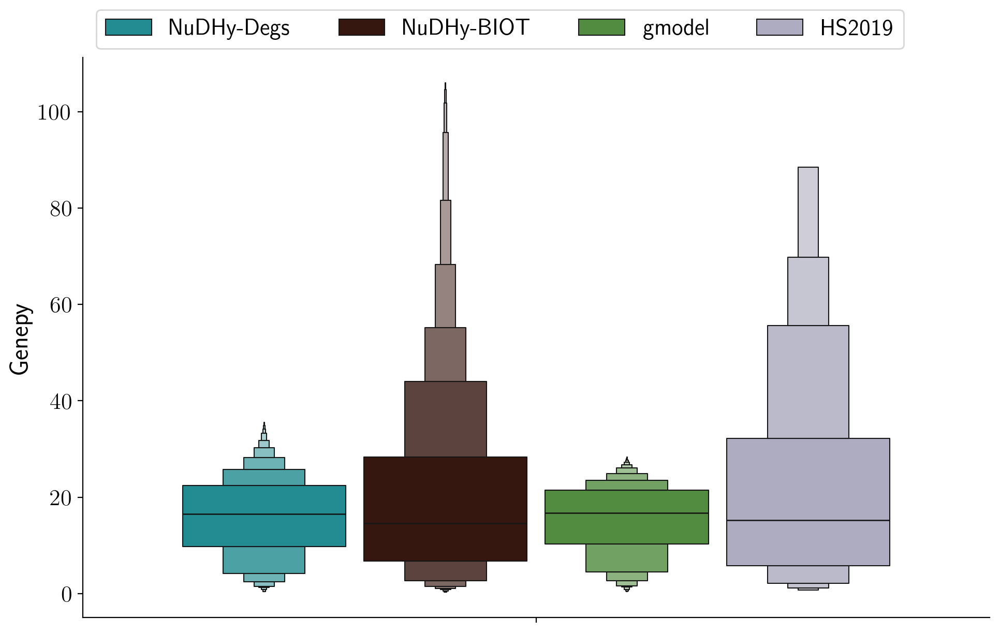

In [150]:
fig, ax = plt.subplots(1, figsize=(10,6))

tmp = genepy[genepy['Sampler'].isin(['NuDHy_A', 'NuDHy_C', 'gmodel'])][['VID', 'Genepy', 'Sampler']]
data = genepy_obs.copy()
data['Sampler'] = dname
data = pd.concat([tmp, data])

sns.boxenplot(data=data, hue='Sampler', y='Genepy', palette=palette[3:],
              hue_order=['NuDHy_A', 'NuDHy_C', 'gmodel', dname], gap=0.1,
              dodge=True, ax=ax, showfliers=False)

ax.set_xlabel('')

handles = ax.legend().legend_handles
labels = [text.get_text() for text in ax.legend().get_texts()]
labels = [sampler_names.get(s, s) for s in labels]
ax.legend().remove()
fig.legend(handles=handles, labels=labels, loc='upper center', 
           bbox_to_anchor=(0.5, 1.05), ncol=4, fontsize=16)
plt.tight_layout()
# plt.savefig(f'{root}_eci_distribution_{side}.pdf')
plt.show()

### ECI

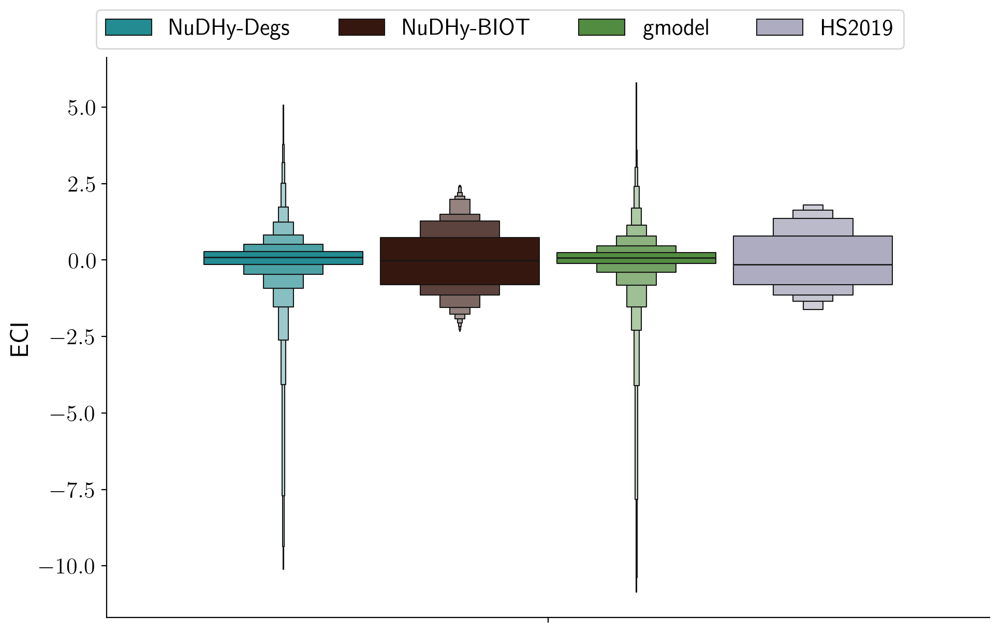

In [151]:
fig, ax = plt.subplots(1, figsize=(10,6))

tmp = eci[eci['Sampler'].isin(['NuDHy_A', 'NuDHy_C', 'gmodel'])][['VID', 'ECI', 'Sampler']]
data = eci_obs.copy()
data['Sampler'] = dname
data = pd.concat([tmp, data])

sns.boxenplot(data=data, hue='Sampler', y='ECI', palette=palette[3:],
              hue_order=['NuDHy_A', 'NuDHy_C', 'gmodel', dname], gap=0.1,
              dodge=True, ax=ax, showfliers=False)

ax.set_xlabel('')

handles = ax.legend().legend_handles
labels = [text.get_text() for text in ax.legend().get_texts()]
labels = [sampler_names.get(s, s) for s in labels]
ax.legend().remove()
fig.legend(handles=handles, labels=labels, loc='upper center', 
           bbox_to_anchor=(0.5, 1.05), ncol=4, fontsize=16)
plt.tight_layout()
# plt.savefig(f'{root}_eci_distribution_{side}.pdf')
plt.show()

### Fitness

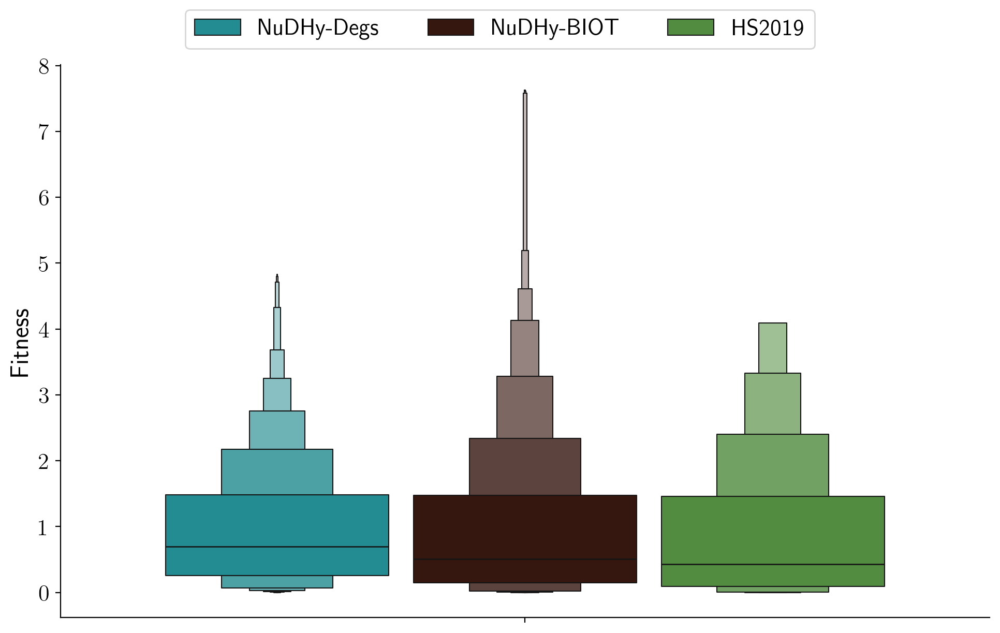

In [154]:
fig, ax = plt.subplots(1, figsize=(10,6))

tmp = fit[fit['Sampler'].isin(['NuDHy_A', 'NuDHy_C'])][['VID', 'Fitness', 'Sampler']]
data = fit_obs.copy()
data['Sampler'] = dname
data = pd.concat([tmp, data])

sns.boxenplot(data=data, hue='Sampler', y='Fitness', palette=palette[3:6],
              hue_order=['NuDHy_A', 'NuDHy_C', dname], gap=0.1,
              dodge=True, ax=ax, showfliers=False)

ax.set_xlabel('')

handles = ax.legend().legend_handles
labels = [text.get_text() for text in ax.legend().get_texts()]
labels = [sampler_names.get(s, s) for s in labels]
ax.legend().remove()
fig.legend(handles=handles, labels=labels, loc='upper center', 
           bbox_to_anchor=(0.5, 1.05), ncol=4, fontsize=16)
plt.tight_layout()
# plt.savefig(f'{root}_fitness_distribution_{side}.pdf')
plt.show()

## GENEPY Rankings

In [35]:
# OBSERVED DATASET
ds = genepy_obs.sort_values(by='Genepy', ascending=False).copy()
ds['Rank'] = np.arange(len(ds)) + 1
ds['Sampler'] = dname
d_rank = ds.sort_values(by='VID')['Rank'].values
ranks = [ds[['Sampler', 'Country', 'Rank']]]

In [36]:
ds.head(50)['Country'].values

array(['JPN', 'DEU', 'CHN', 'KOR', 'CHE', 'USA', 'FRA', 'CZE', 'SGP',
       'BEL', 'NLD', 'IND', 'ITA', 'GBR', 'AUT', 'ISR', 'SWE', 'MYS',
       'THA', 'SVN', 'FIN', 'MEX', 'ESP', 'HUN', 'SVK', 'POL', 'DNK',
       'ROU', 'TUR', 'EST', 'LTU', 'CAN', 'PHL', 'IDN', 'VNM', 'PRT',
       'HRV', 'BGR', 'LVA', 'BLR', 'IRL', 'PAK', 'BRA', 'TUN', 'EGY',
       'RUS', 'SRB', 'BIH', 'CYP', 'GRC'], dtype=object)

In [37]:
rank_comp = []
higher_rank = dict()

for sampler in genepy['Sampler'].unique():
    gen_samp = genepy[genepy['Sampler']==sampler]
    s_higher_rank = defaultdict(int)
    for sample_id in gen_samp['Seed'].unique():
        gen_ss = gen_samp[gen_samp['Seed']==sample_id].copy()

        ts = gen_ss.sort_values(by='Genepy', ascending=False).copy()
        ts['Rank'] = np.arange(len(ts)) + 1
        ts['Country'] = ts['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])
        s_rank = ts.sort_values(by='VID')['Rank'].values
        ranks.append(ts[['Sampler', 'Seed', 'Country', 'Rank']])
        
        for idx, r in enumerate(s_rank):
            if d_rank[idx] >= r:
                s_higher_rank[idx] += 1
    
        pear = pearsonr(d_rank, s_rank)[0]
        kt = kendalltau(d_rank, s_rank)[0]

        rank_comp.append([sampler, sample_id, pear, kt])
    higher_rank[sampler] = s_higher_rank

ranks = pd.concat(ranks)
rank_comp = pd.DataFrame(rank_comp, columns=['Sampler', 'Seed', 'Spearman', 'Kendall-Tau'])

In [38]:
sign_rank = dict()

for sampler in higher_rank:
    s_higher_rank = higher_rank[sampler]
    s_sign_rank = dict()
    for k,v in s_higher_rank.items():
        if v/33 <= 0.05:
            s_sign_rank[k] = v/33
    sign_rank[sampler] = s_sign_rank

In [39]:
for sampler in ['NuDHy_A', 'NuDHy_C']:
    s_sign_rank = sign_rank[sampler]
    print(sampler)
    print('-------')
    for x in s_sign_rank:
        print(c_index.loc[vmap.loc[x, 'VID'], 'Country'])
    print('********')

NuDHy_A
-------
UZB
MYS
TKM
PAN
BRA
********
NuDHy_C
-------
MKD
EST
SAU
CHE
SWZ
IRL
********


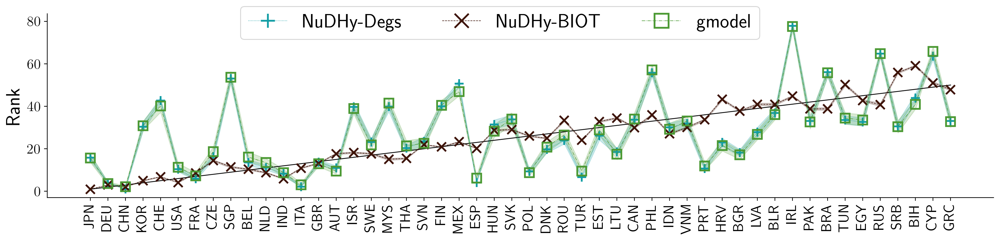

In [111]:
fig, ax = plt.subplots(figsize=(16, 4))

order1 = ['NuDHy_A', 'NuDHy_C', 'gmodel']
color1 = [colors[3], colors[4], colors[5]]

styles = [':', '--', '-.', '-', '--', ':']
markers = ['+', 'x', 's', '<', '>', 'o']

top_ = ranks[ranks['Sampler']==dname]
top_ = top_.sort_values(by='Rank').head(50)['Country'].values
data = ranks[(ranks['Country'].isin(top_))]

datas = data[data['Sampler']==dname]
sns.lineplot(data=datas, x='Country', y='Rank', color='black', marker=None,
             linestyle='-', linewidth=.9)

for idx, sam in enumerate(order1):
    datas = data[data['Sampler']==sam]
    sns.lineplot(data=datas, x='Country', y='Rank', color=color1[idx], marker=markers[idx],
                 markerfacecolor='none', markeredgewidth=2, markeredgecolor=color1[idx],
                 markersize=10, linestyle=styles[idx], linewidth=.6, label=sam)
ax.set_xlabel('')
ax.set_ylabel('Rank', fontsize=22)
for tick in ax.get_xticklabels():
        tick.set_rotation(90)
handles = ax.legend().legend_handles
[h.set_markersize(8) for h in handles]
labels = [text.get_text() for text in ax.legend().get_texts()]
labels = [sampler_names.get(s, s) for s in labels]
ax.legend().remove()
fig.legend(handles=handles, labels=labels, loc='upper center', markerscale=2.,
           bbox_to_anchor=(0.5, 1), ncol=6, fontsize=22)

# plt.savefig(f'{root}_genepy_rankings.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

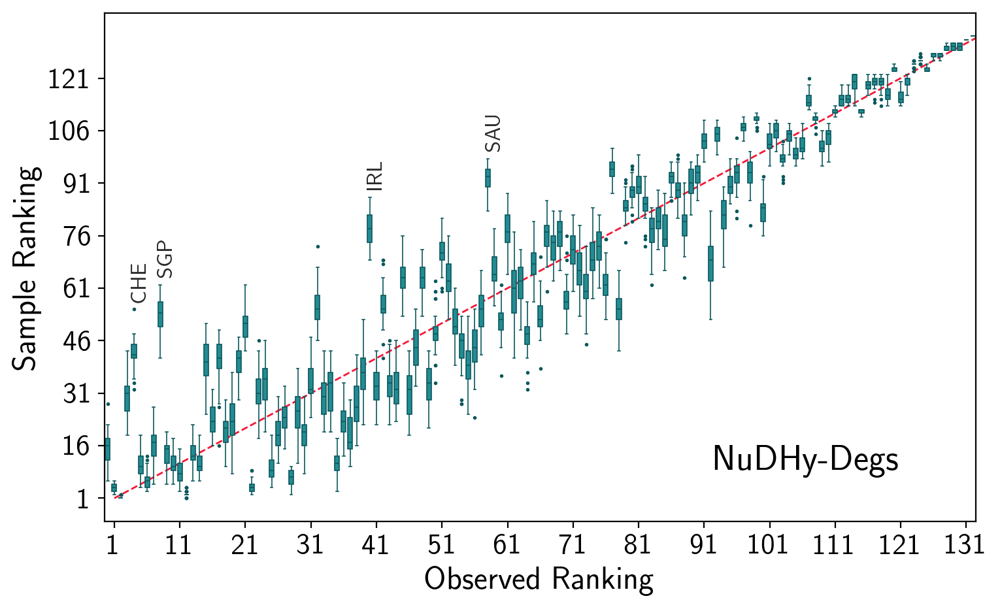

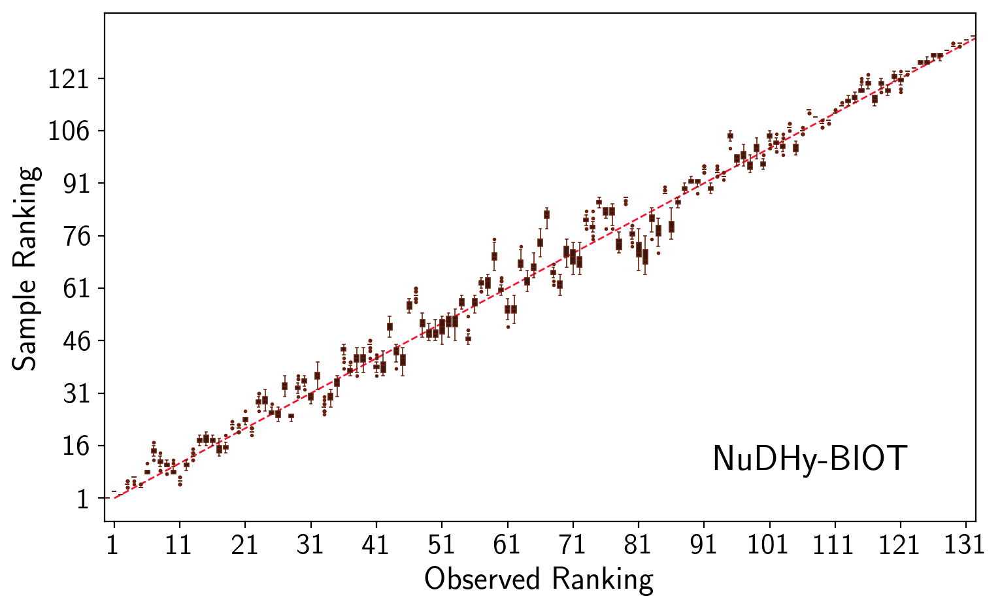

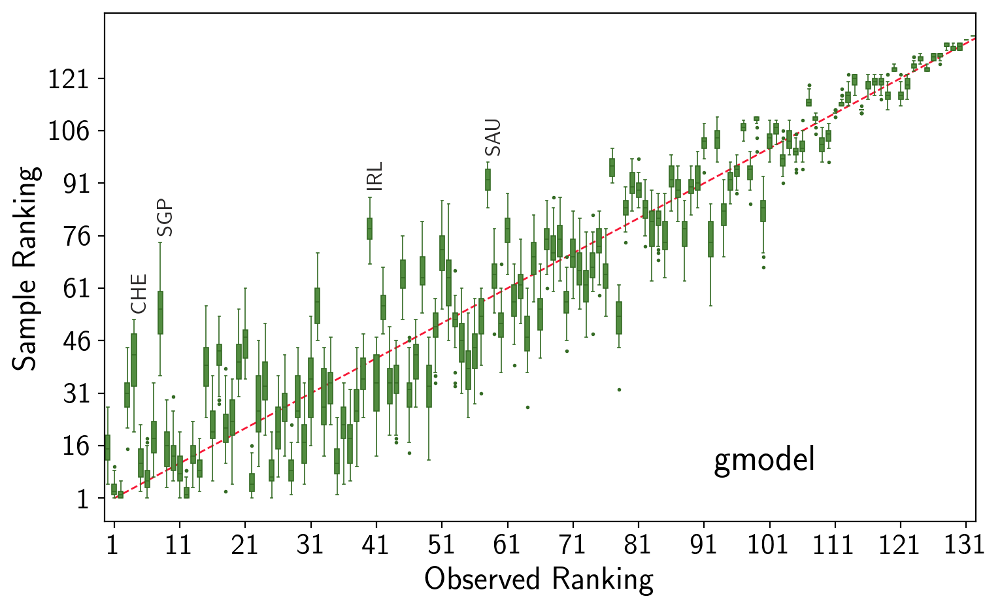

In [112]:
color1 = [colors[3], colors[4], colors[5]]
linecolor1 = ['#0A585C', '#6C210E', '#346B24']

for idx, sam in enumerate(['NuDHy_A', 'NuDHy_C', 'gmodel']):
    fig, ax = plt.subplots(figsize=(8, 5))

    data_obs = ranks[ranks['Sampler']==dname][['Country', 'Rank']]
    data_obs.columns = ['Country', 'Obs Rank']

    datas = ranks[ranks['Sampler']==sam].copy()
    datas = datas.merge(data_obs)
    
    ax.plot([1, datas['Rank'].max()], [1, datas['Rank'].max()], color='#F71735', 
            linewidth=1, linestyle='--')
    box = sns.boxplot(data=datas, x='Obs Rank', y='Rank', color=color1[idx], width=1,
                      gap=.3, linewidth=.6, fliersize=1, linecolor=linecolor1[idx])
    
    ax.set_xlabel('Observed Ranking')
    ax.set_xticks(np.arange(1, 134, 10), np.arange(1, 134, 10))
    ax.set_ylabel('Sample Ranking')
    ax.set_yticks(np.arange(1, 134, 15), np.arange(1, 134, 15))
    
    df1 = datas.groupby('Obs Rank')['Rank'].agg(Max='max', Min='min')
    avg_rank = datas.groupby(by=['Obs Rank', 'Country'])['Rank'].mean().reset_index()
    avg_rank['Abs Diff'] = (avg_rank['Rank'] - avg_rank['Obs Rank']).apply(abs)
    avg_rank['Diff'] = (avg_rank['Rank'] - avg_rank['Obs Rank'])
    top_diffs = avg_rank.sort_values(by='Abs Diff', ascending=False).head(4).set_index('Obs Rank')
    for i in df1.Max.index:
        if i in top_diffs.index and sam != 'NuDHy_C':
            if top_diffs.loc[i, 'Diff'] > 0:
                box.annotate(top_diffs.loc[i, 'Country'], xy=(i, df1.Max[i]+3), 
                             ha='center', color='#2A2828', rotation=90, fontsize=12)
            else:
                box.annotate(top_diffs.loc[i, 'Country'], xy=(i, df1.Min[i]-10), 
                             ha='center', color='#2A2828', rotation=90, fontsize=12)
    ax.spines['right'].set_visible(True)
    ax.spines['top'].set_visible(True)
    ax.text(0.7, 0.1, sampler_names.get(sam, sam), fontsize=20, transform=ax.transAxes)
#     plt.savefig(f'{root}_genepy_rankings_box_{sam}.pdf', bbox_inches='tight')
    plt.tight_layout()
    plt.show()

In [113]:
output = rank_comp.copy()
output = output.groupby(by='Sampler').agg({'Spearman':['mean', 'std'],
                                          'Kendall-Tau': ['mean', 'std']})

In [114]:
print(output.T.to_latex(float_format="%.3f"))

\begin{tabular}{llrrrrrr}
\toprule
 & Sampler & Base & BaseD & NuDHy_A & NuDHy_C & Null & gmodel \\
\midrule
\multirow[t]{2}{*}{Spearman} & mean & 0.015 & 0.230 & 0.941 & 0.993 & -0.002 & 0.939 \\
 & std & 0.079 & 0.059 & 0.004 & 0.000 & 0.061 & 0.005 \\
\cline{1-8}
\multirow[t]{2}{*}{Kendall-Tau} & mean & 0.010 & 0.156 & 0.801 & 0.937 & -0.001 & 0.798 \\
 & std & 0.054 & 0.040 & 0.007 & 0.002 & 0.040 & 0.009 \\
\cline{1-8}
\bottomrule
\end{tabular}



### Map

In [115]:
country_geopandas = geopandas.read_file(
    geopandas.datasets.get_path('naturalearth_lowres')
)

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_25999/3635828425.py:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  geopandas.datasets.get_path('naturalearth_lowres')


In [116]:
agg_ranks = ranks.groupby(by=['Sampler', 'Country']).agg({'Rank': ['mean', 'std']}).reset_index()
agg_ranks.columns.droplevel(0)
agg_ranks.columns = ['Sampler', 'Country', 'Mean Rank', 'STD Rank']

In [117]:
tmp = agg_ranks[agg_ranks['Sampler']==dataset_names[root]][['Country', 'Mean Rank']]
tmp.columns = ['Country', 'Rank']
agg_ranks = agg_ranks[agg_ranks['Sampler']!=dataset_names[root]].merge(tmp, on='Country')

In [118]:
agg_ranks['z-score'] = (agg_ranks['Rank'] - agg_ranks['Mean Rank']) / agg_ranks['STD Rank']
agg_ranks.replace([np.inf, -np.inf], np.nan, inplace=True)

In [119]:
df_A = country_geopandas.merge(agg_ranks[agg_ranks['Sampler']=='NuDHy_A'],
                               left_on='iso_a3', right_on='Country', how='left')
df_A = df_A[df_A['continent']!='Antarctica']
df_A_ = df_A[~df_A['z-score'].isna()]
df_A_white = df_A[df_A['z-score'].isna()]

df_C = country_geopandas.merge(agg_ranks[agg_ranks['Sampler']=='NuDHy_C'],
                               left_on='iso_a3', right_on='Country', how='left')
df_C = df_C[df_C['continent']!='Antarctica']
df_C_ = df_C[~df_C['z-score'].isna()]
df_C_white = df_C[df_C['z-score'].isna()]

df_db = country_geopandas.merge(agg_ranks, left_on='iso_a3', 
                                right_on='Country', how='left')
df_db = df_db[df_db['continent']!='Antarctica']
df_db_ = df_db[~df_db['Rank'].isna()]
df_db_white = df_db[df_db['Rank'].isna()]

NUDHY A

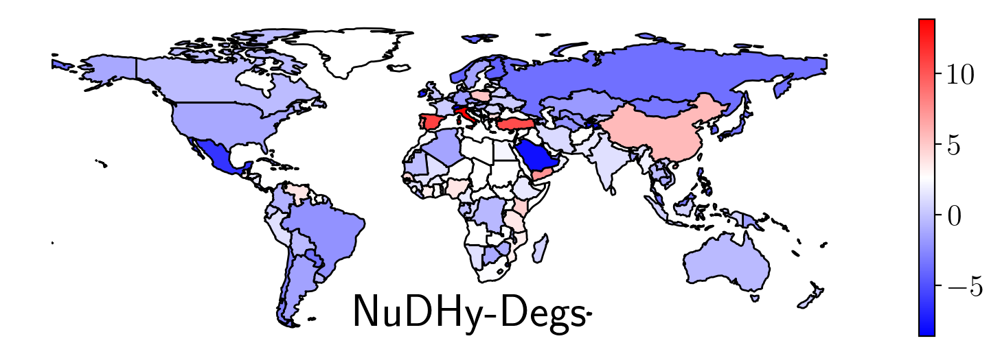

In [120]:
fig, ax = plt.subplots(figsize=(10,10))

df_A_.plot(column='z-score', legend=True, legend_kwds={'shrink': 0.3},
           cmap="bwr", edgecolor='black', ax=ax)
df_A_white.plot(color="white", edgecolor='black', ax=ax)

ax.set_xticks([])
ax.set_yticks([])
title = sampler_names.get('NuDHy_A')
ax.text(0.4, 0.05, title, transform=ax.transAxes, 
        fontsize=24, color='black')
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(f'map_nudhya_{root}_genepy.pdf', bbox_inches='tight')
plt.show()

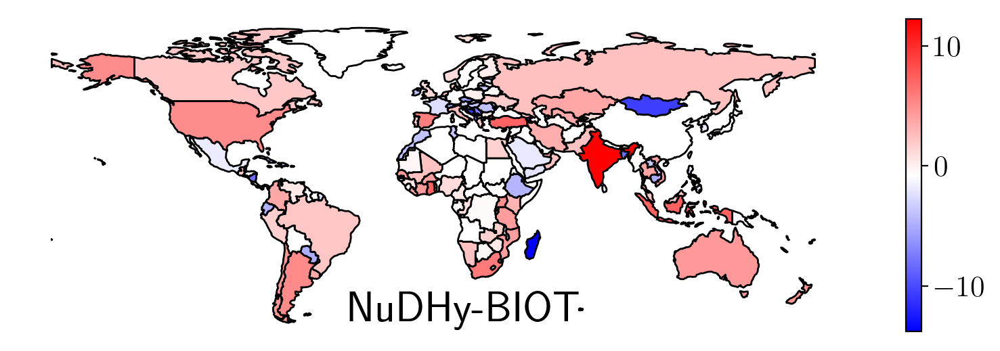

In [121]:
fig, ax = plt.subplots(figsize=(10,10))

df_C_.plot(column='z-score', legend=True, legend_kwds={'shrink': 0.3},
           cmap="bwr", edgecolor='black', ax=ax)
df_C_white.plot(color="white", edgecolor='black', ax=ax)
ax.set_xticks([])
ax.set_yticks([])
title = sampler_names.get('NuDHy_C')
ax.text(0.4, 0.05, title, transform=ax.transAxes, 
        fontsize=23, color='black')
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(f'map_nudhyc_{root}_genepy.pdf', bbox_inches='tight')
plt.show()

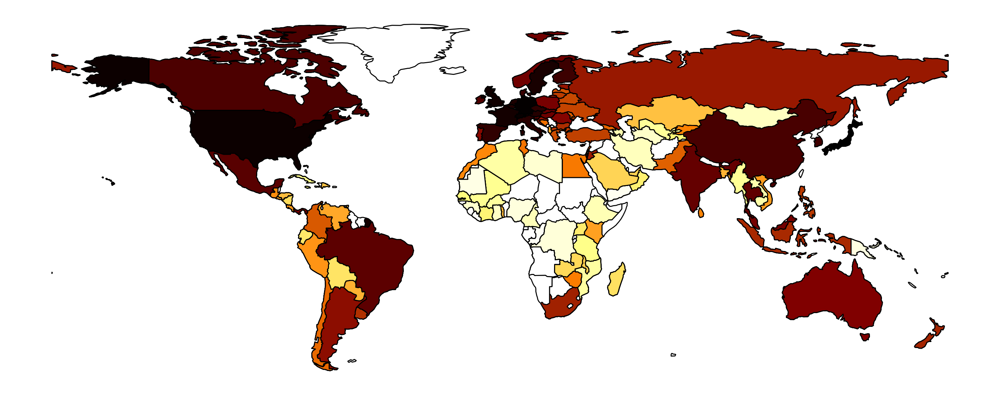

In [680]:
fig, ax = plt.subplots(figsize=(18,18))

df_db_.plot(column='Rank', legend=False, cmap="afmhot", edgecolor='black', ax=ax)
df_db_white.plot(color="white", edgecolor='black', ax=ax)
ax.set_xticks([])
ax.set_yticks([])
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(f'map_{root}_genepy.pdf', bbox_inches='tight')
plt.show()

## ECI Rankings

In [40]:
## OBSERVED DATASET
ds = eci_obs.sort_values(by='ECI', ascending=False).copy()
ds['Rank'] = np.arange(len(ds)) + 1
ds['Sampler'] = dname
ranks = [ds[['Sampler', 'Country', 'Rank']]]

In [41]:
ds.head(50)['Country'].values

array(['JPN', 'CHE', 'DEU', 'SGP', 'KOR', 'USA', 'CZE', 'SWE', 'FIN',
       'AUT', 'SVN', 'GBR', 'BEL', 'HUN', 'FRA', 'SVK', 'IRL', 'ISR',
       'NLD', 'MEX', 'CAN', 'DNK', 'POL', 'ITA', 'MYS', 'EST', 'NOR',
       'SAU', 'ROU', 'LTU', 'LVA', 'CHN', 'BLR', 'HRV', 'RUS', 'THA',
       'ESP', 'SRB', 'CYP', 'UKR', 'NZL', 'TTO', 'BRA', 'BIH', 'BGR',
       'PHL', 'IND', 'CRI', 'BHR', 'TUR'], dtype=object)

In [42]:
rank_comp = []
higher_rank = dict()

for sampler in eci['Sampler'].unique():
    eci_samp = eci[eci['Sampler']==sampler]
    s_higher_rank = defaultdict(int)
    for sample_id in eci_samp['Seed'].unique():
        eci_ss = eci_samp[eci_samp['Seed']==sample_id].copy()

        ts = eci_ss.sort_values(by='ECI', ascending=False).copy()
        ts['Rank'] = np.arange(len(ts)) + 1
        ts['Country'] = ts['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])
        common = set(ds['VID'].values)
        common = common.intersection(ts['VID'].values)
        d_rank = ds[ds['VID'].isin(common)].sort_values(by='VID')['Rank'].values
        s_rank = ts[ts['VID'].isin(common)].sort_values(by='VID')['Rank'].values
        
        for idx, r in enumerate(s_rank):
            if d_rank[idx] >= r:
                s_higher_rank[idx] += 1
        
        ranks.append(ts[['Sampler', 'Seed', 'Country', 'Rank']])

        pear = pearsonr(d_rank, s_rank)[0]
        kt = kendalltau(d_rank, s_rank)[0]

        rank_comp.append([sampler, sample_id, pear, kt])
    higher_rank[sampler] = s_higher_rank

ranks = pd.concat(ranks)
rank_comp = pd.DataFrame(rank_comp, columns=['Sampler', 'Seed', 'Spearman', 'Kendall-Tau'])

In [50]:
sign_rank = dict()

for sampler in higher_rank:
    s_higher_rank = higher_rank[sampler]
    s_sign_rank = dict()
    for k,v in s_higher_rank.items():
        if v/33 <= 0.05:
            s_sign_rank[k] = v/33
    sign_rank[sampler] = s_sign_rank

In [47]:
for sampler in ['NuDHy_A', 'NuDHy_C']:
    s_sign_rank = sign_rank[sampler]
    print(sampler)
    print('-------')
    for x in s_sign_rank:
        print(c_index.loc[vmap.loc[x, 'VID'], 'Country'])
    print('********')

NuDHy_A
-------
CAN
MEX
EST
********
NuDHy_C
-------
GHA
LAO
KWT
SEN
VEN
********


/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_25999/830867739.py:26: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles = ax.legend().legendHandles


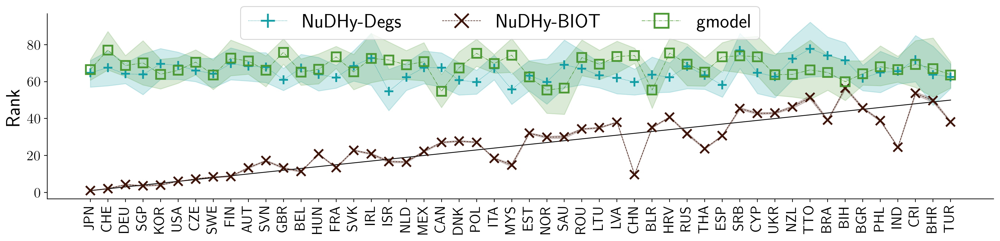

In [125]:
fig, ax = plt.subplots(figsize=(16, 4))

order1 = ['NuDHy_A', 'NuDHy_C', 'gmodel']
color1 = [colors[3], colors[4], colors[5]]

styles = [':', '--', '-.', '-', '--', ':']
markers = ['+', 'x', 's', '<', '>', 'o']

top_ = ranks[ranks['Sampler']==dname]
top_ = top_.sort_values(by='Rank').head(50)['Country'].values
data = ranks[(ranks['Country'].isin(top_))]

datas = data[data['Sampler']==dname]
sns.lineplot(data=datas, x='Country', y='Rank', color='black', marker=None,
             linestyle='-', linewidth=.9)

for idx, sam in enumerate(order1):
    datas = data[data['Sampler']==sam]
    sns.lineplot(data=datas, x='Country', y='Rank', color=color1[idx], marker=markers[idx],
                 markerfacecolor='none', markeredgewidth=2, markeredgecolor=color1[idx],
                 markersize=10, linestyle=styles[idx], linewidth=.6, label=sam)
ax.set_xlabel('')
ax.set_ylabel('Rank', fontsize=22)
for tick in ax.get_xticklabels():
        tick.set_rotation(90)
handles = ax.legend().legendHandles
[h.set_markersize(8) for h in handles]
labels = [text.get_text() for text in ax.legend().get_texts()]
labels = [sampler_names.get(s, s) for s in labels]
ax.legend().remove()
fig.legend(handles=handles, labels=labels, loc='upper center', markerscale=2.,
           bbox_to_anchor=(0.5, 1), ncol=6, fontsize=22)

# plt.savefig(f'{root}_eci_rankings.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

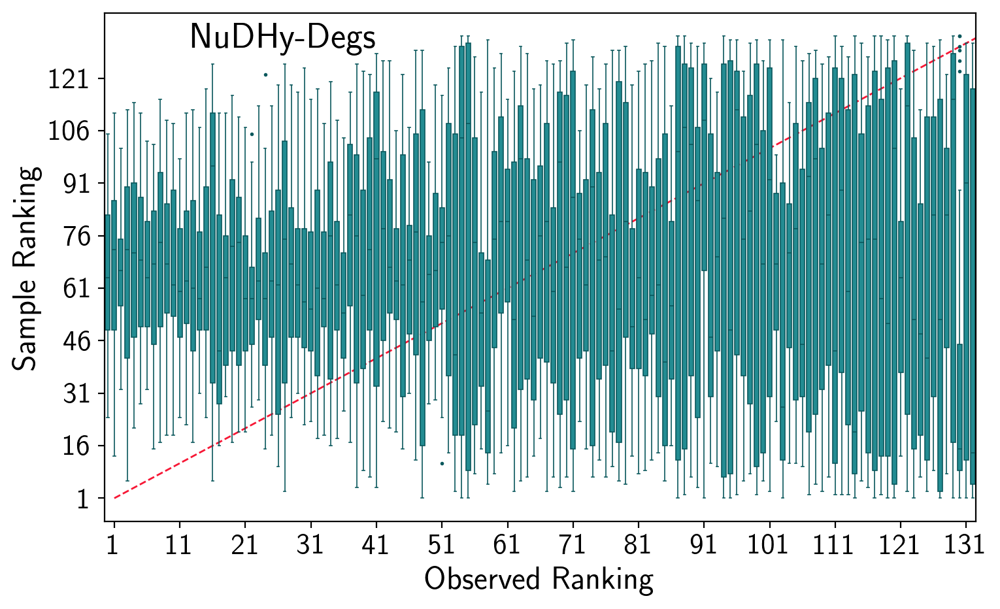

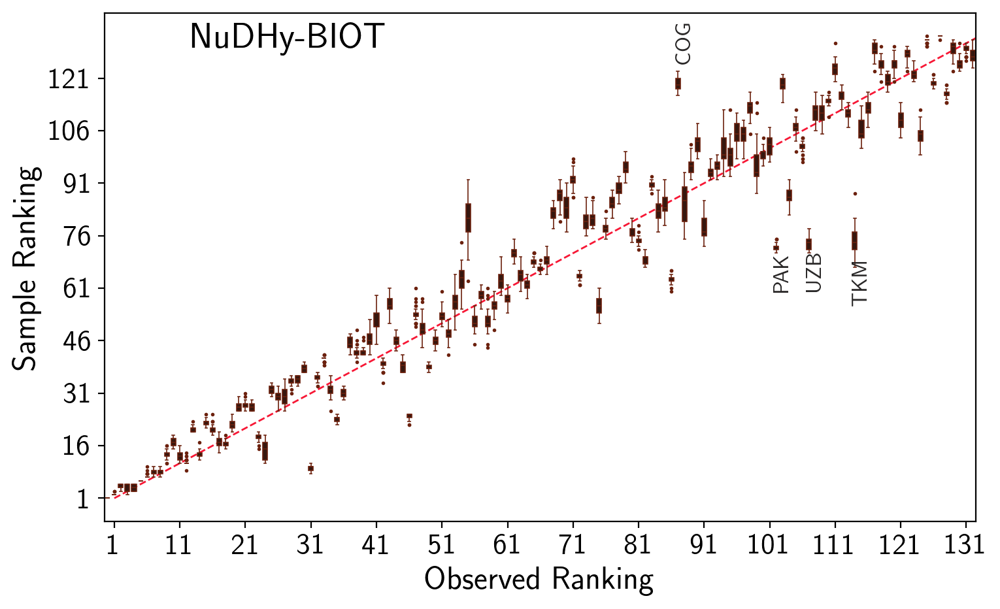

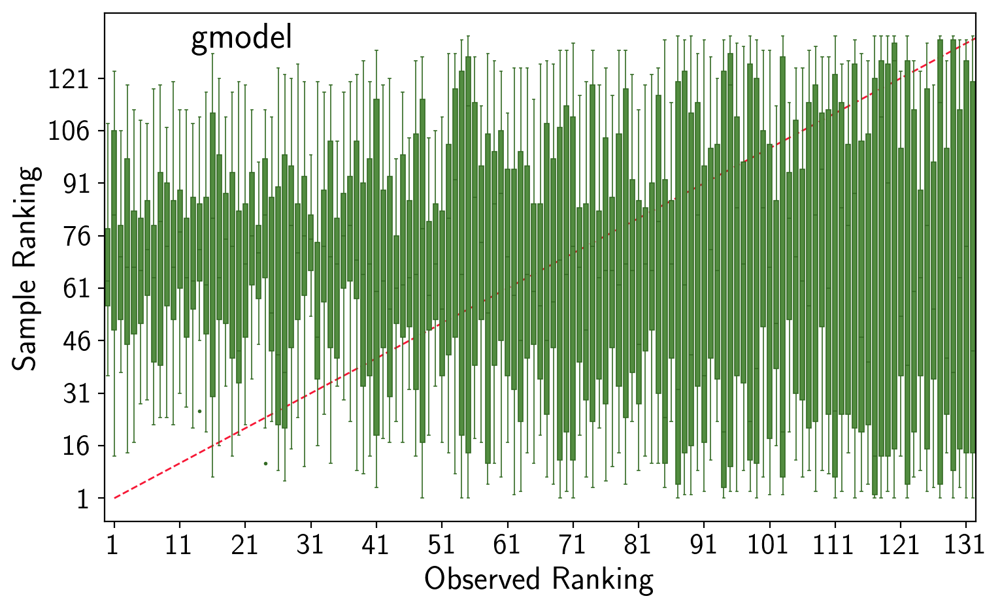

In [126]:
color1 = [colors[3], colors[4], colors[5]]
linecolor1 = ['#0A585C', '#6C210E', '#346B24']

for idx, sam in enumerate(['NuDHy_A', 'NuDHy_C', 'gmodel']):
    fig, ax = plt.subplots(figsize=(8, 5))

    data_obs = ranks[ranks['Sampler']==dname][['Country', 'Rank']]
    data_obs.columns = ['Country', 'Obs Rank']

    datas = ranks[ranks['Sampler']==sam].copy()
    datas = datas.merge(data_obs)
    
    ax.plot([1, datas['Rank'].max()], [1, datas['Rank'].max()], color='#F71735', 
            linewidth=1, linestyle='--')
    box = sns.boxplot(data=datas, x='Obs Rank', y='Rank', color=color1[idx], width=1,
                      gap=.3, linewidth=.6, fliersize=1, linecolor=linecolor1[idx])
    
    ax.set_xlabel('Observed Ranking')
    ax.set_xticks(np.arange(1, 134, 10), np.arange(1, 134, 10))
    ax.set_ylabel('Sample Ranking')
    ax.set_yticks(np.arange(1, 134, 15), np.arange(1, 134, 15))
    
    df1 = datas.groupby('Obs Rank')['Rank'].agg(Max='max', Min='min')
    avg_rank = datas.groupby(by=['Obs Rank', 'Country'])['Rank'].mean().reset_index()
    avg_rank['Abs Diff'] = (avg_rank['Rank'] - avg_rank['Obs Rank']).apply(abs)
    avg_rank['Diff'] = (avg_rank['Rank'] - avg_rank['Obs Rank'])
    top_diffs = avg_rank.sort_values(by='Abs Diff', ascending=False).head(4).set_index('Obs Rank')
    for i in df1.Max.index:
        if i in top_diffs.index and sam == 'NuDHy_C':
            if top_diffs.loc[i, 'Diff'] > 0:
                box.annotate(top_diffs.loc[i, 'Country'], xy=(i, df1.Max[i]+3), 
                             ha='center', color='#2A2828', rotation=90, fontsize=12)
            else:
                box.annotate(top_diffs.loc[i, 'Country'], xy=(i, df1.Min[i]-10), 
                             ha='center', color='#2A2828', rotation=90, fontsize=12)
    ax.spines['right'].set_visible(True)
    ax.spines['top'].set_visible(True)
    ax.text(0.1, 0.93, sampler_names.get(sam, sam), fontsize=20, transform=ax.transAxes)
#     ax.text(0.7, 0.1, sampler_names.get(sam, sam), fontsize=20, transform=ax.transAxes)
#     plt.savefig(f'{root}_eci_rankings_box_{sam}.pdf', bbox_inches='tight')
    plt.tight_layout()
    plt.show()

In [79]:
output = rank_comp.copy()
output = output.groupby(by='Sampler').agg({'Spearman':['mean', 'std'],
                                          'Kendall-Tau': ['mean', 'std']})

In [80]:
print(output.T.to_latex(float_format="%.3f"))

\begin{tabular}{llrrrrrr}
\toprule
 & Sampler & Base & BaseD & NuDHy_A & NuDHy_C & Null & gmodel \\
\midrule
\multirow[t]{2}{*}{Spearman} & mean & -0.144 & -0.055 & 0.020 & 0.964 & 0.007 & -0.022 \\
 & std & 0.143 & 0.120 & 0.121 & 0.001 & 0.093 & 0.100 \\
\cline{1-8}
\multirow[t]{2}{*}{Kendall-Tau} & mean & -0.092 & -0.037 & 0.015 & 0.848 & 0.005 & -0.015 \\
 & std & 0.092 & 0.079 & 0.082 & 0.004 & 0.062 & 0.069 \\
\cline{1-8}
\bottomrule
\end{tabular}



### Map

In [686]:
country_geopandas = geopandas.read_file(
    geopandas.datasets.get_path('naturalearth_lowres')
)

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_98345/3635828425.py:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  geopandas.datasets.get_path('naturalearth_lowres')


In [687]:
agg_ranks = ranks.groupby(by=['Sampler', 'Country']).agg({'Rank': ['mean', 'std']}).reset_index()
agg_ranks.columns.droplevel(0)
agg_ranks.columns = ['Sampler', 'Country', 'Mean Rank', 'STD Rank']

In [688]:
tmp = agg_ranks[agg_ranks['Sampler']==dataset_names[root]][['Country', 'Mean Rank']]
tmp.columns = ['Country', 'Rank']
agg_ranks = agg_ranks[agg_ranks['Sampler']!=dataset_names[root]].merge(tmp, on='Country')

In [689]:
agg_ranks['z-score'] = (agg_ranks['Rank'] - agg_ranks['Mean Rank']) / agg_ranks['STD Rank']
agg_ranks.replace([np.inf, -np.inf], np.nan, inplace=True)

In [690]:
df_A = country_geopandas.merge(agg_ranks[agg_ranks['Sampler']=='NuDHy_A'],
                               left_on='iso_a3', right_on='Country', how='left')
df_A = df_A[df_A['continent']!='Antarctica']
df_A_ = df_A[~df_A['z-score'].isna()]
df_A_white = df_A[df_A['z-score'].isna()]

df_C = country_geopandas.merge(agg_ranks[agg_ranks['Sampler']=='NuDHy_C'],
                               left_on='iso_a3', right_on='Country', how='left')
df_C = df_C[df_C['continent']!='Antarctica']
df_C_ = df_C[~df_C['z-score'].isna()]
df_C_white = df_C[df_C['z-score'].isna()]

df_db = country_geopandas.merge(agg_ranks, left_on='iso_a3', 
                                right_on='Country', how='left')
df_db = df_db[df_db['continent']!='Antarctica']
df_db_ = df_db[~df_db['Rank'].isna()]
df_db_white = df_db[df_db['Rank'].isna()]

NUDHY A

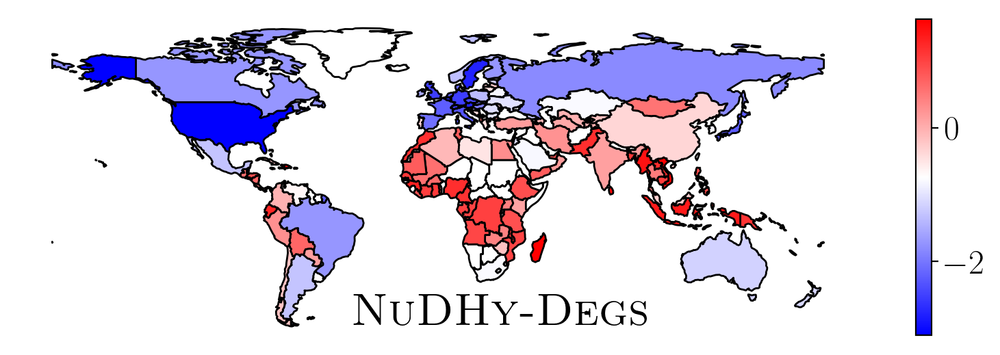

In [691]:
fig, ax = plt.subplots(figsize=(10,10))

df_A_.plot(column='z-score', legend=True, legend_kwds={'shrink': 0.3},
           cmap="bwr", edgecolor='black', ax=ax)
df_A_white.plot(color="white", edgecolor='black', ax=ax)

ax.set_xticks([])
ax.set_yticks([])
ax.text(0.4, 0.05, sampler_names.get('NuDHy_A'), 
        transform=ax.transAxes, fontsize=24, color='black')
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(f'map_nudhya_{root}_eci.pdf', bbox_inches='tight')
plt.show()

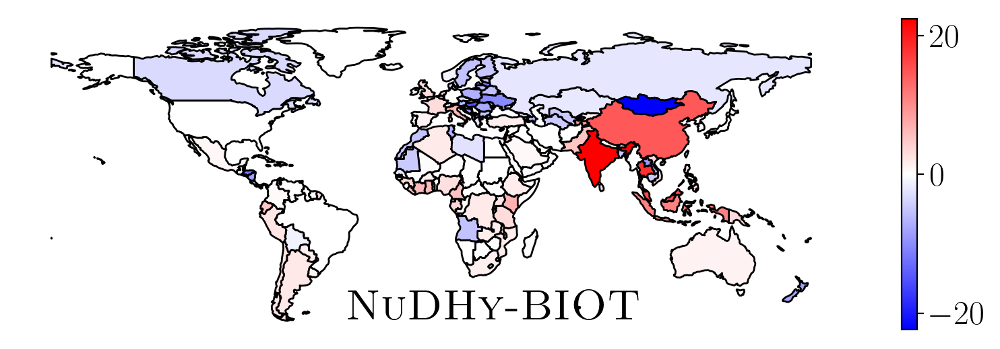

In [692]:
fig, ax = plt.subplots(figsize=(10,10))

df_C_.plot(column='z-score', legend=True, legend_kwds={'shrink': 0.3},
           cmap="bwr", edgecolor='black', ax=ax)
df_C_white.plot(color="white", edgecolor='black', ax=ax)
ax.set_xticks([])
ax.set_yticks([])
title = '\\textsc{' + sampler_names.get('NuDHy_C') + '}'
ax.text(0.4, 0.05, r'{}'.format(title), transform=ax.transAxes, 
        fontsize=23, color='black')
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(f'map_nudhyc_{root}_eci.pdf', bbox_inches='tight')
plt.show()

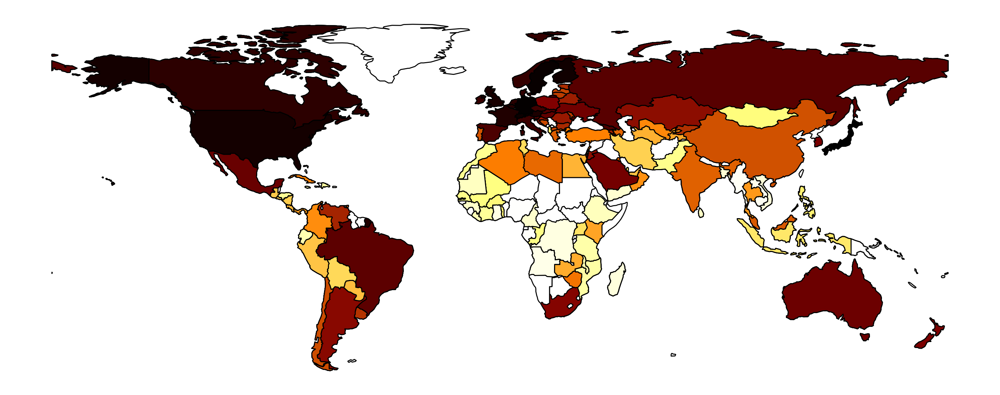

In [693]:
fig, ax = plt.subplots(figsize=(18,18))

df_db_.plot(column='Rank', legend=False, cmap="afmhot", edgecolor='black', ax=ax)
df_db_white.plot(color="white", edgecolor='black', ax=ax)
ax.set_xticks([])
ax.set_yticks([])
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(f'map_{root}_eci.pdf', bbox_inches='tight')
plt.show()

## Fitness Rankings

In [155]:
# OBSERVED DATASET
ds = fit_obs.sort_values(by='Fitness', ascending=False).copy()
ds['Rank'] = np.arange(len(ds)) + 1
ds['Sampler'] = dname
d_rank = ds.sort_values(by='VID')['Rank'].values
ranks = [ds[['Sampler', 'Country', 'Rank']]]

In [156]:
rank_comp = []
higher_rank = dict()

for sampler in fit['Sampler'].unique():
    fit_s = fit[fit['Sampler']==sampler]
    s_higher_rank = defaultdict(int)
    for sample_id in fit_s['Seed'].unique():
        fit_ss = fit_s[fit_s['Seed']==sample_id].copy()

        ts = fit_ss.sort_values(by='Fitness', ascending=False).copy()
        ts['Rank'] = np.arange(len(ts)) + 1
        ts['Country'] = ts['VID'].apply(lambda x: c_index.loc[vmap.loc[x, 'VID'], 'Country'])
        s_rank = ts.sort_values(by='VID')['Rank'].values
        ranks.append(ts[['Sampler', 'Seed', 'Country', 'Rank']])
        
        for idx, r in enumerate(s_rank):
            if d_rank[idx] >= r:
                s_higher_rank[idx] += 1
    
        pear = pearsonr(d_rank, s_rank)[0]
        kt = kendalltau(d_rank, s_rank)[0]

        rank_comp.append([sampler, sample_id, pear, kt])
    higher_rank[sampler] = s_higher_rank

ranks = pd.concat(ranks)
rank_comp = pd.DataFrame(rank_comp, columns=['Sampler', 'Seed', 'Spearman', 'Kendall-Tau'])

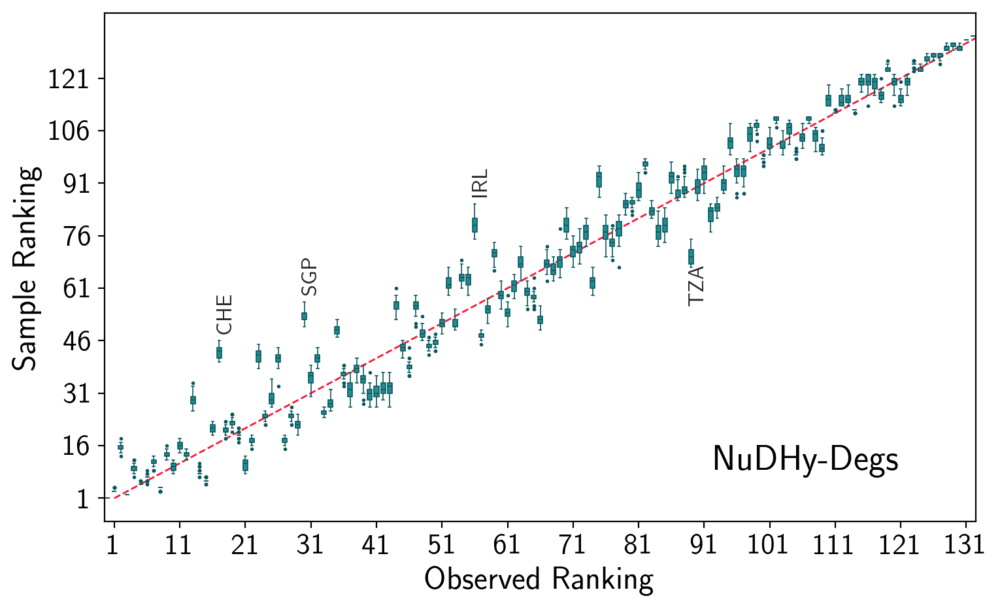

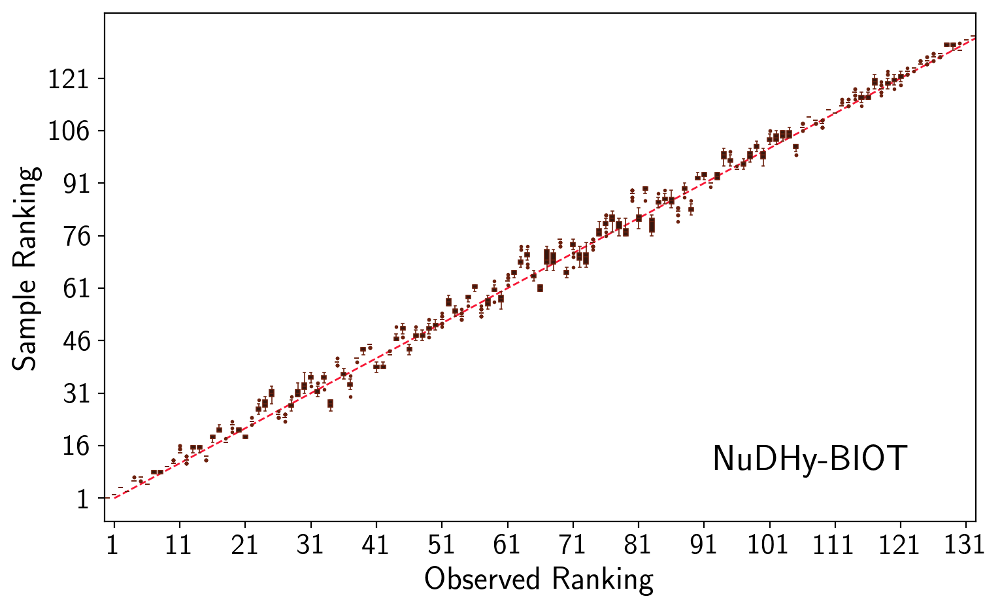

In [157]:
color1 = [colors[3], colors[4]]
linecolor1 = ['#0A585C', '#6C210E']

for idx, sam in enumerate(['NuDHy_A', 'NuDHy_C']):
    fig, ax = plt.subplots(figsize=(8, 5))

    data_obs = ranks[ranks['Sampler']==dname][['Country', 'Rank']]
    data_obs.columns = ['Country', 'Obs Rank']

    datas = ranks[ranks['Sampler']==sam].copy()
    datas = datas.merge(data_obs)
    
    ax.plot([1, datas['Rank'].max()], [1, datas['Rank'].max()], color='#F71735', 
            linewidth=1, linestyle='--')
    box = sns.boxplot(data=datas, x='Obs Rank', y='Rank', color=color1[idx], width=1,
                      gap=.3, linewidth=.6, fliersize=1, linecolor=linecolor1[idx])
    
    ax.set_xlabel('Observed Ranking')
    ax.set_xticks(np.arange(1, 134, 10), np.arange(1, 134, 10))
    ax.set_ylabel('Sample Ranking')
    ax.set_yticks(np.arange(1, 134, 15), np.arange(1, 134, 15))
    
    df1 = datas.groupby('Obs Rank')['Rank'].agg(Max='max', Min='min')
    avg_rank = datas.groupby(by=['Obs Rank', 'Country'])['Rank'].mean().reset_index()
    avg_rank['Abs Diff'] = (avg_rank['Rank'] - avg_rank['Obs Rank']).apply(abs)
    avg_rank['Diff'] = (avg_rank['Rank'] - avg_rank['Obs Rank'])
    top_diffs = avg_rank.sort_values(by='Abs Diff', ascending=False).head(4).set_index('Obs Rank')
    for i in df1.Max.index:
        if i in top_diffs.index and sam != 'NuDHy_C':
            if top_diffs.loc[i, 'Diff'] > 0:
                box.annotate(top_diffs.loc[i, 'Country'], xy=(i, df1.Max[i]+3), 
                             ha='center', color='#2A2828', rotation=90, fontsize=12)
            else:
                box.annotate(top_diffs.loc[i, 'Country'], xy=(i, df1.Min[i]-10), 
                             ha='center', color='#2A2828', rotation=90, fontsize=12)
    ax.spines['right'].set_visible(True)
    ax.spines['top'].set_visible(True)
    ax.text(0.7, 0.1, sampler_names.get(sam, sam), fontsize=20, transform=ax.transAxes)
    plt.savefig(f'{root}_fitness_rankings_box_{sam}.pdf', bbox_inches='tight')
    plt.tight_layout()
    plt.show()

In [158]:
output = rank_comp.copy()
output = output.groupby(by='Sampler').agg({'Spearman':['mean', 'std'],
                                           'Kendall-Tau': ['mean', 'std']})

In [159]:
print(output.T.to_latex(float_format="%.3f"))

\begin{tabular}{llrr}
\toprule
 & Sampler & NuDHy_A & NuDHy_C \\
\midrule
\multirow[t]{2}{*}{Spearman} & mean & 0.981 & 0.998 \\
 & std & 0.001 & 0.000 \\
\cline{1-4}
\multirow[t]{2}{*}{Kendall-Tau} & mean & 0.886 & 0.963 \\
 & std & 0.003 & 0.001 \\
\cline{1-4}
\bottomrule
\end{tabular}



# Affinity

In [21]:
met_path = results_path + 'affinity/'

## Congress Bills

In [22]:
root = 'congress_bills'

In [47]:
house = 'S'

In [48]:
start = 93
end = 108

In [49]:
class_map = {0: 'Democrats', #100
             1: 'Republicans', #200
             2: 'Independents', #328
             3: 'Conservatives', #112
             4: 'Unknown'}

In [50]:
palette_congress = ['#CC141A', #'Republicans'
                    '#0092CC', #'Democrats'
                    '#800080', #'Independents'
                    '#4B9933', #'Conservatives'
                   ]
bk_cols = ['#EE585D', '#33C5FF']

In [51]:
styles = ['-', '--']
markers = ['o', 'x']

Node Labels

In [52]:
vmap_per_congr = dict()
class_per_congr = dict()
num_v_per_class_per_congr = dict()

for congr in range(start, end+1):
    if congr < 100:
        congr_str = f'0{congr}'
    else:
        congr_str = f'{congr}'
    vmap_ = defaultdict(int)
    with open(f'{data_path}{root}_{house}_{congr_str}.tsv') as in_f:
        _, _ = read_as_directed_hyperedge_list(in_f, vmap_)
    vmap_per_congr[congr] = vmap_
    
    with open(f'{data_path}{root}_classes.tsv') as in_f:
        classes_ = read_classes(in_f, vmap_)
    class_per_congr[congr] = classes_
    num_v_per_class_ = np.zeros(5)
    for v, c in classes_.items():
        num_v_per_class_[c] += 1
    num_v_per_class_per_congr[congr] = num_v_per_class_

Congress Info

In [53]:
if house == 'S':
    congress_info = pd.read_csv(met_path + 'senate_congress_info.tsv', sep='\t')
else:
    congress_info = pd.read_csv(met_path + 'house_congress_info.tsv', sep='\t')
congress_info.set_index('Congress', inplace=True)

In [54]:
c_inf = congress_info.reset_index().set_index('Start')

Affinity per Congress

In [55]:
aff_per_congr = []
aff_obs_per_congr = []
for congr in congress_info.index:
    if congr < 100:
        congr_str = f'0{congr}'
    else:
        congr_str = f'{congr}'
    aff_samples_ = pd.read_csv(met_path + f"affinity_{root}_{house}_{congr_str}_samples.tsv", sep='\t')
    avg_aff_ = aff_samples_.groupby(by=['Sampler',
                                        'Class',
                                        'Hyperedge Size',
                                        'Alpha',
                                        'Type']).agg({'Affinity': 'mean'}).reset_index()
    aff_obs = pd.read_csv(met_path + f"affinity_{root}_{house}_{congr_str}.tsv", sep='\t')
    aff_obs_ = aff_obs.rename(columns={'Affinity': 'Aff'})
    aff_obs['Congress'] = congr
    aff_obs_per_congr.append(aff_obs)
    avg_aff_ = pd.merge(avg_aff_, aff_obs_, how='left', on=['Class', 'Hyperedge Size', 'Alpha', 'Type'])
    avg_aff_.fillna(0, inplace=True)
    avg_aff_['Affinity Ratio'] = avg_aff_['Aff'] / avg_aff_['Affinity']
    avg_aff_['Party'] = avg_aff_['Class'].apply(lambda x : class_map[x])
    avg_aff_ = avg_aff_[avg_aff_['Party'] != 'Unknown']
    avg_aff_['Congress'] = congr
    aff_per_congr.append(avg_aff_)
aff_per_congr = pd.concat(aff_per_congr)
aff_obs_per_congr = pd.concat(aff_obs_per_congr)

Homophily per Congress

In [56]:
homo_per_congr = []
homo_obs_per_congr = []
for congr in congress_info.index:
    if congr < 100:
        congr_str = f'0{congr}'
    else:
        congr_str = f'{congr}'
    homo_samples_ = pd.read_csv(met_path + f"homophily_{root}_{house}_{congr_str}_samples.tsv", sep='\t')
    homo_samples_ = homo_samples_.groupby(by=['Sampler',
                                              'Type']).agg({'Value': ['mean', 'std']}).reset_index()
    homo_samples_ = homo_samples_.droplevel(0, axis=1)
    homo_samples_.columns = ['Sampler', 'Type', 'Mean', 'STD']
    homo_obs = pd.read_csv(met_path + f"homophily_{root}_{house}_{congr_str}.tsv", sep='\t')
    homo_samples_ = pd.merge(homo_samples_, homo_obs, how='left', on=['Type'])
    homo_samples_.fillna(0, inplace=True)
    homo_obs['Congress'] = congr
    homo_obs_per_congr.append(homo_obs)
    homo_samples_['z-score'] = (homo_samples_['Value'] - homo_samples_['Mean']) / homo_samples_['STD']
    homo_samples_['Ratio'] = homo_samples_['Value'] / homo_samples_['Mean']
    homo_samples_['Party'] = homo_samples_['Type'].apply(lambda x : class_map[int(x[1])])
    homo_samples_ = homo_samples_[homo_samples_['Party'] != 'Unknown']
    homo_samples_['Congress'] = congr
    homo_per_congr.append(homo_samples_)
homo_per_congr = pd.concat(homo_per_congr)
homo_obs_per_congr = pd.concat(homo_obs_per_congr)

In [57]:
homo_per_congr = homo_per_congr[~homo_per_congr['Type'].isin(['M0-4', 'M1-4', 'M2-4', 'M3-4', 'M4-4'])]

In [58]:
homo_per_congr = homo_per_congr.fillna(0)

### Homophily

In [59]:
to_plot_vals = []
to_plot_ratio = []

for congr in homo_per_congr['Congress'].unique():
    homo_obs = homo_obs_per_congr[homo_obs_per_congr['Congress']==congr]
    for c in [0, 1]:
        y_v = homo_obs[homo_obs['Type']==f'M{c}-{c}']['Value'].values[0]
        if c == 0:
            den = congress_info.loc[congr, 'Num Dem. Bills']
        else:
            den = congress_info.loc[congr, 'Num Rep. Bills']
        to_plot_vals.append([y_v / den, class_map[c], 'Obs. Dataset', congr])

    for idx, sampler in enumerate(['NuDHy_A', 'NuDHy_C']):
        df = homo_per_congr[(homo_per_congr['Sampler']==sampler) &
                            (homo_per_congr['Congress']==congr)]
        for c in [0, 1]:
            y_v = df[df['Type']==f'M{c}-{c}']['Mean'].values[0]
            if c == 0:
                den = congress_info.loc[congr, 'Num Dem. Bills']
            else:
                den = congress_info.loc[congr, 'Num Rep. Bills']
            to_plot_vals.append([y_v / den, class_map[c], sampler, congr])

            y_v = df[df['Type']==f'M{c}-{c}']['Ratio'].values[0]
            to_plot_ratio.append([y_v, class_map[c], sampler, congr])

df_plot_vals = pd.DataFrame(to_plot_vals, columns=['Homophily', 'Party', 'Score', 'Congress'])
df_plot_ratio = pd.DataFrame(to_plot_ratio, columns=['Homophily', 'Party', 'Baseline Score', 'Congress'])

Homophily in Observed Hypergraph

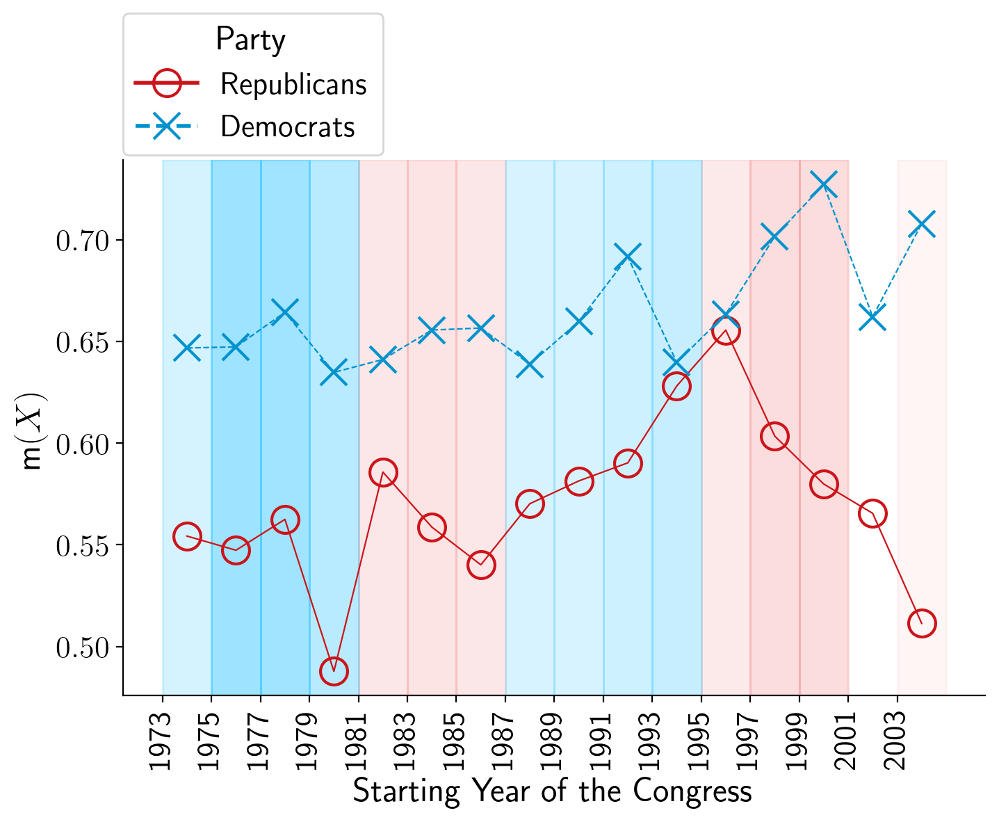

In [60]:
fig, ax = plt.subplots(figsize=(8,5))

data = df_plot_vals[df_plot_vals['Score']=='Obs. Dataset'].copy()
data['Starting Year'] = data['Congress'].apply(lambda x: congress_info.loc[x, 'Start']) + 1

for idx, party in enumerate(['Republicans', 'Democrats']):
    data_p = data[data['Party']==party]
    sns.lineplot(data=data_p, x='Starting Year', y='Homophily', color=palette_congress[idx], linewidth=.8,
                 linestyle=styles[idx], markeredgecolor=palette_congress[idx], label=party, ax=ax,
                 markersize=14, marker=markers[idx], markerfacecolor='none', markeredgewidth=1.5)
ax.set_xlabel('Starting Year of the Congress')
ax.set_ylabel(r'$\mathsf{m}(X)$')

leg = plt.legend(title='Party', loc=(0, 1.01), markerscale=1)
for i in leg.legend_handles:
    i.set_linewidth(2)

diffs = []
for c in c_inf.index:
    is_dem = c_inf.loc[c, 'Democrats'] >= c_inf.loc[c, 'Republicans']
    diff = np.abs(c_inf.loc[c, 'Democrats'] - c_inf.loc[c, 'Republicans']) / (c_inf.loc[c, 'Democrats'] + c_inf.loc[c, 'Republicans'])
    if is_dem:
        back = bk_cols[1]
    else:
        back = bk_cols[0]
    ax.axvspan(c, c+2, color=back, alpha=diff * 2)
    ax.set_xticks(c_inf.index, c_inf.index, rotation=90)
plt.savefig(f'congress_bills_obs_homophily_vary_congress_{house}.pdf', bbox_inches='tight')
plt.show()

Relative Values

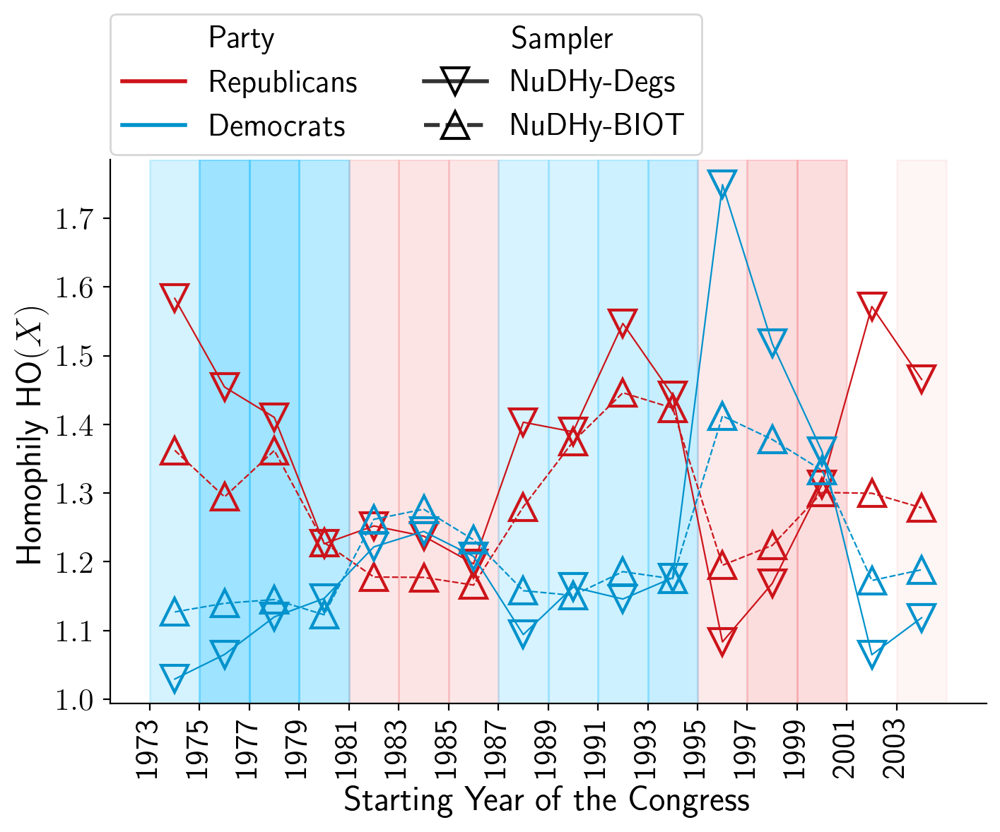

In [61]:
fig, ax = plt.subplots(figsize=(8,5))

data = df_plot_ratio.rename(columns={'Baseline Score': 'Sampler'})
data['Sampler'] = data['Sampler'].apply(lambda x: sampler_names.get(x, x))
data['Starting Year'] = data['Congress'].apply(lambda x: congress_info.loc[x, 'Start']) + 1

plot = sns.lineplot(data=data, x='Starting Year', y='Homophily',  
                     palette=palette_congress[:2], hue='Party', 
                     hue_order=['Republicans', 'Democrats'],
                     markersize=14, linewidth=.8,
                     markerfacecolor='none', ax=ax,
                     markeredgewidth=1.5, style='Sampler', markers=['v', '^'])

ax.set_xlabel('Starting Year of the Congress')
ax.set_ylabel(r'Homophily $\mathsf{HO}(X)$')

handles, labels = plot.get_legend_handles_labels()
for handle in handles:
    handle.set_markeredgecolor('black')
    handle.set_linewidth(2)
plot.legend(handles=handles, labels=labels, loc=(0, 1.01), markerscale=1, ncols=2)

for idx, line in enumerate(plot.lines):
    line.set_markeredgecolor(line.get_color())

for c in c_inf.index:
    is_dem = c_inf.loc[c, 'Democrats'] >= c_inf.loc[c, 'Republicans']
    diff = np.abs(c_inf.loc[c, 'Democrats'] - c_inf.loc[c, 'Republicans']) / (c_inf.loc[c, 'Democrats'] + c_inf.loc[c, 'Republicans'])
    if is_dem:
        back = bk_cols[1]
    else:
        back = bk_cols[0]
    ax.axvspan(c, c+2, color=back, alpha=diff*2)
    ax.set_xticks(c_inf.index, c_inf.index, rotation=90)
plt.savefig(f'congress_bills_homophily_vary_congress_{house}.pdf', bbox_inches='tight')

plt.show()

### Group Affinity

Baseline Score

In [119]:
def baseline_tail(x, numvxclass):
    # ways to choose alpha - 1 elements of class X
    if numvxclass[x[0]] == 0:
        return 0
    A = math.comb(int(numvxclass[x[0]] - 1), x[2] - 1)
    # ways to choose t - alpha - 1 elements of class different from X 
    # (we exclude the vertex in the head because we do not care about its class)
    B = 1
    if x[1] - x[2] - 1 > 0:
        B = math.comb(int(np.sum(numvxclass) - numvxclass[x[0]]), x[1] - x[2] - 1)
    # ways to choose t - 2 elements of any class
    # (we exclude the vertex in the head because we do not care about its class)
    C = math.comb(int(np.sum(numvxclass) - 1), x[1] - 2)
    return A * B / C

In [120]:
def baseline_head(x, numvxclass):
    # ways to choose 1 element of class X
    A = numvxclass[x[0]]
    # ways to choose 1 element of any class
    C = np.sum(numvxclass)
    return A / C

In [121]:
def baseline(x, numvxclass):
    if x[3] == 'head':
        return baseline_head(x, numvxclass)
    return baseline_tail(x, numvxclass)

In [122]:
aff_obs_per_congr['Veldt et al.'] = aff_obs_per_congr.apply(lambda x: baseline(x, num_v_per_class_per_congr[x[5]]), axis=1)
aff_obs_per_congr['Affinity Ratio'] = aff_obs_per_congr['Affinity'] / aff_obs_per_congr['Veldt et al.']
aff_obs_per_congr['Party'] = aff_obs_per_congr['Class'].apply(lambda x : class_map[x])

/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/4270147635.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  aff_obs_per_congr['Veldt et al.'] = aff_obs_per_congr.apply(lambda x: baseline(x, num_v_per_class_per_congr[x[5]]), axis=1)
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/2962548876.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if x[3] == 'head':
/var/folders/nb/fsgt9jgs34x6qd_dvlnbdw680000gn/T/ipykernel_86474/65399298.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (c

In [123]:
aff_obs_per_congr = aff_obs_per_congr[aff_obs_per_congr['Hyperedge Size'] > aff_obs_per_congr['Alpha']]
aff_per_congr = aff_per_congr[aff_per_congr['Hyperedge Size'] > aff_per_congr['Alpha']]

In [124]:
aff_obs_per_congr.fillna(0, inplace=True)

In [125]:
all_aff_per_congr = aff_per_congr[['Sampler', 
                                   'Class',
                                   'Hyperedge Size',
                                   'Alpha',
                                   'Type',
                                   'Affinity Ratio',
                                   'Party',
                                   'Congress']].copy()
all_aff_per_congr.rename(columns={'Sampler': 'Baseline Score'}, inplace=True)
tmp = aff_obs_per_congr[['Class', 
                         'Hyperedge Size', 
                         'Alpha', 
                         'Type', 
                         'Affinity Ratio',
                         'Party',
                         'Congress']].copy()
tmp['Baseline Score'] = 'Veldt et al.'
all_aff_per_congr = pd.concat([all_aff_per_congr, tmp])

In [126]:
all_aff_per_congr.sort_values(by=['Baseline Score'], inplace=True)

#### Head Affinity

#### Average Head Affinity

In [127]:
avg_aff_per_congress = all_aff_per_congr[all_aff_per_congr['Type']=='head'].copy()
avg_aff_per_congress = avg_aff_per_congress.groupby(by=['Baseline Score',
                                                        'Party',
                                                        'Congress'])[['Affinity Ratio']].mean()
avg_aff_per_congress = avg_aff_per_congress.reset_index()
avg_aff_per_congress = avg_aff_per_congress[avg_aff_per_congress['Party'].isin(['Democrats', 'Republicans'])]

In [128]:
avg_aff_per_congress['Starting Year'] = avg_aff_per_congress['Congress'].apply(lambda x: congress_info.loc[x, 'Start']) + 1

In [129]:
data1 = avg_aff_per_congress[avg_aff_per_congress['Baseline Score'].isin(['NuDHy_A', 'NuDHy_C'])].copy()
data2 = avg_aff_per_congress[~avg_aff_per_congress['Baseline Score'].isin(['NuDHy_A', 'NuDHy_C'])]

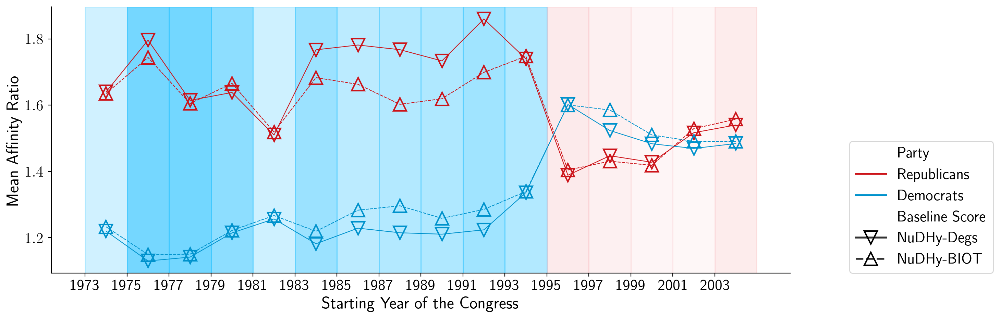

In [130]:
fig, ax = plt.subplots(figsize=(15, 5))

data1['Baseline Score'] = data1['Baseline Score'].apply(lambda x: sampler_names.get(x, x))

plot = sns.lineplot(data=data1, x='Starting Year', y='Affinity Ratio', 
                     palette=palette_congress[:2], hue='Party', 
                     hue_order=['Republicans', 'Democrats'], linewidth=.8,
                     markerfacecolor='none', markeredgewidth=1.5,
                     markersize=14, style='Baseline Score', markers=['v', '^'])

ax.set_ylabel('Mean Affinity Ratio')
ax.set_xlabel('Starting Year of the Congress')

handles, labels = plot.get_legend_handles_labels()
for handle in handles:
    handle.set_markeredgecolor('black')
    handle.set_linewidth(2)
plot.legend(handles=handles, labels=labels, loc=(1.08, 0), markerscale=1)

for idx, line in enumerate(plot.lines):
    line.set_markeredgecolor(line.get_color())

for c in c_inf.index:
    is_dem = c_inf.loc[c, 'Democrats'] >= c_inf.loc[c, 'Republicans']
    diff = np.abs(c_inf.loc[c, 'Democrats'] - c_inf.loc[c, 'Republicans']) / (c_inf.loc[c, 'Democrats'] + c_inf.loc[c, 'Republicans'])
    if is_dem:
        back = bk_cols[1]
    else:
        back = bk_cols[0]
    ax.axvspan(c, c+2, color=back, alpha=diff*2)
ax.set_xticks(c_inf.index, c_inf.index)
plt.tight_layout()
plt.savefig(f'congress_bills_head_affinity_nudhy_vary_congress_{house}.pdf', bbox_inches='tight')
plt.show()

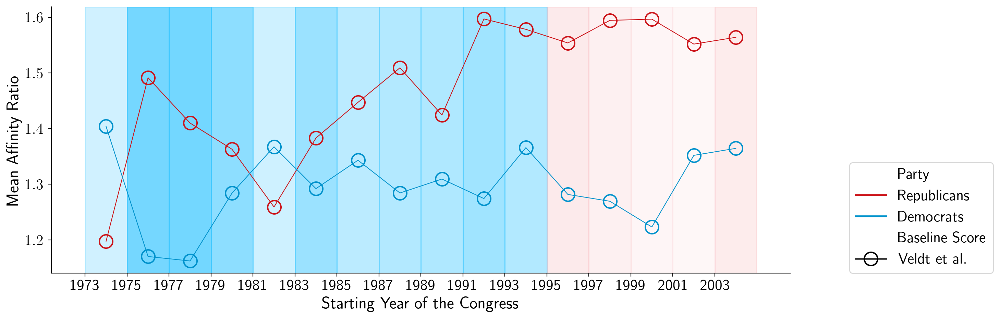

In [131]:
fig, ax = plt.subplots(figsize=(15, 5))

plot = sns.lineplot(data=data2, x='Starting Year', y='Affinity Ratio', 
                    palette=palette_congress[:2], hue='Party', 
                    hue_order=['Republicans', 'Democrats'], linewidth=.8,
                    markerfacecolor='none', markeredgewidth=1.5,
                    markersize=14, style='Baseline Score', markers=['o'])

ax.set_ylabel('Mean Affinity Ratio')
ax.set_xlabel('Starting Year of the Congress')

handles, labels = plot.get_legend_handles_labels()
for handle in handles:
    handle.set_markeredgecolor('black')
    handle.set_linewidth(2)
plot.legend(handles=handles, labels=labels, loc=(1.08, 0), markerscale=1)

for idx, line in enumerate(plot.lines):
    line.set_markeredgecolor(line.get_color())

for c in c_inf.index:
    is_dem = c_inf.loc[c, 'Democrats'] >= c_inf.loc[c, 'Republicans']
    diff = np.abs(c_inf.loc[c, 'Democrats'] - c_inf.loc[c, 'Republicans']) / (c_inf.loc[c, 'Democrats'] + c_inf.loc[c, 'Republicans'])
    if is_dem:
        back = bk_cols[1]
    else:
        back = bk_cols[0]
    ax.axvspan(c, c+2, color=back, alpha=diff*2)
ax.set_xticks(c_inf.index, c_inf.index)
plt.tight_layout()
plt.savefig(f'congress_bills_head_affinity_base_vary_congress_{house}.pdf', bbox_inches='tight')
plt.show()

#### Tail Affinity

#### Average Affinity

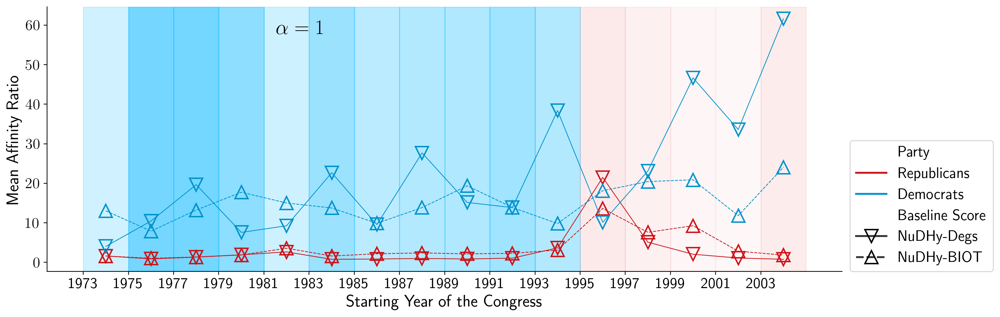

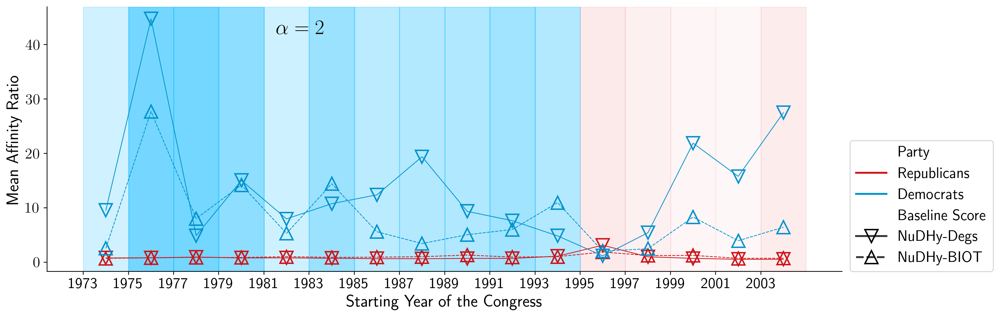

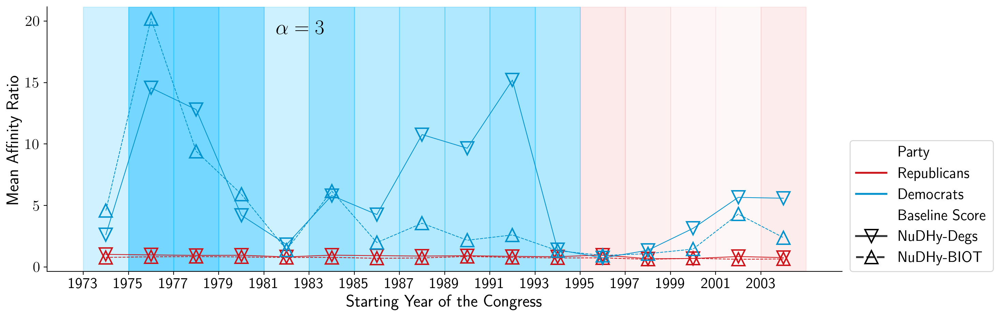

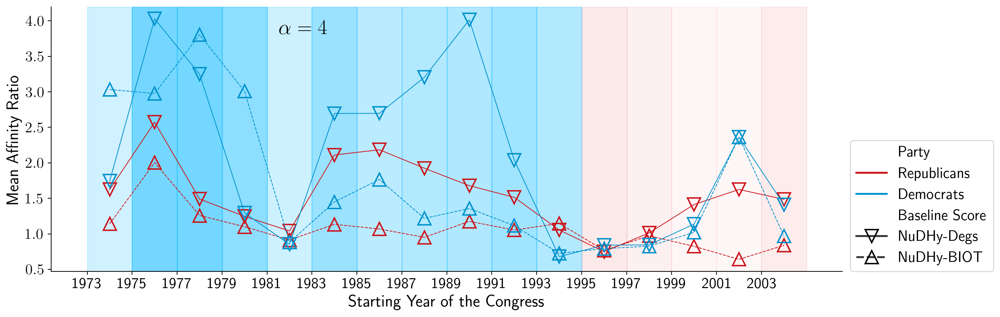

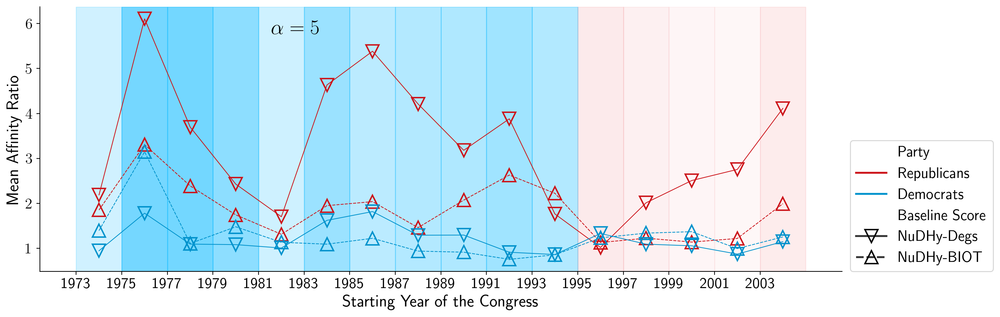

...

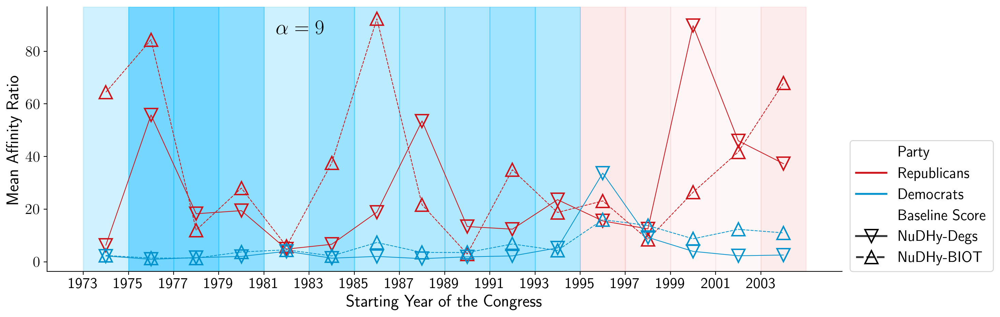

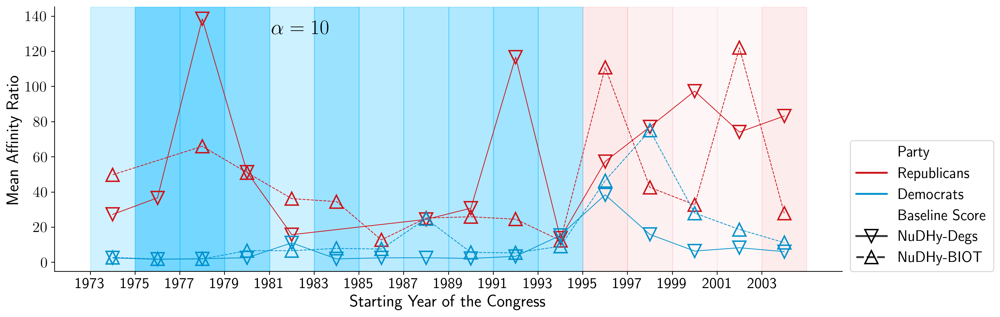

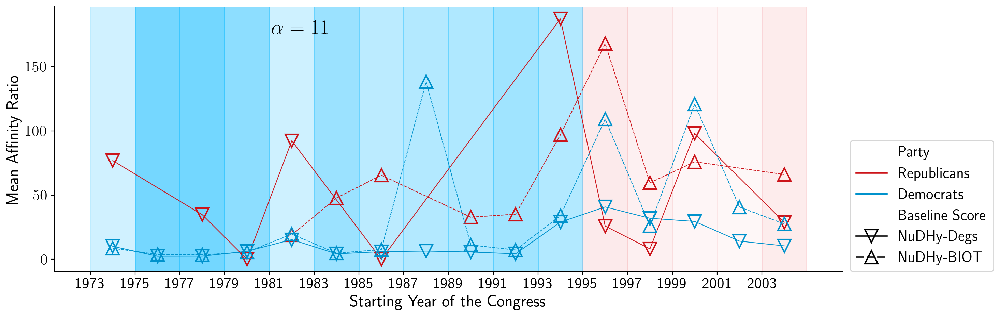

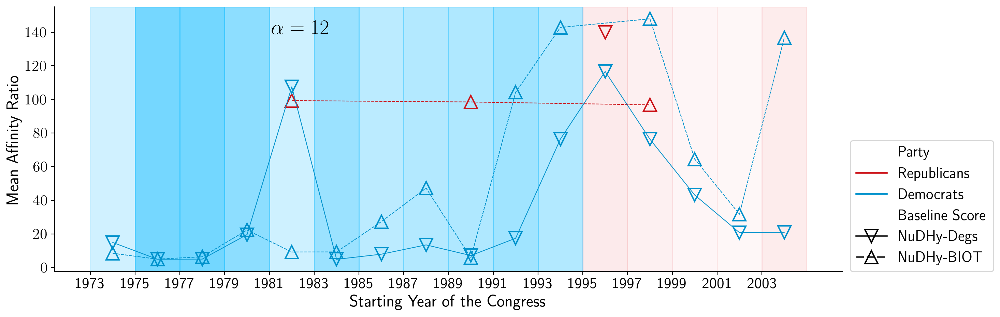

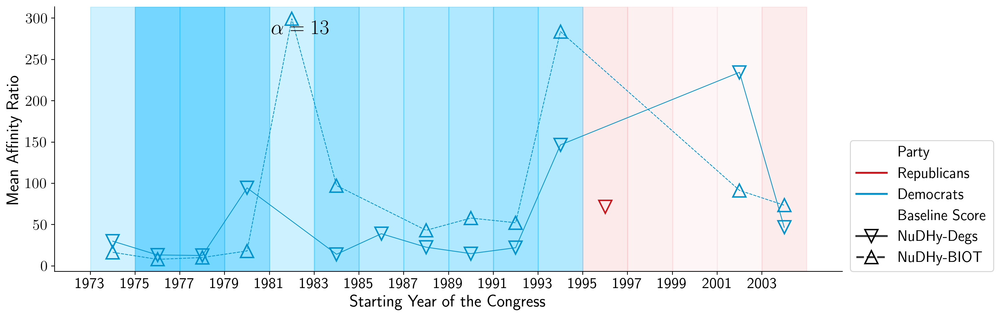

In [135]:
avg_aff_per_congress = all_aff_per_congr[all_aff_per_congr['Type']=='tail'].copy()
avg_aff_per_congress.replace([np.inf, -np.inf], np.nan, inplace=True)
avg_aff_per_congress = avg_aff_per_congress.dropna()
avg_aff_per_congress = avg_aff_per_congress.groupby(by=['Baseline Score',
                                                        'Alpha',
                                                        'Party',
                                                        'Congress'])[['Affinity Ratio']].mean()
avg_aff_per_congress = avg_aff_per_congress.reset_index()
avg_aff_per_congress = avg_aff_per_congress[(avg_aff_per_congress['Party'].isin(['Democrats', 'Republicans'])) &
                                            (avg_aff_per_congress['Baseline Score'].isin(['NuDHy_A', 'NuDHy_C']))]
avg_aff_per_congress['Starting Year'] = avg_aff_per_congress['Congress'].apply(lambda x: congress_info.loc[x, 'Start']) + 1
avg_aff_per_congress['Baseline Score'] = avg_aff_per_congress['Baseline Score'].apply(lambda x: sampler_names.get(x, x))

for alpha in avg_aff_per_congress['Alpha'].unique():

    data = avg_aff_per_congress[avg_aff_per_congress['Alpha']==alpha]
    
    fig, ax = plt.subplots(figsize=(15,5))

    plot = sns.lineplot(data=data, x='Starting Year', y='Affinity Ratio', 
                        palette=palette_congress[:2], hue='Party', 
                        hue_order=['Republicans', 'Democrats'], linewidth=.8,
                        markerfacecolor='none', markeredgewidth=1.5,
                        markersize=14, style='Baseline Score', markers=['v', '^'])
    
    for idx, line in enumerate(plot.lines):
        line.set_markeredgecolor(line.get_color())
        
    handles, labels = plot.get_legend_handles_labels()
    for handle in handles:
        handle.set_markeredgecolor('black')
        handle.set_linewidth(2)
        
    text = r'$\alpha={}$'.format(alpha)
    ax.text(0.35, .95, text, ha='right', va='top',
            transform=ax.transAxes, color='black', fontsize=22)
    ax.set_ylabel('Mean Affinity Ratio')
    ax.set_xlabel('Starting Year of the Congress')
    ax.legend(loc=(1.01, 0))

    for c in c_inf.index:
        is_dem = c_inf.loc[c, 'Democrats'] >= c_inf.loc[c, 'Republicans']
        diff = np.abs(c_inf.loc[c, 'Democrats'] - c_inf.loc[c, 'Republicans']) / (c_inf.loc[c, 'Democrats'] + c_inf.loc[c, 'Republicans'])
        if is_dem:
            back = bk_cols[1]
        else:
            back = bk_cols[0]
        ax.axvspan(c, c+2, color=back, alpha=diff*2)
    ax.set_xticks(c_inf.index, c_inf.index)
    plt.tight_layout()
#     plt.savefig(f'congress_bills_tail_affinity_vary_congress_alpha_{alpha}.pdf', bbox_inches='tight')
    plt.show()

## DBLP 

In [977]:
root = 'dblp_v9_rest'

In [978]:
vmap = defaultdict(int)
with open(f'{data_path}{root}.tsv') as in_f:
    heads, tails = read_as_directed_hyperedge_list(in_f, vmap)
    
with open(f'{data_path}{root}_classes.tsv') as in_f:
    classes = read_classes(in_f, vmap)

{'m': 0, 'unknown': 1, 'f': 2} 9604 1904247


In [979]:
num_v_per_class = np.zeros(5)
for v, c in classes.items():
    num_v_per_class[c] += 1

In [980]:
class_map = {0: 'Males',
             1: 'Unknown',
             2: 'Females'}

In [1029]:
palette_dblp = ["#E462A1", # females
                "#008AB8" #men
               ]

Data

In [1030]:
aff_samples = pd.read_csv(met_path + f"affinity_{root}_samples.tsv", sep='\t')
aff = pd.read_csv(met_path + f"affinity_{root}.tsv", sep='\t')

In [1031]:
avg_aff = aff_samples.groupby(by=['Sampler',
                                  'Class',
                                  'Hyperedge Size',
                                  'Alpha',
                                  'Beta',
                                  'Type']).agg({'Affinity': 'mean'}).reset_index()

In [1032]:
aff_ = aff.rename(columns={'Affinity': 'Aff'})
avg_aff = pd.merge(avg_aff, aff_, how='left', on=['Class', 'Hyperedge Size', 'Alpha', 'Beta', 'Type'])
avg_aff.dropna(inplace=True)

In [1033]:
avg_aff['Affinity Ratio'] = avg_aff['Aff'] / avg_aff['Affinity']
avg_aff['Gender'] = avg_aff['Class'].apply(lambda x : class_map[x])
aff['Gender'] = aff['Class'].apply(lambda x : class_map[x])

In [1034]:
avg_aff = avg_aff[avg_aff['Gender'] != 'Unknown']
aff = aff[aff['Gender'] != 'Unknown']

In [1035]:
avg_aff.fillna(0, inplace=True)

In [1036]:
avg_aff = avg_aff[avg_aff['Hyperedge Size'] > avg_aff['Beta']]
aff = aff[aff['Hyperedge Size'] > aff['Beta']]

Baseline

In [1037]:
def baseline_head(x):
    # x = [class=0, size=1, a=2, h_size=3]
    
    num_x = int(num_v_per_class[x[0]])
    n = int(np.sum(num_v_per_class))
    
    A = math.comb(num_x, x[2])
    B = math.comb(n - num_x, x[3]-x[2])
#     C = math.comb(n - 1, x[1]-x[3]-1)
    
    D = math.comb(n, x[3])
#     E = math.comb(n - 1, x[1]-x[3]-1)

#     return (A * B * C) / (D * E)
    return (A * B) / D

In [1038]:
def baseline_tail(x):
    # x = [class=0, size=1, a=2, h_size=3]
    num_x = int(num_v_per_class[x[0]])
    n = int(np.sum(num_v_per_class))
    
    A = math.comb(n - 1, x[3] - 1)
    B = math.comb(num_x, x[2])
    C = math.comb(n - num_x, x[1]-x[2]-x[3])
    
    D = math.comb(n - 1, x[3] - 1)
    E = math.comb(n, x[1]-x[3])

    return (A * B * C) / (D * E)

In [1039]:
def baseline(x):
    if x[4] == 'head':
        return baseline_head(x)
    return baseline_tail(x)

In [1040]:
aff['Veldt et al.'] = aff.apply(lambda x: baseline(x), axis=1)
aff['Affinity Ratio'] = aff['Affinity'] / aff['Veldt et al.']

In [1041]:
aff.fillna(0, inplace=True)

In [1042]:
all_aff = avg_aff[['Sampler', 
                   'Class',
                   'Hyperedge Size',
                   'Alpha',
                   'Beta',
                   'Type',
                   'Affinity Ratio',
                   'Gender']].copy()
all_aff.rename(columns={'Sampler': 'Baseline Score'}, inplace=True)
tmp = aff[['Class', 'Hyperedge Size', 
           'Alpha', 'Beta', 'Type', 'Affinity Ratio',
           'Gender']].copy()
tmp['Baseline Score'] = 'Veldt et al.'
all_aff = pd.concat([all_aff, tmp])

In [1043]:
all_aff['Combo'] = "(" + all_aff['Beta'].apply(str) + "," + all_aff['Alpha'].apply(str) + ")"
all_aff.sort_values(by=['Combo', 'Baseline Score'], inplace=True)

### Head Affinity

### Average Head Affinity

In [1044]:
avg_aff_per_gender = all_aff[all_aff['Type']=='head'].copy()
avg_aff_per_gender = avg_aff_per_gender.groupby(by=['Baseline Score',
                                                    'Alpha',
                                                    'Gender'])[['Affinity Ratio']].mean()
avg_aff_per_gender = avg_aff_per_gender.reset_index()

In [1045]:
avg_aff_per_gender = avg_aff_per_gender[avg_aff_per_gender['Affinity Ratio']>0]

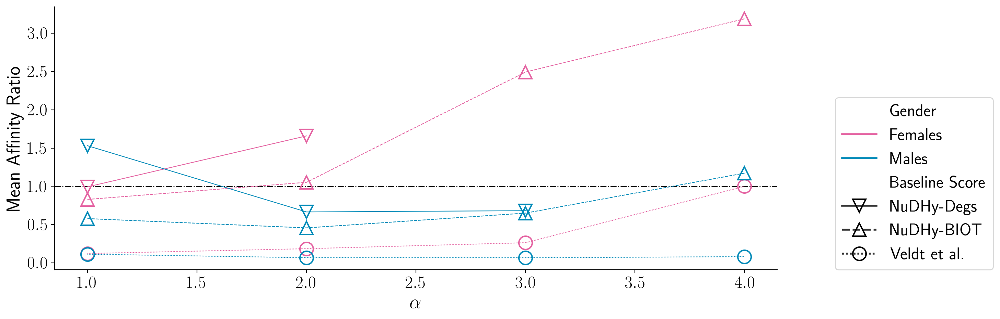

In [1046]:
fig, ax = plt.subplots(figsize=(15, 5))

ax.axhline(1, color='black', linewidth=1, linestyle='-.')

data = avg_aff_per_gender[avg_aff_per_gender['Alpha']<5].copy()
data['Baseline Score'] = data['Baseline Score'].apply(lambda x: sampler_names.get(x, x))
plot = sns.lineplot(data=data, x='Alpha', y='Affinity Ratio', markers=['v', '^', 'o'],
                    linewidth=.8, markerfacecolor='none', markeredgewidth=1.5,
                    markersize=14, palette=palette_dblp, hue_order=['Females', 'Males'],
                    hue='Gender', style='Baseline Score', ax=ax)

ax.set_xlabel(r'$\alpha$')
ax.set_ylabel('Mean Affinity Ratio')

handles, labels = plot.get_legend_handles_labels()
for handle in handles:
    handle.set_markeredgecolor('black')
    handle.set_linewidth(2)
plot.legend(handles=handles, labels=labels, loc=(1.08, 0), markerscale=1)

for idx, line in enumerate(plot.lines):
    line.set_markeredgecolor(line.get_color())

plt.tight_layout()
plt.savefig(f'{root}_head_affinity_size.pdf', bbox_inches='tight')
plt.show()

### Tail Affinity

### Average Tail Affinity

In [1047]:
avg_aff_per_gender = all_aff[all_aff['Type']=='tail'].copy()
avg_aff_per_gender = avg_aff_per_gender.groupby(by=['Baseline Score',
                                                    'Alpha',
                                                    'Gender'])[['Affinity Ratio']].mean()
avg_aff_per_gender = avg_aff_per_gender.reset_index()
avg_aff_per_gender = avg_aff_per_gender[avg_aff_per_gender['Affinity Ratio']>0]

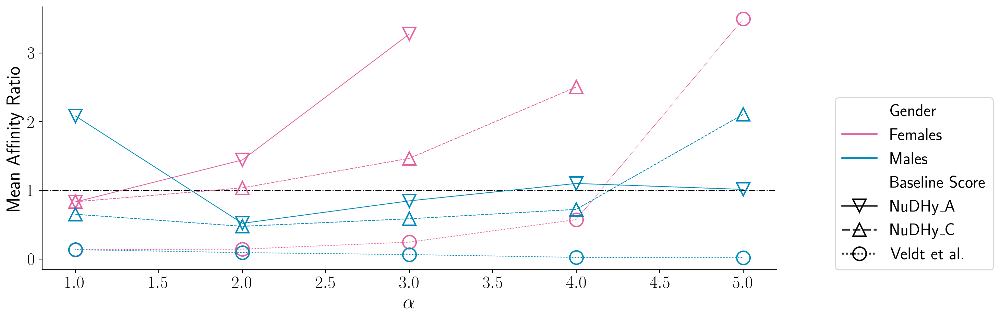

In [1048]:
fig, ax = plt.subplots(figsize=(15, 5))

ax.axhline(1, color='black', linewidth=1, linestyle='-.')

data = avg_aff_per_gender[avg_aff_per_gender['Alpha']<6]

plot = sns.lineplot(data=data, x='Alpha', y='Affinity Ratio', markers=['v', '^', 'o'],
                    linewidth=.8, markerfacecolor='none', markeredgewidth=1.5,
                    markersize=14, palette=palette_dblp, hue_order=['Females', 'Males'],
                    hue='Gender', style='Baseline Score', ax=ax)

handles, labels = plot.get_legend_handles_labels()
for handle in handles:
    handle.set_markeredgecolor('black')
    handle.set_linewidth(2)
plot.legend(handles=handles, labels=labels, loc=(1.08, 0), markerscale=1)

for idx, line in enumerate(plot.lines):
    line.set_markeredgecolor(line.get_color())

ax.set_xlabel(r'$\alpha$')
ax.set_ylabel('Mean Affinity Ratio')

plt.tight_layout()
plt.savefig(f'{root}_tail_affinity_size.pdf', bbox_inches='tight')
plt.show()

# Non-linear Contagion Processes

In [96]:
met_path = results_path + 'nl_contagion/'
root = 'lyon'
# root = 'high'
# root = 'email-Eu'
# root = 'email-Enron'

In [97]:
exps = {
    'lyon': [1, 4],
    'high' : [1, 4],
    'email-Eu': [1, 3],
    'email-Enron': [1, 3]
}

In [98]:
exp0 = exps[root][0]
exp1 = exps[root][1]

In [99]:
rho_0 = 0.01
dt = 10000
quasi = True

In [100]:
with open(data_path+f'{root}.tsv') as in_f:
    db_data = process_data_nl_contagion(in_f)

Style

In [101]:
samp_colors = ['#119DA4', '#3D1308']

In [102]:
sam_new_names = ['Degs', 'BIOT']

AME

In [103]:
f_lb_shape_inf = f'{root}_exp{exp0}_ame.pk'
f_ub_shape_inf = f'{root}_exp{exp1}_ame.pk'

In [104]:
with open(met_path+f_lb_shape_inf, 'rb') as in_f:
    lb_shape_inf = pickle.load(in_f)
with open(met_path+f_ub_shape_inf, 'rb') as in_f:
    ub_shape_inf = pickle.load(in_f)

In [105]:
ames = [lb_shape_inf, ub_shape_inf]

Simulation Data

OBSERVED

In [106]:
obs_r = pd.read_csv(met_path+f'rhos_{root}_dt{dt}_q{quasi}.tsv', sep='\t')
obs_marg = pd.read_csv(met_path+f'I_prob_{root}_dt{dt}_q{quasi}.tsv', sep='\t')

In [107]:
mean_obs = obs_r.groupby(by=['Lambda',
                             'Shape Infection',
                             'Initial Density Infected',
                             'Quasi']).agg({'Num Infected': ['mean', 'std']}).reset_index()

In [108]:
mean_obs.columns.droplevel(0)
mean_obs.columns = ['Lambda', 'Shape Infection', 'Initial Density Infected',
                    'Quasi', 'Mean Num Infected', 'STD Num Infected']

SAMPLES

In [109]:
samples_r = pd.read_csv(met_path+f'rhos_{root}_samples_nudhy_dt{dt}_q{quasi}.tsv', sep='\t')
samples_marg = pd.read_csv(met_path+f'I_prob_{root}_samples_nudhy_dt{dt}_q{quasi}.tsv', sep='\t')

In [110]:
mean_samp = samples_r.groupby(by=['Lambda',
                                  'Shape Infection',
                                  'Initial Density Infected',
                                  'Sampler',
                                  'Quasi']).agg({'Num Infected': ['mean', 'std']}).reset_index()
mean_samp.columns.droplevel(0)
mean_samp.columns = ['Lambda', 'Shape Infection', 'Initial Density Infected',
                     'Sampler', 'Quasi', 'Mean Num Infected', 'STD Num Infected']

## Simulations in Observed Data

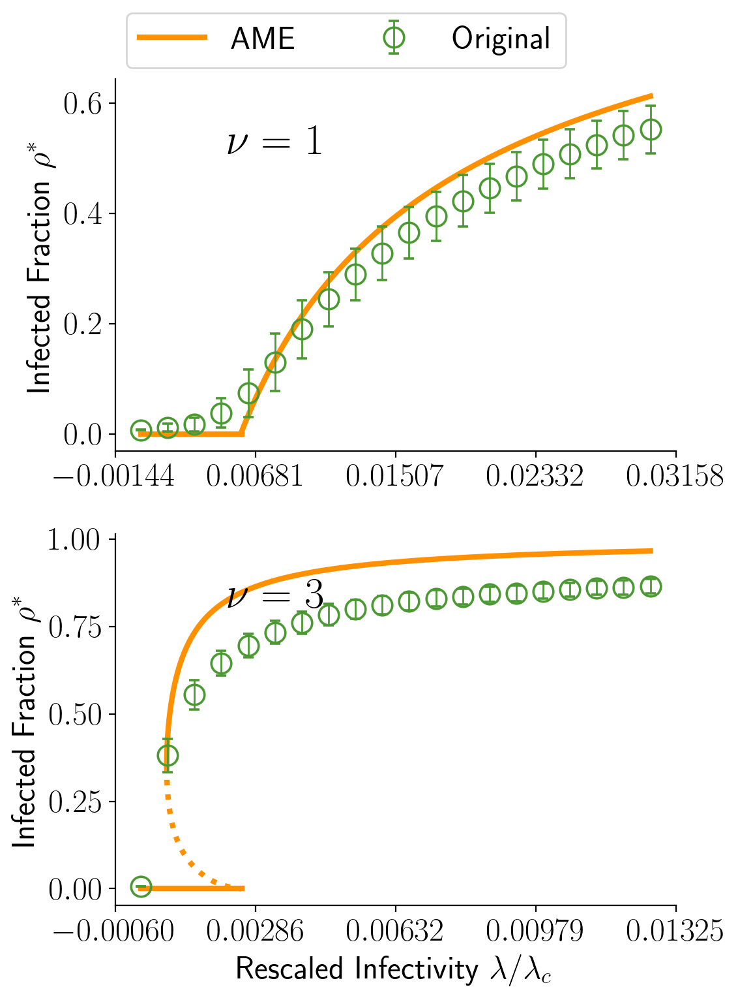

In [44]:
fig, ax = plt.subplots(2, 1, figsize=(6,8))

for idx, exp in enumerate([exp0, exp1]):

    ame = ames[idx]
    
    ax[idx].plot(ame['param_list_upper'], ame['I_list_upper'], 
                 linewidth=3, color='#FF9000', label='AME')
    ax[idx].plot(ame['param_list_lower'], ame['I_list_lower'], 
                 linewidth=3, color='#FF9000')
    if 'param_list_unstable' in ame:
        ax[idx].plot(ame['param_list_unstable'], ame['I_list_unstable'], 
                     linewidth=3, linestyle=':', color='#FF9000')
        
    dat = mean_obs[(mean_obs['Shape Infection']==exp) &
                   (mean_obs['Initial Density Infected']==rho_0) &
                   (mean_obs['Quasi']==quasi)]

    ax[idx].errorbar(dat['Lambda'], dat['Mean Num Infected'], dat['STD Num Infected'],
                marker='o', color='#4B9933', linewidth=0, markersize=11,
                markeredgecolor='#4B9933', markeredgewidth=1.3, markerfacecolor='none',
                capsize=3, elinewidth=1, label='Original')

    ax[idx].set_ylabel(r'Infected Fraction $\rho^*$', fontsize=18)
    if idx == 0:
        ax[idx].set_xlabel('')
    else:
        ax[idx].set_xlabel(r'Rescaled Infectivity $\lambda/\lambda_c$', fontsize=18)
#     ax[idx].text(0.1, 0.8, r'$\nu={}$'.format(exp), fontsize=24, transform=ax[idx].transAxes)
    ax[idx].text(0.2, 0.8, r'$\nu={}$'.format(exp), fontsize=24, transform=ax[idx].transAxes)
    if idx == 0:
        ax[idx].legend(loc=(0.02, 1.03), markerscale=1, ncol=2)
    else:
        ax[idx].legend().remove()
    start, stop = ax[idx].get_xlim()
    ticks = np.linspace(start, stop, 5)
    ax[idx].set_xticks(ticks)

plt.tight_layout()
# plt.savefig(f'nl_contagion_{root}.pdf', bbox_inches='tight')
plt.show()

## Simulation in NUDHY Samples

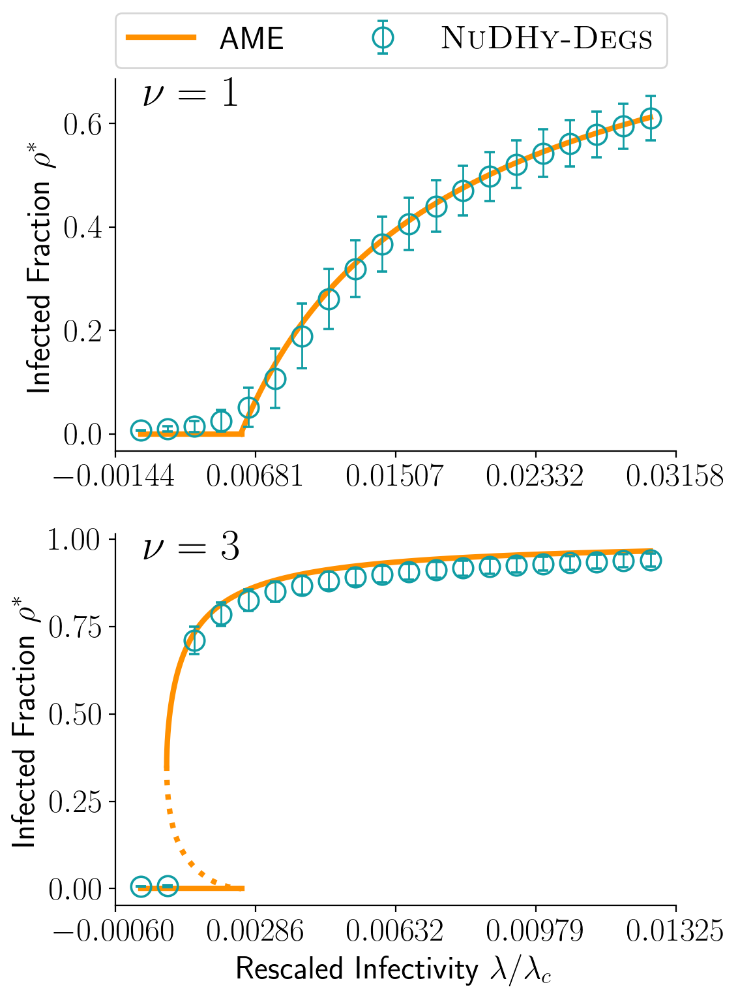

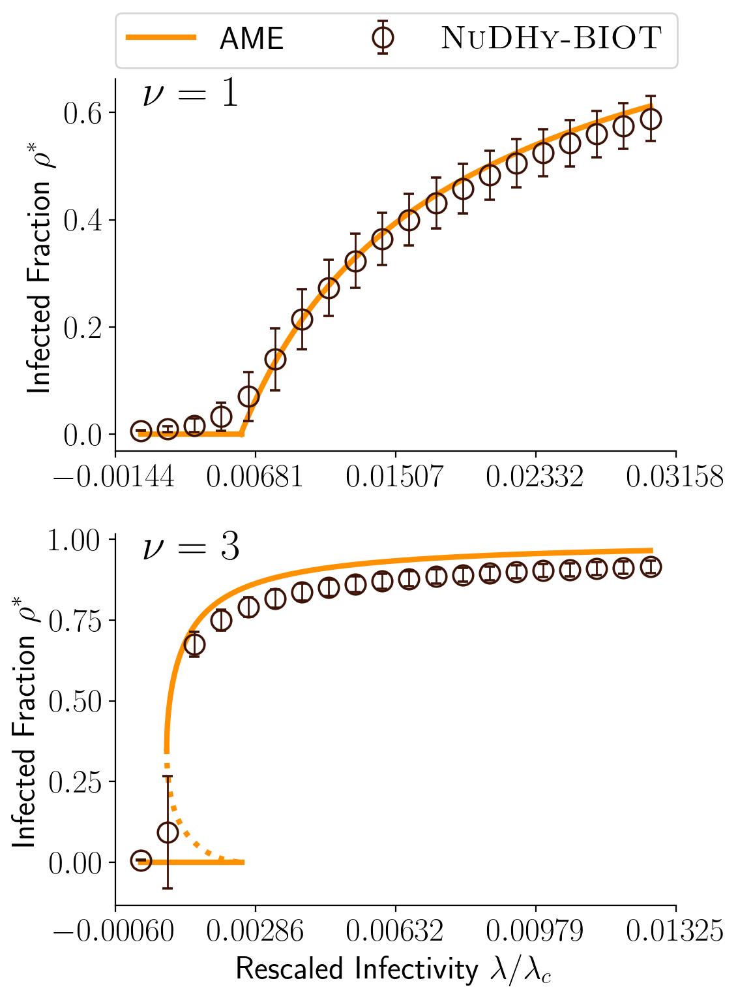

In [110]:
for ids, sampler in enumerate(['A', 'C']):
    
    fig, ax = plt.subplots(2, 1, figsize=(6,8))

    for idx, exp in enumerate([exp0, exp1]):

        ame = ames[idx]

        ax[idx].plot(ame['param_list_upper'], ame['I_list_upper'], 
                     linewidth=3, color='#FF9000', label='AME')
        ax[idx].plot(ame['param_list_lower'], ame['I_list_lower'], 
                     linewidth=3, color='#FF9000')
        if 'param_list_unstable' in ame:
            ax[idx].plot(ame['param_list_unstable'], ame['I_list_unstable'], 
                         linewidth=3, linestyle=':', color='#FF9000')

        name2 = r'\textsc{' + sampler_names.get(f'NuDHy_{sampler}') + '}'

        data2 = mean_samp[(mean_samp['Shape Infection']==exp) &
                          (mean_samp['Initial Density Infected']==rho_0) &
                          (mean_samp['Quasi']==quasi) &
                          (mean_samp['Sampler'].isin([f'NuDHy_{sampler}', 
                                                      f'NuDHy_{sam_new_names[ids]}']))]

        ax[idx].errorbar(data2['Lambda'], data2['Mean Num Infected'], data2['STD Num Infected'],
                marker='o', color=samp_colors[ids], linewidth=0, markersize=11,
                markeredgecolor=samp_colors[ids], markeredgewidth=1.3, markerfacecolor='none',
                capsize=3, elinewidth=1, label=name2)

        ax[idx].set_ylabel(r'Infected Fraction $\rho^*$', fontsize=18)
        if idx == 0:
            ax[idx].set_xlabel('')
        else:
            ax[idx].set_xlabel(r'Rescaled Infectivity $\lambda/\lambda_c$', fontsize=18)
    #     ax[idx].text(0.05, 0.8, r'$\nu={}$'.format(exp), fontsize=24, transform=ax[idx].transAxes)
        ax[idx].text(0.05, 0.93, r'$\nu={}$'.format(exp), fontsize=24, transform=ax[idx].transAxes)
        if idx == 0:
            ax[idx].legend(loc=(-0.0, 1.03), markerscale=1, ncol=2)
        else:
            ax[idx].legend().remove()
        start, stop = ax[idx].get_xlim()
        ticks = np.linspace(start, stop, 5)
        ax[idx].set_xticks(ticks)

    plt.tight_layout()
    # plt.savefig(f'nl_contagion_{root}_{sampler}.pdf', bbox_inches='tight')
    plt.show()

## Single Plot

In [111]:
ame_c = '#AFB3D4'
or_c = '#44BBA4'
na_cs = ['#3B28CC', '#96031A']

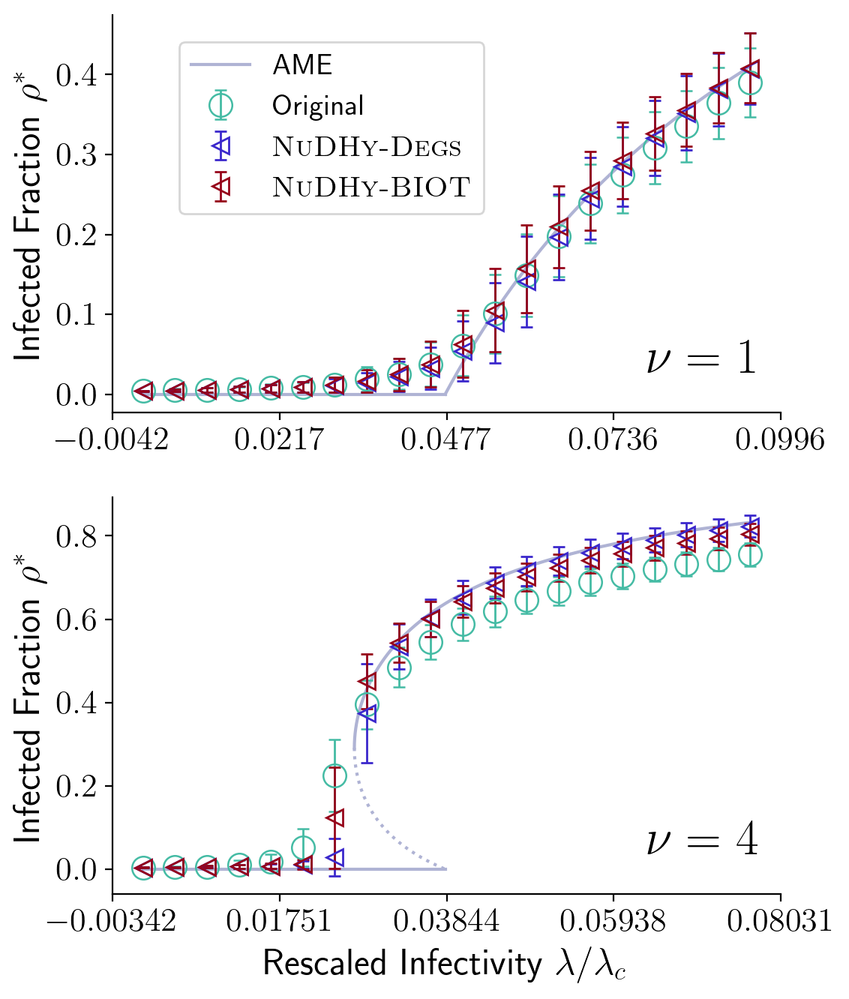

In [112]:
fig, ax = plt.subplots(2, 1, figsize=(6,7))

for idx, exp in enumerate([exp0, exp1]):

    ame = ames[idx]
    
    ax[idx].plot(ame['param_list_upper'], ame['I_list_upper'], 
                 linewidth=1.5, color=ame_c, label='AME')
    ax[idx].plot(ame['param_list_lower'], ame['I_list_lower'], 
                 linewidth=1.5, color=ame_c)
    if 'param_list_unstable' in ame:
        ax[idx].plot(ame['param_list_unstable'], ame['I_list_unstable'], 
                     linewidth=1.5, linestyle=':', color=ame_c)
        
    if len(mean_obs['Quasi'].unique()) == 1:

        dat = mean_obs[(mean_obs['Shape Infection']==exp) &
                       (mean_obs['Initial Density Infected']==rho_0)]

        ax[idx].errorbar(dat['Lambda'], dat['Mean Num Infected'], dat['STD Num Infected'],
                    marker='o', color=or_c, linewidth=0, markersize=11,
                    markeredgecolor=or_c, markeredgewidth=.9, markerfacecolor='none',
                    capsize=3, elinewidth=1, label='Original')
    else:
        
        dat = mean_obs[(mean_obs['Shape Infection']==exp) &
                       (mean_obs['Initial Density Infected']==rho_0) &
                       (mean_obs['Quasi']==True) & 
                       (mean_obs['Lambda'] >= min(ame['param_list_upper']))]

        ax[idx].errorbar(dat['Lambda'], dat['Mean Num Infected'], dat['STD Num Infected'],
                    marker='o', color=or_c, linewidth=0, markersize=11,
                    markeredgecolor=or_c, markeredgewidth=.9, markerfacecolor='none',
                    capsize=3, elinewidth=1)
                
        dat = mean_obs[(mean_obs['Shape Infection']==exp) &
                       (mean_obs['Initial Density Infected']==rho_0) &
                       (mean_obs['Quasi']==False) & 
                       (mean_obs['Lambda'] <= max(ame['param_list_lower']))]

        ax[idx].errorbar(dat['Lambda'], dat['Mean Num Infected'], dat['STD Num Infected'],
                    marker='o', color=or_c, linewidth=0, markersize=11,
                    markeredgecolor=or_c, markeredgewidth=.9, markerfacecolor='none',
                    capsize=3, elinewidth=1, label='Original')
    
    # NUDHY
    for ids, sam in enumerate(['A', 'C']):
        
        name2 = r'\textsc{' + sampler_names.get(f'NuDHy_{sam}') + '}'
    
        if len(mean_samp['Quasi'].unique()) == 1:

            data2 = mean_samp[(mean_samp['Shape Infection']==exp) &
                              (mean_samp['Initial Density Infected']==rho_0) &
                              (mean_samp['Sampler'].isin([f'NuDHy_{sam}', 
                                                          f'NuDHy_{sam_new_names[ids]}']))]

            ax[idx].errorbar(data2['Lambda'], data2['Mean Num Infected'], data2['STD Num Infected'],
                             marker='<', color=na_cs[ids], linewidth=0, markersize=8,
                             markeredgecolor=na_cs[ids], markeredgewidth=1, markerfacecolor='none',
                             capsize=3, elinewidth=1, label=name2)
        else:

            data2 = mean_samp[(mean_samp['Shape Infection']==exp) &
                              (mean_samp['Initial Density Infected']==rho_0) &
                              (mean_samp['Quasi']==True) &
                              (mean_samp['Lambda'] >= min(ame['param_list_upper'])) &
                              (mean_samp['Sampler'].isin([f'NuDHy_{sam}', 
                                                          f'NuDHy_{sam_new_names[ids]}']))]

            ax[idx].errorbar(data2['Lambda'], data2['Mean Num Infected'], data2['STD Num Infected'],
                             marker='<', color=na_cs[ids], linewidth=0, markersize=8,
                             markeredgecolor=na_cs[ids], markeredgewidth=1, markerfacecolor='none',
                             capsize=3, elinewidth=1, label=name2)

            data2 = mean_samp[(mean_samp['Shape Infection']==exp) &
                              (mean_samp['Initial Density Infected']==rho_0) &
                              (mean_samp['Quasi']==False) &
                              (mean_samp['Lambda'] <= max(ame['param_list_lower'])) &
                              (mean_samp['Sampler'].isin([f'NuDHy_{sam}', 
                                                          f'NuDHy_{sam_new_names[ids]}']))]

            ax[idx].errorbar(data2['Lambda'], data2['Mean Num Infected'], data2['STD Num Infected'],
                             marker='<', color=na_cs[ids], linewidth=0, markersize=8,
                             markeredgecolor=na_cs[ids], markeredgewidth=1, markerfacecolor='none',
                             capsize=3, elinewidth=1)
    
    ax[idx].set_ylabel(r'Infected Fraction $\rho^*$', fontsize=18)
    if idx == 0:
        ax[idx].set_xlabel('')
    else:
        ax[idx].set_xlabel(r'Rescaled Infectivity $\lambda/\lambda_c$', fontsize=18)
    ax[idx].text(0.8, 0.1, r'$\nu={}$'.format(exp), fontsize=24, transform=ax[idx].transAxes)
    if idx == 0:
#         ax[idx].legend().remove()
        ax[idx].legend(loc=(0.1, 0.5), markerscale=1, ncol=1, fontsize=14)
    else:
        ax[idx].legend().remove()
#         ax[idx].legend(loc=(0.3, 0.2), markerscale=1, ncol=1, fontsize=14)
    start, stop = ax[idx].get_xlim()
    ticks = np.linspace(start, stop, 5)
    ax[idx].set_xticks(ticks)

plt.tight_layout()
plt.savefig(f'nl_contagion_{root}_all.pdf', bbox_inches='tight')
plt.show()

## Marginal Infection Probability

In [24]:
num_nodes = len(db_data['adj_dict'])

In [32]:
# sam_order = ['NuDHy_A', 'NuDHy_C']
sam_order = ['NuDHy_Degs', 'NuDHy_BIOT']
or_c = '#44BBA4'
na_cs = ['#3B28CC', '#96031A']

In [33]:
prod = int(len(obs_marg) / num_nodes)
obs_marg['Node Id'] = np.array([np.arange(num_nodes)] * prod).flatten()

In [34]:
prod_s = int(len(samples_marg) / num_nodes)
samples_marg['Node Id'] = np.array([np.arange(num_nodes)] * prod_s).flatten()

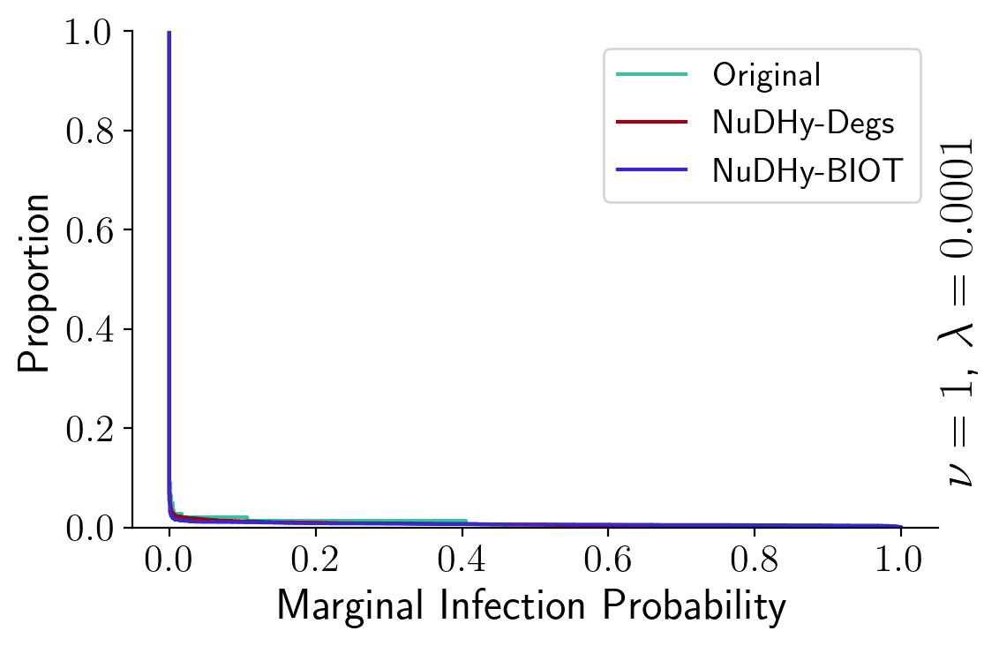

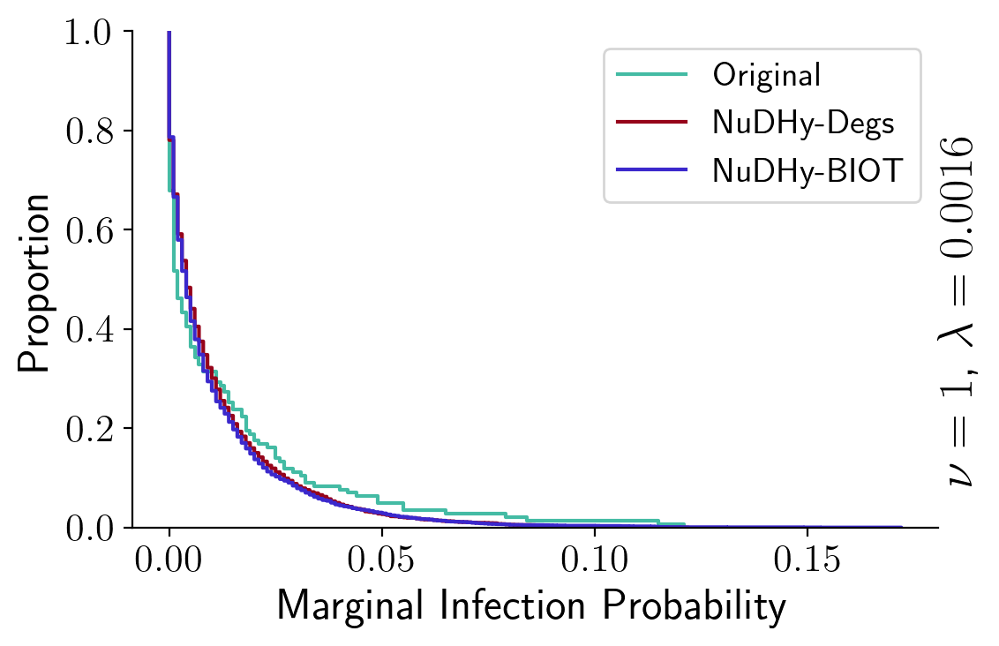

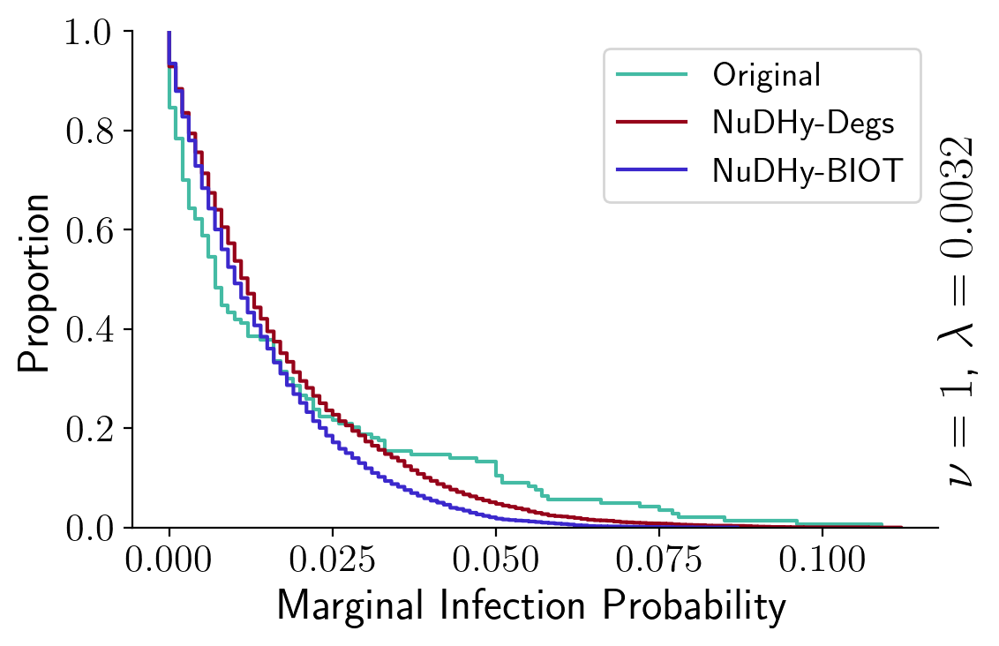

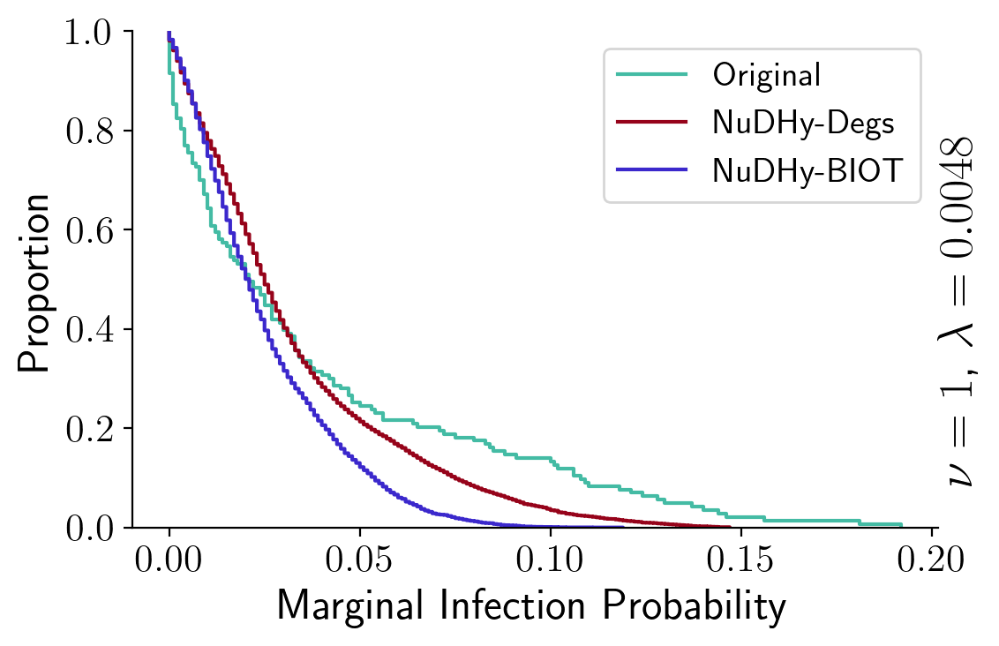

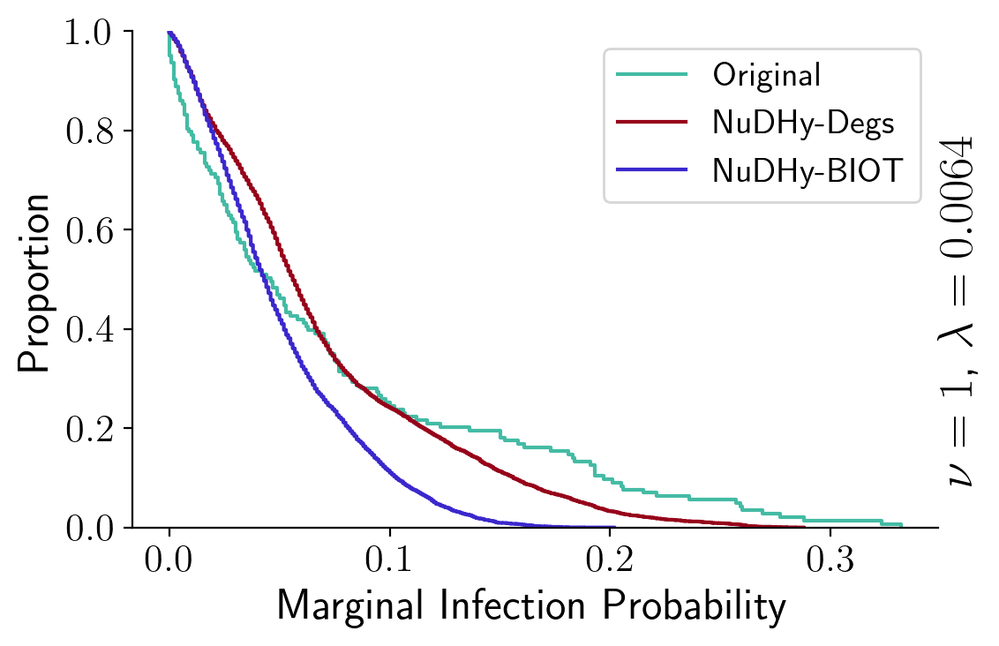

...

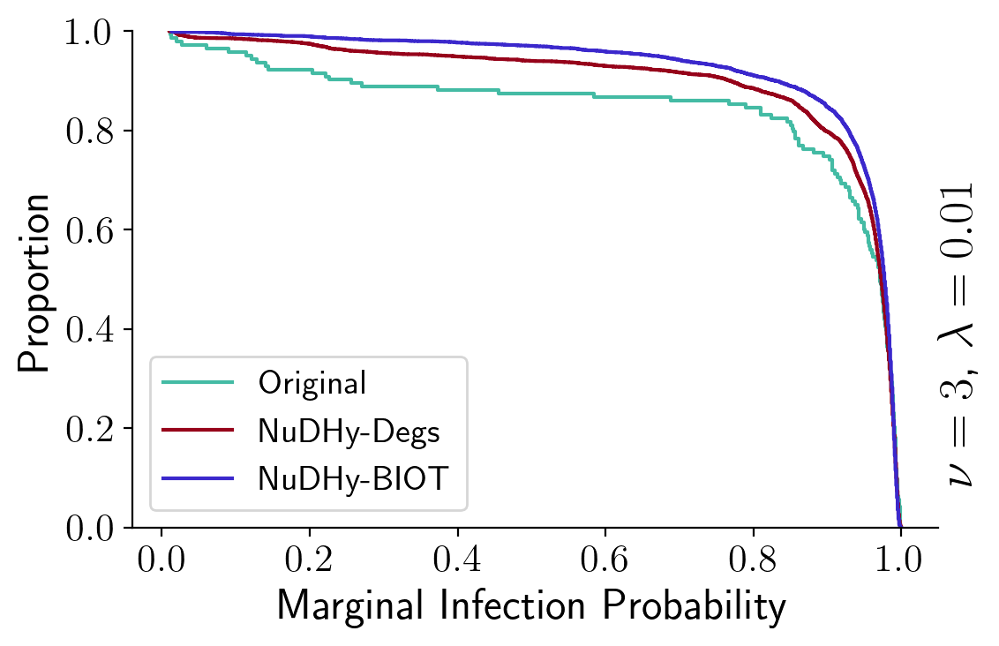

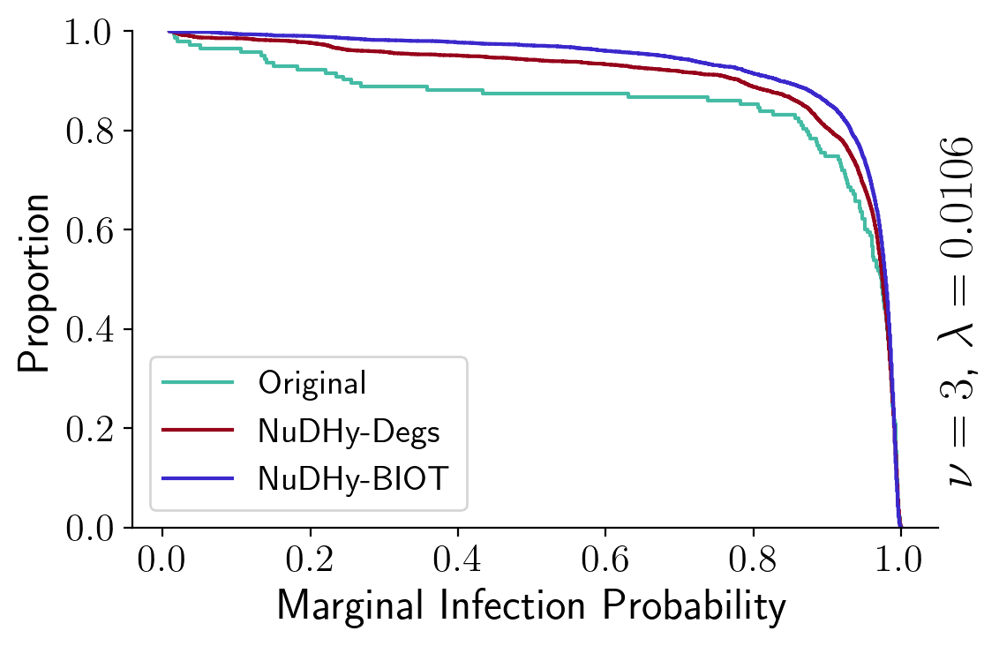

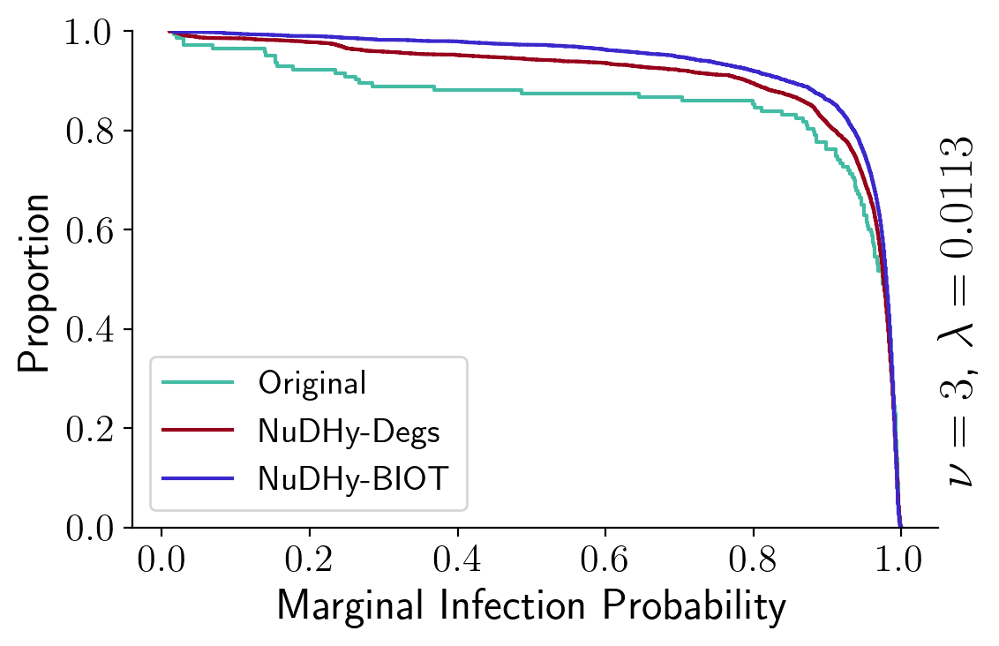

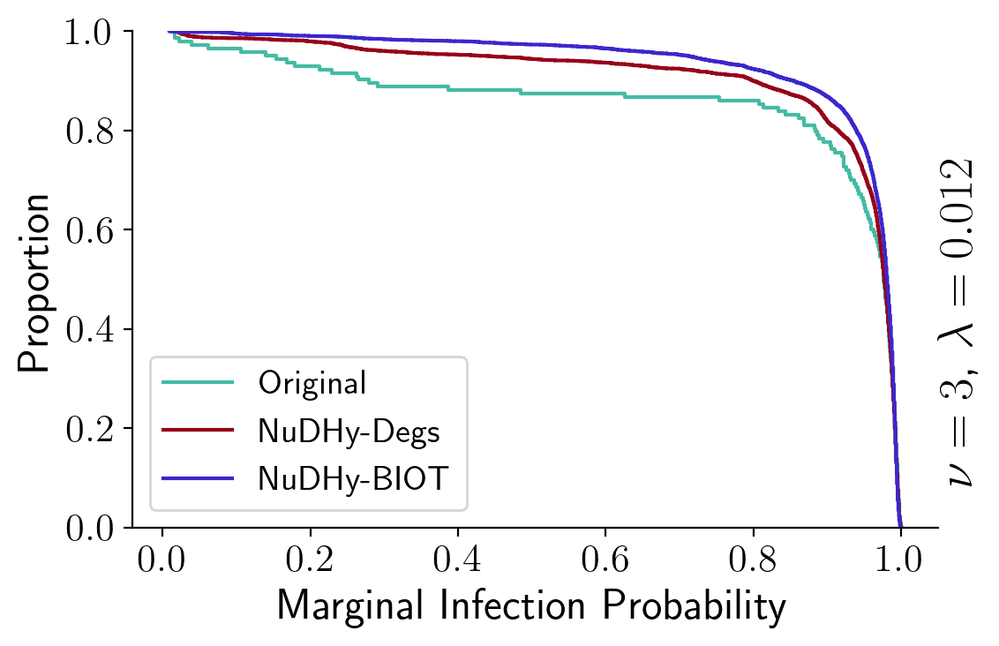

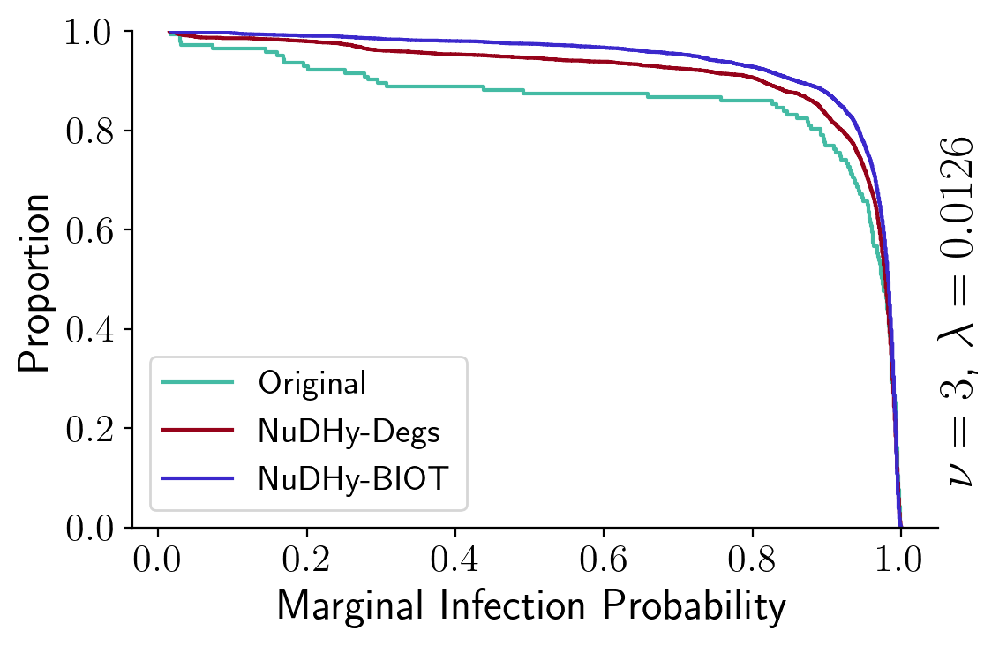

In [37]:
for idx, exp in enumerate([exp0, exp1]):
    
    dat = samples_marg[(samples_marg['Shape Infection']==exp) &
                       (samples_marg['Initial Density Infected']==rho_0)]
    
    for lmbd in dat['Lambda'].unique():
        
        dat2 = dat[(dat['Lambda']==lmbd)]

        dat3 = obs_marg[(obs_marg['Shape Infection']==exp) &
                        (obs_marg['Initial Density Infected']==rho_0) &
                        (obs_marg['Lambda']==lmbd)]
        
        weights = np.ones(len(dat2)) / len(samples_marg['Sample Id'].unique())
        
        fig, ax = plt.subplots(figsize=(6,4))
        
        sns.ecdfplot(data=dat3, x='Marginal Infection Prob', color=or_c,
                     stat='proportion', complementary=True, label='Original', ax=ax)
        
        sns.ecdfplot(data=dat2, x='Marginal Infection Prob', weights=weights,
                     palette=sns.color_palette(na_cs), ax=ax, stat='proportion',
                     hue='Sampler', complementary=True, hue_order=sam_order)
        
        legend = ax.get_legend()
        handles = legend.legend_handles
        labels = ['Original']
        labels.extend([sampler_names.get(text.get_text()) for text in legend.get_texts()])

#         ax.set_ylabel('Count', fontsize=18)
        ax.set_xlabel('Marginal Infection Probability', fontsize=18)
        ax.text(1, 0.1, r'$\nu={}$'.format(exp) + ',\t' + r'$\lambda={}$'.format(round(lmbd, 4)), 
                fontsize=20, transform=ax.transAxes, rotation=90)
        ax.legend(labels=labels, fontsize=14)

        plt.tight_layout()
#         plt.savefig(f'nl_contagion_{root}_marginal_{lmbd}.pdf', bbox_inches='tight')
        plt.show()

# Running Times

In [9]:
log_path = results_path + 'scalability/'

Settings

In [10]:
dbs = ['dblp_v9', 'eco01100', 'metabolic_iaf1260b', 'enron', 'dblp_v9_rest',
       'uspto19762016', 'citation_software', 'metabolic_ijo1366', 'qna_math']
dbs_dom = {
    'dblp_v9': 'Co-authorship',
    'eco01100': 'Biological',
    'metabolic_iaf1260b': 'Biological',
    'enron': 'Email', 
    'dblp_v9_rest': 'Co-authorship',
    'uspto19762016': 'Biological', 
    'citation_software': 'Co-authorship', 
    'metabolic_ijo1366': 'Biological',
    'qna_math': 'Q\&A'
}

Dataset Info

In [11]:
num_vs = dict()
max_sizes = dict()

In [12]:
for db in dbs:
    # read original hypergraph
    with open(data_path+db+'.tsv') as in_f:
        heads, tails = read_as_directed_hyperedge_list(in_f, dict())
    max_size = max([len(heads[idx])+len(tails[idx]) for idx in range(len(heads))])
    vertices = set()
    for h in heads:
        vertices.update(h)
    for t in tails:
        vertices.update(t)
    num_vs[db] = len(vertices)
    max_sizes[db] = max_size

## ReDi

In [13]:
def parse_log_redi(f, name):
    rows = []
    with open(log_path+f) as in_f:
        dataset = None
        curr_dict = dict()
        for line in in_f.readlines():
            if line.startswith('../data'):
                if len(curr_dict) > 0:
                    for k,v in curr_dict.items():
                        rows.append([dataset, k, v, name])
                    curr_dict = dict()
                dataset = line.split('/')[-1].strip()
            elif line.startswith('start') or line.startswith('sample'):
                lst = line.split(' ')
                time = int(lst[3].strip())
                ssid = int(lst[-1].strip())
                if ssid not in curr_dict:
                    curr_dict[ssid] = time
                else:
                    curr_dict[ssid] = np.abs(curr_dict[ssid] - time) / 1000000.
        if len(curr_dict) > 0:
            for k,v in curr_dict.items():
                rows.append([dataset, k, v, name])
    return rows

In [14]:
rows = parse_log_redi('log_based.txt', 'BaseD')
rows.extend(parse_log_redi('log_base.txt', 'Base'))

In [15]:
log_redi = pd.DataFrame(rows, columns=['DataSet', 'Seed', 'Time (ms)', 'Sampler'])

In [16]:
avg_redi = log_redi.groupby(by=['DataSet', 'Sampler'])[['Time (ms)']].mean().reset_index()
avg_redi['n'] = avg_redi['DataSet'].apply(lambda x: num_vs[x])
avg_redi['d'] = avg_redi['DataSet'].apply(lambda x: max_sizes[x])
avg_redi['Domain'] = avg_redi['DataSet'].apply(lambda x: dbs_dom[x])
avg_redi['DataSet'] = avg_redi['DataSet'].apply(lambda x: dataset_names[x])

## NuDHy

In [17]:
scala_df = []

for db in dbs:
    # read running times
    fName = f'Data_{db}.tsv__NumSwaps_{swaps_num[db]}__NumSamples33__ScalabilityStats.tsv'
    fPath = log_path + fName
    try:
        tmp = pd.read_csv(fPath, sep=' ')
        tmp['Sampler'] = tmp['Sampler'].apply(lambda x: sampler_names[x])
        tmp['DataSet'] = dataset_names.get(db, db)
        tmp['d'] = max_sizes[db]
        tmp['n'] = num_vs[db]
        tmp['Domain'] = dbs_dom[db]
        scala_df.append(tmp)
    except Exception as e:
        print(e)
scala_df = pd.concat(scala_df)

In [18]:
scala_df['Time (ms)'] = scala_df['TotalTime'] / 1000000.

In [19]:
avg_runtimes = scala_df.groupby(by=['DataSet',
                                    'Sampler',
                                    'd',
                                    'n',
                                    'Domain']).agg({'Time (ms)': 'mean'}).reset_index()

In [20]:
avg_runtimes = pd.concat([avg_runtimes, avg_redi])

## Plot

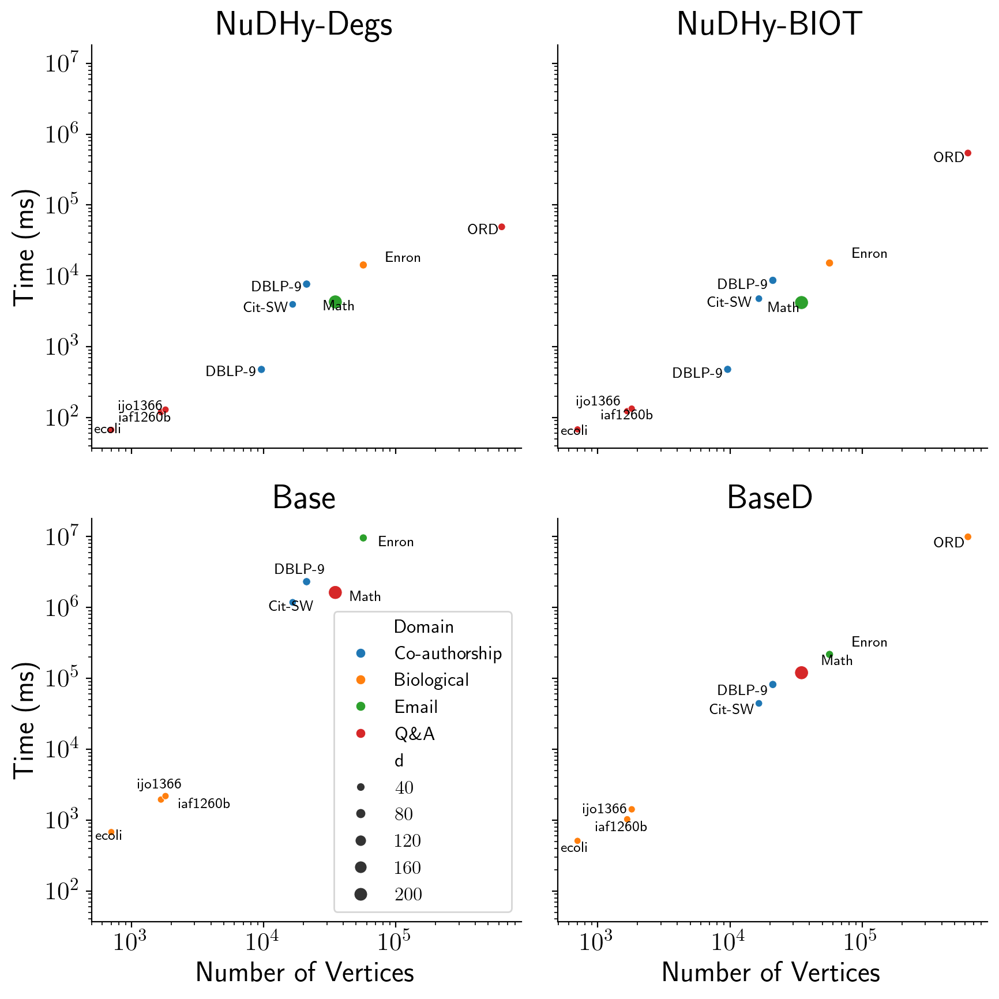

In [25]:
fig, ax = plt.subplots(2, 2, figsize=(9,9), sharex=True, sharey=True)

data = avg_runtimes[avg_runtimes['Sampler']!='NuDHy-Degs-MH']

for s, samp in enumerate(['NuDHy-Degs', 'NuDHy-BIOT', 'Base', 'BaseD']):
    
    r = s // 2
    c = s % 2
    ann = data[data['Sampler']==samp]
    sns.scatterplot(data=ann, x='n', y='Time (ms)', ax=ax[r][c],
                    size='d', hue='Domain')

    # add annotations
    texts = []
    for line in ann.index:
        tx = ax[r][c].text(ann['n'][line]+10, ann['Time (ms)'][line]+10, ann['DataSet'][line], 
                           horizontalalignment='left', fontsize=9, color='black')
        texts.append(tx)

    ax[r][c].set_yscale('log')
    ax[r][c].set_xscale('log')
    ax[r][c].set_title(samp)
    if r > 0:
        ax[r][c].set_xlabel('Number of Vertices')
    else:
        ax[r][c].set_xlabel('')
        ax[r][c].legend().remove()
    if c > 0:
        ax[r][c].legend().remove()
        ax[r][c].set_ylabel('')
    else:
        if r > 0:
            ax[r][c].legend(fontsize=12)

    adjustText.adjust_text(texts, avoid_self=True, expand=(1.2, 1.2), ax=ax[r][c])
plt.tight_layout()
plt.savefig(f'running_times.pdf', bbox_inches='tight')
plt.show()

# Convergence

In [69]:
colors = [
    "#119DA4", # cyan
    "#3D1308", # brown
]

palette = sns.color_palette(colors)

In [70]:
combo_names = {0 : r'$\mathcal{D}_{V,1}$',
               1 : r'$\mathcal{D}_{V,-1}$'}

In [71]:
result_dir = results_path + 'convergence'
seed = 0

Read Data

In [72]:
conv_db = ['eco01100', 'metabolic_iaf1260b', 'metabolic_ijo1366', 
           'citation_software', 'dblp_v9', 'enron', 'qna_math', 'uspto19762016']

In [73]:
dfs = []
for db in conv_db:
    try:
        with open(f'{data_path}/{db}.tsv') as in_f:
            _, edges = read_as_edge_list(in_f, dict())
        file = f'{result_dir}/Convergence__Dataset_{db}.tsv__sampleNumber_{seed}__k_20__size_3'
        tmp_df = pd.read_csv(file, sep=' ')
        tmp_df['NumOnes'] = len(edges)
        dfs.append(tmp_df)
    except Exception as e:
        print(db, e)
conv_df = pd.concat(dfs)
conv_df.drop(columns=['Date'], inplace=True)

In [74]:
conv_df['NumSwapsFactor'] = conv_df['iterations'] / conv_df['NumOnes']
conv_df['NumSwapsFactor'] = conv_df['NumSwapsFactor'].apply(lambda x : round(x, 2))

Combo to Plot

In [75]:
idxs = {'eco01100': 0, 
        'dblp_v9': 0, 
        'enron': 1, 
        'qna_math': 1,
        'uspto19762016': 0, 
        'metabolic_iaf1260b': 0, 
        'metabolic_ijo1366': 0,
        'citation_software': 0
        }

styles = ['-', '--']

In [76]:
def pprint(x,y):
    return '$\\textsc{'+x+'}$:'+y

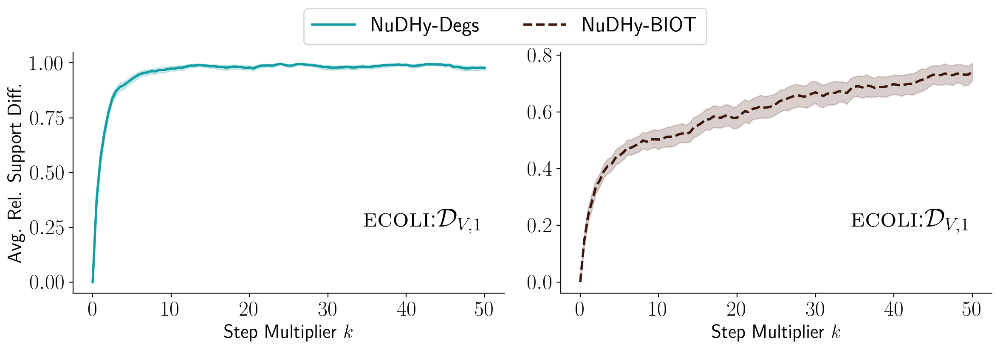

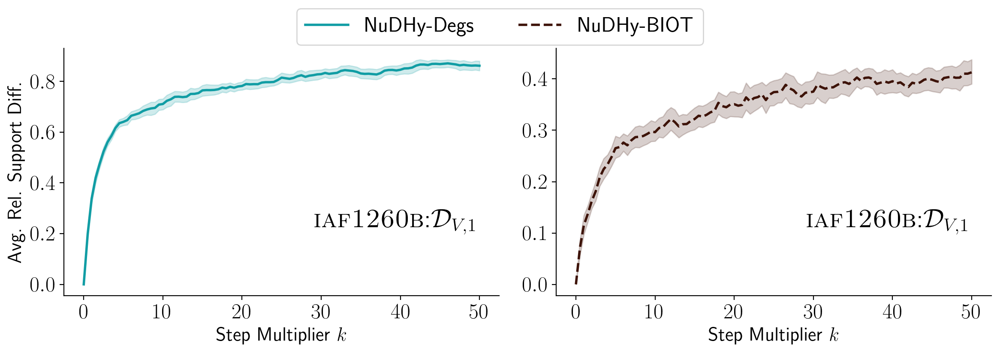

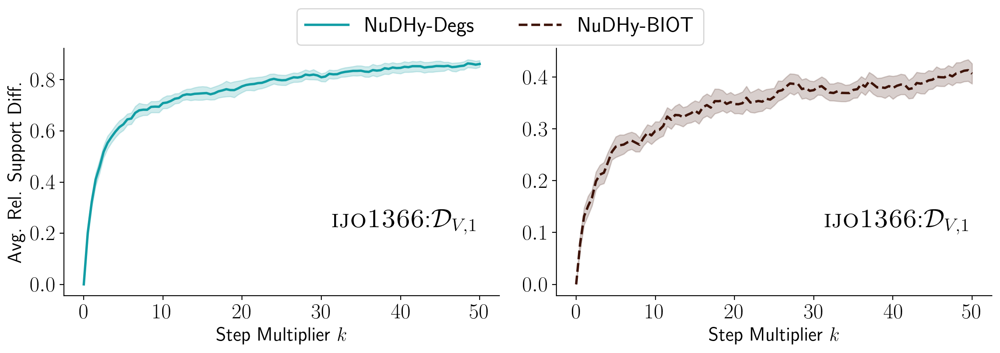

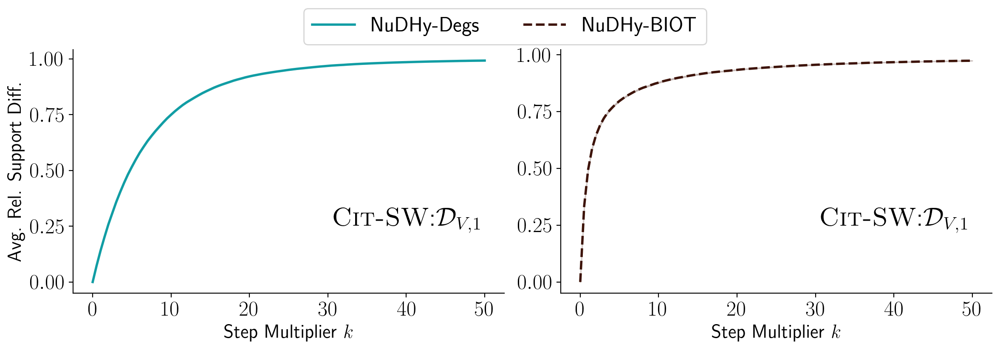

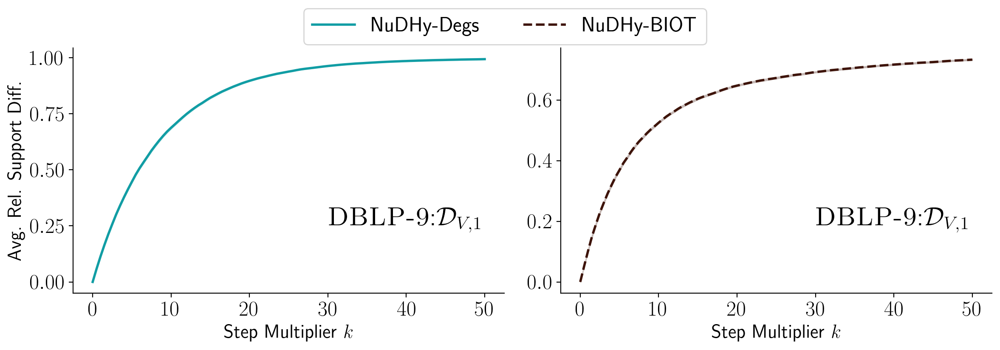

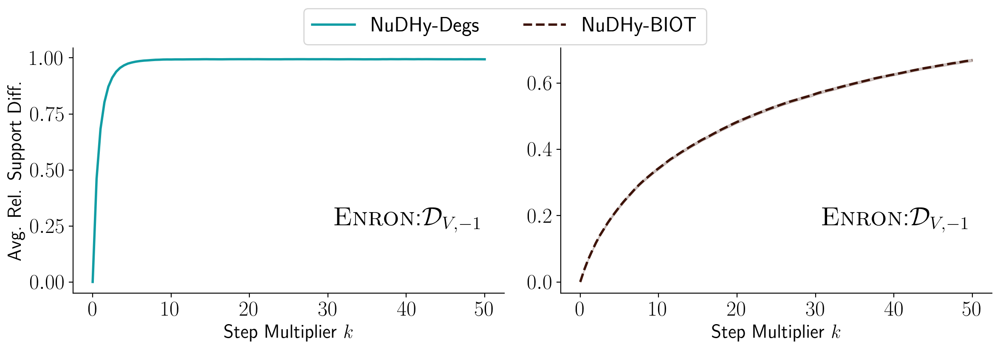

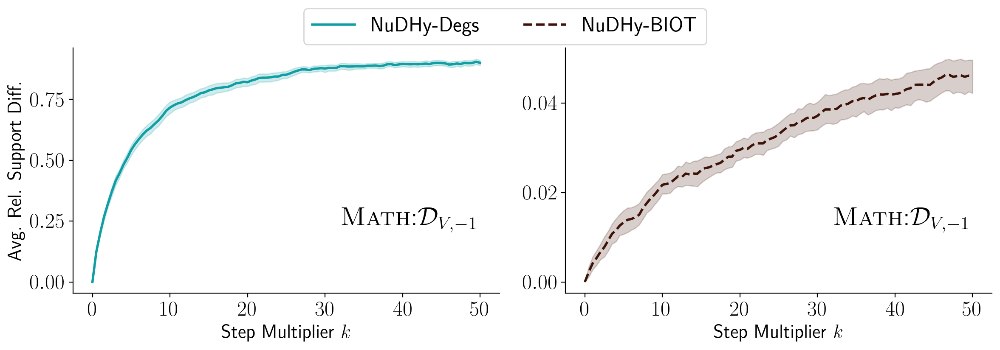

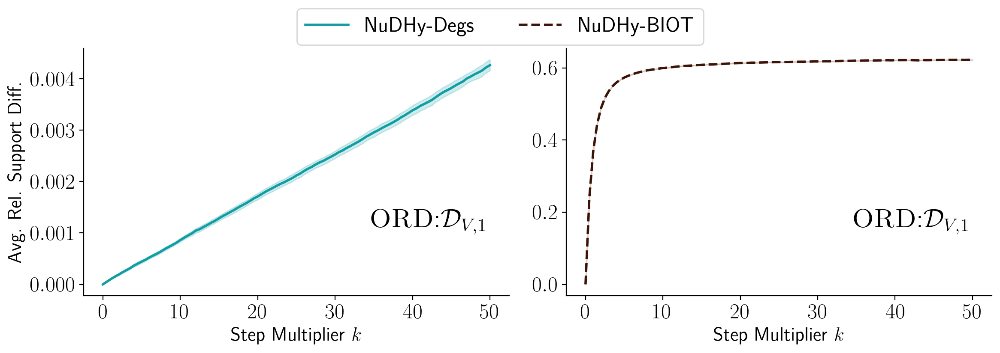

In [77]:
for dataset in conv_df['Dataset'].unique():

    data = conv_df[(conv_df['Dataset']==dataset)]
    algos = sorted(list(data['algorithm'].unique()))
    num_colors = len(algos)
    
    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    
    data1 = data[data['algorithm']=='NuDHy_A']
    sns.lineplot(data=data1, x='NumSwapsFactor', y=f'AvgRelFreqDiff_{idxs[dataset]}', 
                 color=colors[0], ax=ax[0],
                 linestyle=styles[0], linewidth=2, label='NuDHy_A')
    ax[0].spines['right'].set_visible(False)
    ax[0].spines['top'].set_visible(False)
    ax[0].spines['left'].set_visible(True)
    ax[0].spines['bottom'].set_visible(True)
    ax[0].set_xlabel(r'Step Multiplier $k$', fontsize=16)
    ax[0].set_ylabel('Avg. Rel. Support Diff.', fontsize=16)
    ax[0].text(0.95, .35, r'{}'.format(pprint(dataset_names[dataset], combo_names[idxs[dataset]])), 
               ha='right', va='top', transform=ax[0].transAxes, 
               color='black', fontsize=22)

    data2 = data[data['algorithm']=='NuDHy_C']  
    sns.lineplot(data=data2, x='NumSwapsFactor', y=f'AvgRelFreqDiff_{idxs[dataset]}',
                 color=colors[1], ax=ax[1],
                 linestyle=styles[1], linewidth=2, label='NuDHy_C')
    ax[1].spines['right'].set_visible(False)
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['left'].set_visible(True)
    ax[1].spines['bottom'].set_visible(True)
    ax[1].set_xlabel(r'Step Multiplier $k$', fontsize=16)
    ax[1].set_ylabel('')
    ax[1].text(0.95, .35, r'{}'.format(pprint(dataset_names[dataset], combo_names[idxs[dataset]])), 
               ha='right', va='top', transform=ax[1].transAxes, 
               color='black', fontsize=22)
    
    handles = ax[0].legend().legend_handles
    handles.extend(ax[1].legend().legend_handles)
    [h.set_markersize(8) for h in handles]
    labels = [text.get_text() for text in ax[0].legend().get_texts()]
    labels.extend([text.get_text() for text in ax[1].legend().get_texts()])
    labels = [sampler_names.get(l) for l in labels]
    ax[0].legend().remove()
    ax[1].legend().remove()
    fig.legend(handles=handles, labels=labels, loc='upper center', markerscale=2.,
               bbox_to_anchor=(0.5, 1.08), ncol=2)

    plt.tight_layout()
    plt.savefig(f'convergence_{dataset}_k20_s3.pdf', bbox_inches='tight')
    plt.show()

## ADF

In [78]:
# significance level
alpha = 0.05
num_windows = 3
sign_thresh = dict()

for dataset in conv_df['Dataset'].unique():
    
    sign_thresh[dataset] = dict()

    data = conv_df[(conv_df['Dataset']==dataset)]
    
    for idx, sam in enumerate(['NuDHy_A', 'NuDHy_C']):
        
        sign_thresh[dataset][sam] = []
    
        data1 = data[data['algorithm']==sam]
        timestamps = sorted(data1['NumSwapsFactor'].unique())
        m = len(data1['randomSeed'].unique())
        step = int(len(timestamps) / num_windows)
        
        for idx2 in data1['randomSeed'].unique():
            for idx_t in range(0, len(timestamps), step):
            
                t = timestamps[idx_t]
                next_t = timestamps[min(idx_t + step, len(timestamps) - 1)]
            
                data1v = data1[(data1['randomSeed']==idx2) &
                               (data1['NumSwapsFactor']>=t) & 
                               (data1['NumSwapsFactor']<next_t)].sort_values(by='NumSwapsFactor')
                series = data1v[f'AvgRelFreqDiff_{idxs[dataset]}'].values
                try:
                    sol = DFGLS(series, trend='c', lags=1)
                    p_value = sol.pvalue
                    if p_value <= alpha and p_value != 0:
                        sign_thresh[dataset][sam].append(t)
                        break
                except:
                    pass

/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use

/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use

/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use

/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use

/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use

/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self._stat = resols.tvalues[0]
/Users/giulia/miniconda3/lib/python3.10/site-packages/arch/unitroot/unitroot.py:955: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use

In [79]:
start_t = dict()
for db in sign_thresh:
    start_t[db] = []
    db_dict = sign_thresh[db]
    for idx, sam in enumerate(['NuDHy_A', 'NuDHy_C']):
        sam_lst = db_dict[sam]
        if len(sam_lst) == 0:
            start_t[db].append(-1)
        else:
            start_t[db].append(sum(sam_lst)/len(sam_lst))

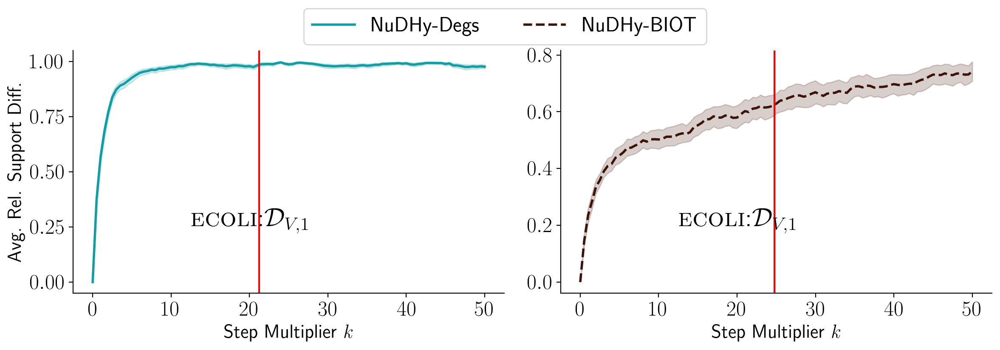

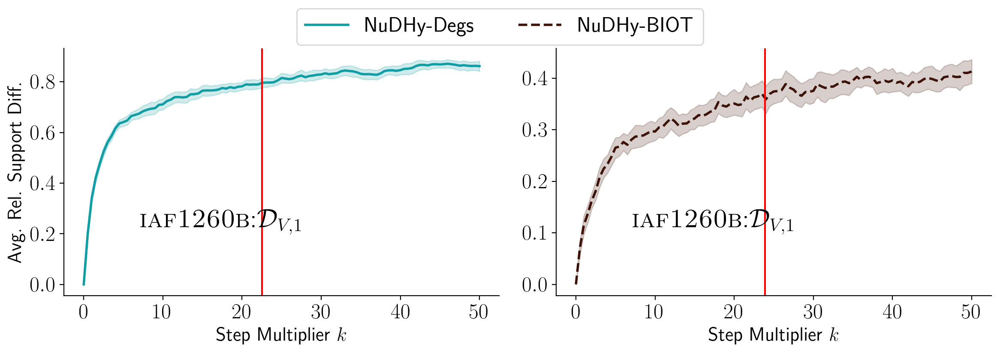

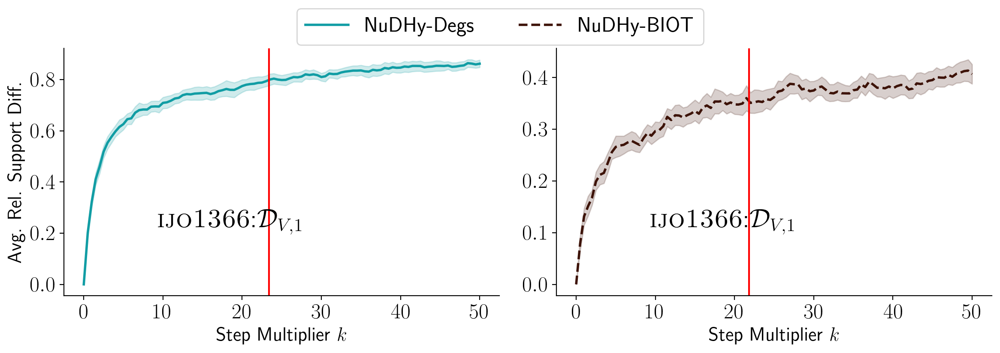

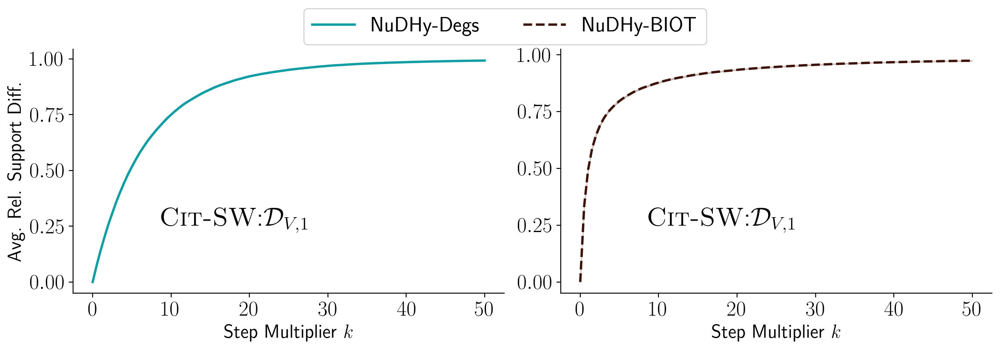

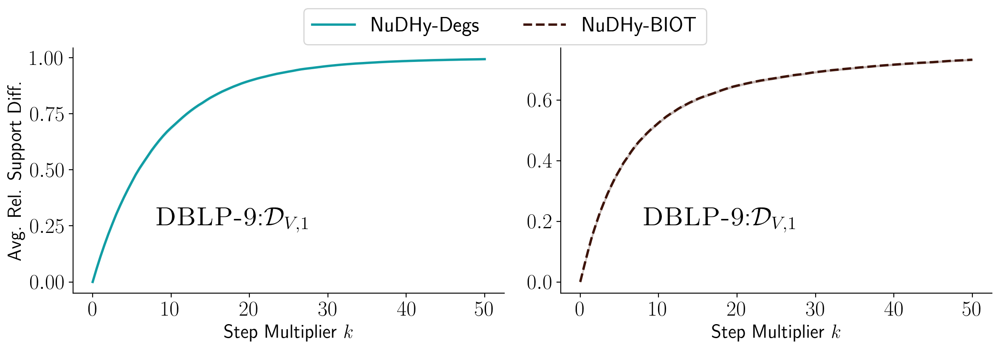

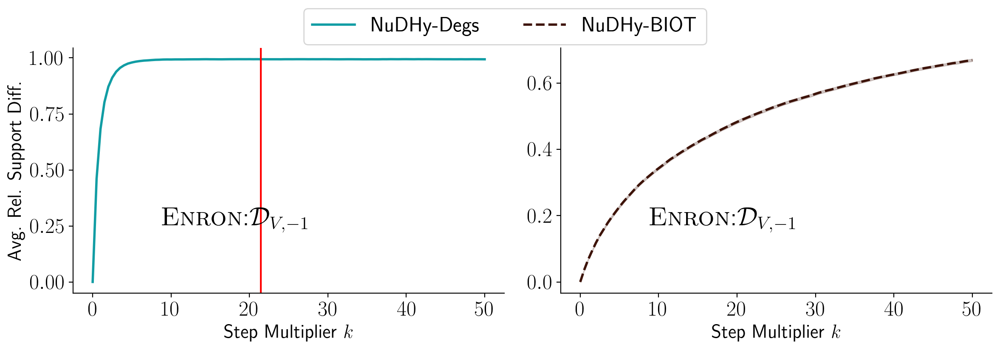

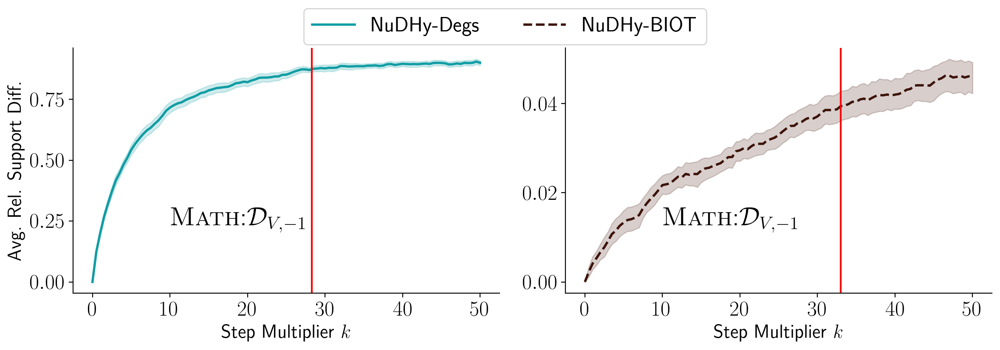

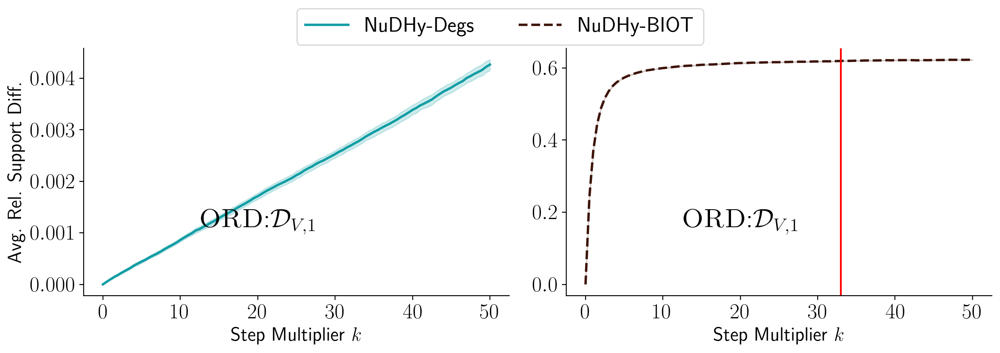

In [80]:
for dataset in conv_df['Dataset'].unique():

    fig, ax = plt.subplots(1, 2, figsize=(12,4))
    
    data = conv_df[(conv_df['Dataset']==dataset)]
    data1 = data[data['algorithm']=='NuDHy_A']
    data2 = data[data['algorithm']=='NuDHy_C']
            
    sns.lineplot(data=data1, x='NumSwapsFactor', y=f'AvgRelFreqDiff_{idxs[dataset]}', 
                 color=colors[0], ax=ax[0],
                 linestyle=styles[0], linewidth=2, label='NuDHy_A')
    ax[0].spines['right'].set_visible(False)
    ax[0].spines['top'].set_visible(False)
    ax[0].spines['left'].set_visible(True)
    ax[0].spines['bottom'].set_visible(True)
    ax[0].set_xlabel(r'Step Multiplier $k$', fontsize=16)
    ax[0].set_ylabel('Avg. Rel. Support Diff.', fontsize=16)
    ax[0].text(0.55, .35, r'{}'.format(pprint(dataset_names[dataset], combo_names[idxs[dataset]])), 
               ha='right', va='top', transform=ax[0].transAxes, color='black', fontsize=22)
    if start_t[dataset][0] > -1:
        ax[0].axvline(start_t[dataset][0], color='red')

    sns.lineplot(data=data2, x='NumSwapsFactor', y=f'AvgRelFreqDiff_{idxs[dataset]}',
                 color=colors[1], ax=ax[1],
                 linestyle=styles[1], linewidth=2, label='NuDHy_C')
    ax[1].spines['right'].set_visible(False)
    ax[1].spines['top'].set_visible(False)
    ax[1].spines['left'].set_visible(True)
    ax[1].spines['bottom'].set_visible(True)
    ax[1].set_xlabel(r'Step Multiplier $k$', fontsize=16)
    ax[1].set_ylabel('')
    ax[1].text(0.55, .35, r'{}'.format(pprint(dataset_names[dataset], combo_names[idxs[dataset]])), 
               ha='right', va='top', transform=ax[1].transAxes, color='black', fontsize=22)
    if start_t[dataset][1] > -1:
        ax[1].axvline(start_t[dataset][1], color='red')

    handles = ax[0].legend().legend_handles
    handles.extend(ax[1].legend().legend_handles)
    [h.set_markersize(8) for h in handles]
    labels = [text.get_text() for text in ax[0].legend().get_texts()]
    labels.extend([text.get_text() for text in ax[1].legend().get_texts()])
    labels = [sampler_names.get(l) for l in labels]
    ax[0].legend().remove()
    ax[1].legend().remove()
    fig.legend(handles=handles, labels=labels, loc='upper center', markerscale=2.,
               bbox_to_anchor=(0.5, 1.08), ncol=2)

    plt.tight_layout()
#     plt.savefig(f'convergence_{dataset}_k20_s3_adf.pdf', bbox_inches='tight')
    plt.show()